In [1]:
import warnings
warnings.filterwarnings
import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
%matplotlib inline
import xgboost as xgb
import os
os.getcwd()

'C:\\Users\\Admin'

In [2]:
appl_data = pd.read_csv('application_data.csv')
appl_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [3]:
appl_data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [4]:
appl_data.shape

(307511, 122)

In [5]:
appl_data.info(verbose = True, null_counts = True)

C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\798788446.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  appl_data.info(verbose = True, null_counts = True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Non-Null Count   Dtype  
---   ------                        --------------   -----  
 0    SK_ID_CURR                    307511 non-null  int64  
 1    TARGET                        307511 non-null  int64  
 2    NAME_CONTRACT_TYPE            307511 non-null  object 
 3    CODE_GENDER                   307511 non-null  object 
 4    FLAG_OWN_CAR                  307511 non-null  object 
 5    FLAG_OWN_REALTY               307511 non-null  object 
 6    CNT_CHILDREN                  307511 non-null  int64  
 7    AMT_INCOME_TOTAL              307511 non-null  float64
 8    AMT_CREDIT                    307511 non-null  float64
 9    AMT_ANNUITY                   307499 non-null  float64
 10   AMT_GOODS_PRICE               307233 non-null  float64
 11   NAME_TYPE_SUITE               306219 non-null  object 
 12   NAME_INCOME_TYPE            

In [6]:
appl_data.select_dtypes(include = "object").columns

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
       'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'],
      dtype='object')

In [7]:
len(appl_data.select_dtypes(include = "object").columns)

16

In [8]:
appl_data.select_dtypes(include = ['int64', 'float64']).columns

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=106)

In [9]:
len(appl_data.select_dtypes(include = ['int64','float64']).columns)

106

In [10]:
appl_data.select_dtypes(include = ['int64','float64'])

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,0,157500.0,254700.0,27558.0,225000.0,0.032561,-9327,-236,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,0,72000.0,269550.0,12001.5,225000.0,0.025164,-20775,365243,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,0,153000.0,677664.0,29979.0,585000.0,0.005002,-14966,-7921,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,0,171000.0,370107.0,20205.0,319500.0,0.005313,-11961,-4786,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [11]:
appl_data.dtypes

SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 122, dtype: object

In [12]:
appl_data.isnull().values.any()

True

In [13]:
appl_data.isnull().values.sum()

9152465

In [14]:
appl_data.columns[appl_data.isnull().any()]

Index(['AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'OWN_CAR_AGE',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_1', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG',
       'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG',
       'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG',
       'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE',
       'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE',
       'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE',
       'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE',
       'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE',
       'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI',
       'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI',
       'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMI

In [15]:
len(appl_data.columns[appl_data.isnull().any()])

67

In [16]:
null_value = appl_data.isnull().sum()

In [17]:
null_per = round((null_value/appl_data.shape[0])*100,2)

In [18]:
null_appl=pd.DataFrame({'columns_name': appl_data.columns, 'null value': null_value, 'null percatage': null_per})
null_appl.reset_index(drop = True, inplace = True)

In [19]:
null_appl.sort_values(by = 'null percatage',ascending = False)

,columns_name,null value,null percatage
76,COMMONAREA_MEDI,214865,69.87
48,COMMONAREA_AVG,214865,69.87
62,COMMONAREA_MODE,214865,69.87
70,NONLIVINGAPARTMENTS_MODE,213514,69.43
56,NONLIVINGAPARTMENTS_AVG,213514,69.43
...,...,...,...
14,NAME_FAMILY_STATUS,0,0.00
13,NAME_EDUCATION_TYPE,0,0.00
12,NAME_INCOME_TYPE,0,0.00
9,AMT_ANNUITY,12,0.00


In [20]:
drop_columns = null_appl[null_appl['null percatage']>40].columns_name.to_list()
drop_columns

['OWN_CAR_AGE',
 'EXT_SOURCE_1',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'ELEVATORS_MEDI',
 'ENTRANCES_MEDI',
 'FLOORSMAX_MEDI',
 'FLOORSMIN_MEDI',
 'LANDAREA_MEDI',
 'LIVINGAPARTMENTS_MEDI',
 'LIVINGAREA_MEDI',
 'NONLIVINGAPARTMENTS_MEDI',
 'NONLIVINGAREA_MEDI',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'TOTALAREA_MOD

In [21]:
len(drop_columns)

49

In [22]:
appl_data.drop(columns = drop_columns, inplace = True)

In [23]:
appl_data.shape

(307511, 73)

In [24]:
null_appl_under_40 = null_appl[null_appl['null percatage']<40]
null_appl_under_40.sort_values(by = 'null percatage',ascending = False )

,columns_name,null value,null percatage
28,OCCUPATION_TYPE,96391,31.35
43,EXT_SOURCE_3,60965,19.83
121,AMT_REQ_CREDIT_BUREAU_YEAR,41519,13.50
120,AMT_REQ_CREDIT_BUREAU_QRT,41519,13.50
119,AMT_REQ_CREDIT_BUREAU_MON,41519,13.50
...,...,...,...
33,HOUR_APPR_PROCESS_START,0,0.00
34,REG_REGION_NOT_LIVE_REGION,0,0.00
35,REG_REGION_NOT_WORK_REGION,0,0.00
36,LIVE_REGION_NOT_WORK_REGION,0,0.00


In [25]:
appl_data['OCCUPATION_TYPE'].value_counts()

Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

In [26]:
appl_data['OCCUPATION_TYPE'].fillna(value = 'Unkown', inplace = True)

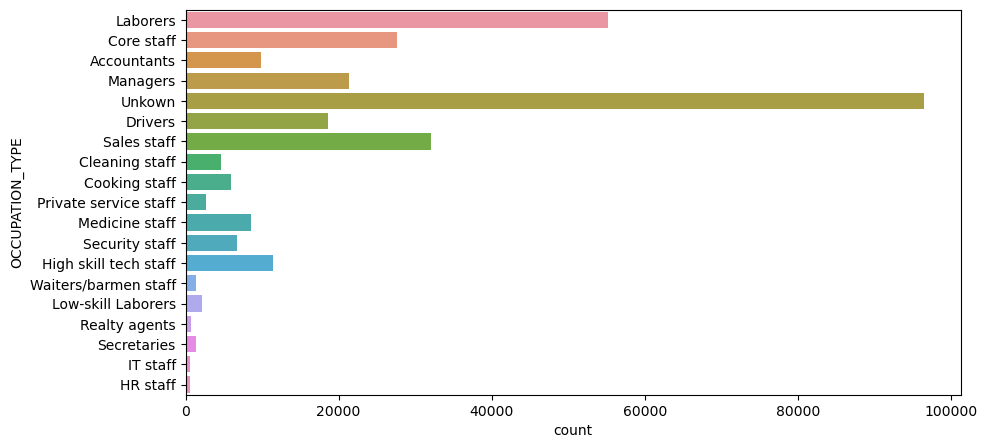

In [27]:
plt.figure(figsize = (10,5))
sns.countplot(data = appl_data, y = 'OCCUPATION_TYPE')
plt.show()

In [28]:
appl_data.EXT_SOURCE_3.value_counts().head()

0.746300    1460
0.713631    1315
0.694093    1276
0.670652    1191
0.652897    1154
Name: EXT_SOURCE_3, dtype: int64

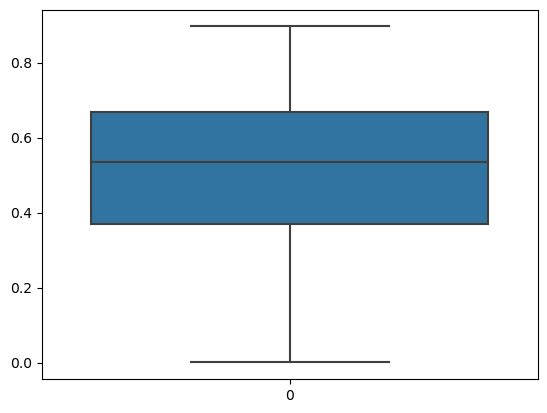

In [29]:
sns.boxplot(appl_data.EXT_SOURCE_3)
plt.show()

In [30]:
appl_data.EXT_SOURCE_3.quantile(q=[0.25,0.5,0.75,1])

0.25    0.370650
0.50    0.535276
0.75    0.669057
1.00    0.896010
Name: EXT_SOURCE_3, dtype: float64

In [31]:
appl_data.EXT_SOURCE_3.mode()[0]

0.746300213050371

In [32]:
appl_data.EXT_SOURCE_3.mean()

0.5108529061799658

In [33]:
appl_data[['AMT_REQ_CREDIT_BUREAU_YEAR',
    'AMT_REQ_CREDIT_BUREAU_QRT',
    'AMT_REQ_CREDIT_BUREAU_MON',
    'AMT_REQ_CREDIT_BUREAU_WEEK',
    'AMT_REQ_CREDIT_BUREAU_DAY',
    'AMT_REQ_CREDIT_BUREAU_HOUR']].describe()

,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR
count,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,1.899974,0.265474,0.267395,0.034362,0.007000,0.006402
std,1.869295,0.794056,0.916002,0.204685,0.110757,0.083849
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,25.000000,261.000000,27.000000,8.000000,9.000000,4.000000


In [34]:
appl_data[['AMT_REQ_CREDIT_BUREAU_YEAR',
    'AMT_REQ_CREDIT_BUREAU_QRT',
    'AMT_REQ_CREDIT_BUREAU_MON',
    'AMT_REQ_CREDIT_BUREAU_WEEK',
    'AMT_REQ_CREDIT_BUREAU_DAY',
    'AMT_REQ_CREDIT_BUREAU_HOUR']].mode()

,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR
0,0.0,0.0,0.0,0.0,0.0,0.0


In [35]:
appl_data_null_under1 = null_appl[(null_appl['null percatage']>0)&(null_appl['null percatage']<1)]

In [36]:
appl_data_null_under1.sort_values(by = 'null percatage', ascending = False)

,columns_name,null value,null percatage
11,NAME_TYPE_SUITE,1292,0.42
91,OBS_30_CNT_SOCIAL_CIRCLE,1021,0.33
92,DEF_30_CNT_SOCIAL_CIRCLE,1021,0.33
93,OBS_60_CNT_SOCIAL_CIRCLE,1021,0.33
94,DEF_60_CNT_SOCIAL_CIRCLE,1021,0.33
42,EXT_SOURCE_2,660,0.21
10,AMT_GOODS_PRICE,278,0.09


In [37]:
appl_data['NAME_TYPE_SUITE'].value_counts()

Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

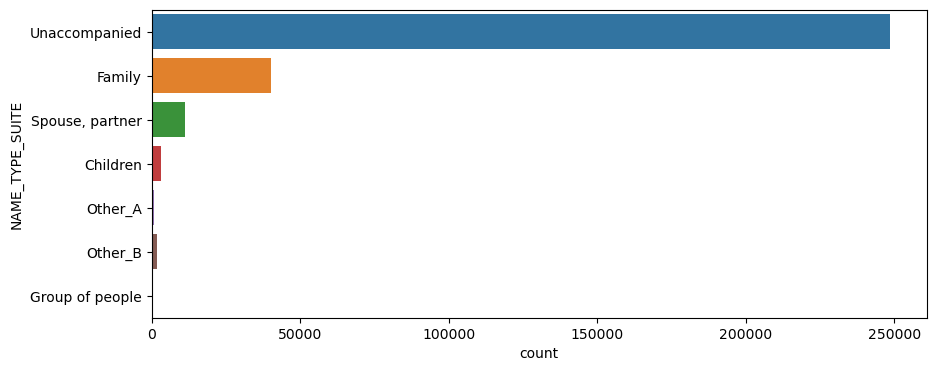

In [38]:
plt.figure(figsize=(10,4))
sns.countplot(data = appl_data, y='NAME_TYPE_SUITE')
plt.show()

In [39]:
appl_data.OBS_30_CNT_SOCIAL_CIRCLE.value_counts().head()

0.0    163910
1.0     48783
2.0     29808
3.0     20322
4.0     14143
Name: OBS_30_CNT_SOCIAL_CIRCLE, dtype: int64

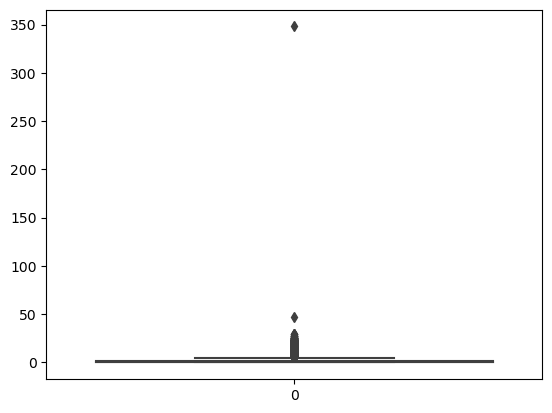

In [40]:
sns.boxplot(appl_data.OBS_30_CNT_SOCIAL_CIRCLE)
plt.show()

In [41]:
appl_data.OBS_30_CNT_SOCIAL_CIRCLE.quantile(q = [0.25,0.5,0.75,1])

0.25      0.0
0.50      0.0
0.75      2.0
1.00    348.0
Name: OBS_30_CNT_SOCIAL_CIRCLE, dtype: float64

In [42]:
appl_data.OBS_30_CNT_SOCIAL_CIRCLE.mode()[0]

0.0

In [43]:
appl_data.OBS_30_CNT_SOCIAL_CIRCLE.mean()

1.4222454239942575

In [44]:
appl_data.DEF_30_CNT_SOCIAL_CIRCLE.value_counts().head()

0.0    271324
1.0     28328
2.0      5323
3.0      1192
4.0       253
Name: DEF_30_CNT_SOCIAL_CIRCLE, dtype: int64

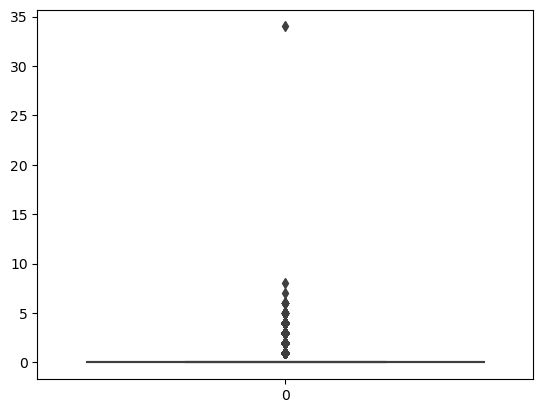

In [45]:
sns.boxplot(appl_data.DEF_30_CNT_SOCIAL_CIRCLE)
plt.show()

In [46]:
appl_data.DEF_30_CNT_SOCIAL_CIRCLE.quantile(q=[0.25,0.5,0.75,1])

0.25     0.0
0.50     0.0
0.75     0.0
1.00    34.0
Name: DEF_30_CNT_SOCIAL_CIRCLE, dtype: float64

In [47]:
appl_data.DEF_30_CNT_SOCIAL_CIRCLE.mode()[0]

0.0

In [48]:
appl_data.DEF_30_CNT_SOCIAL_CIRCLE.mean()

0.1434206662533851

In [49]:
appl_data.OBS_60_CNT_SOCIAL_CIRCLE.value_counts().head()

0.0    164666
1.0     48870
2.0     29766
3.0     20215
4.0     13946
Name: OBS_60_CNT_SOCIAL_CIRCLE, dtype: int64

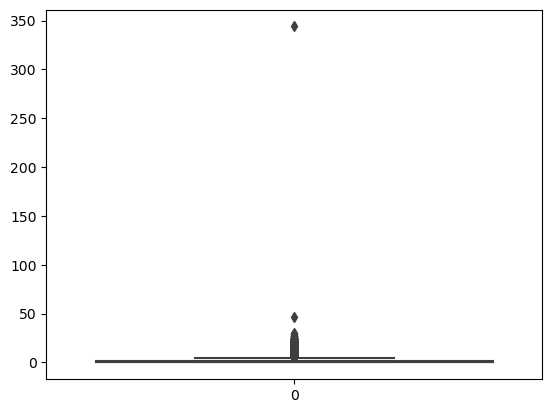

In [50]:
sns.boxplot(appl_data.OBS_60_CNT_SOCIAL_CIRCLE)
plt.show()

In [51]:
appl_data.OBS_60_CNT_SOCIAL_CIRCLE.quantile(q=[0.25,0.5,0.75,1])

0.25      0.0
0.50      0.0
0.75      2.0
1.00    344.0
Name: OBS_60_CNT_SOCIAL_CIRCLE, dtype: float64

In [52]:
appl_data.OBS_60_CNT_SOCIAL_CIRCLE.mode()[0]

0.0

In [53]:
appl_data.OBS_60_CNT_SOCIAL_CIRCLE.mean()

1.4052921791901856

In [54]:
appl_data.DEF_60_CNT_SOCIAL_CIRCLE.value_counts().head()

0.0    280721
1.0     21841
2.0      3170
3.0       598
4.0       135
Name: DEF_60_CNT_SOCIAL_CIRCLE, dtype: int64

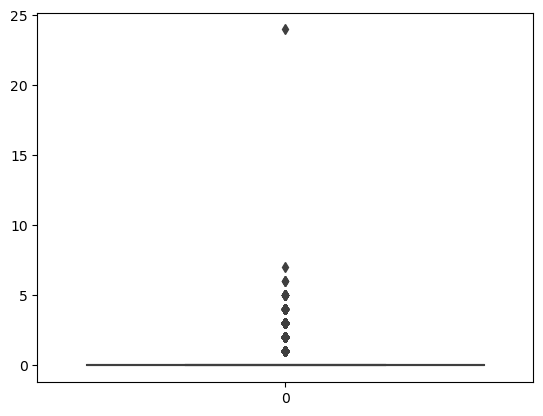

In [55]:
sns.boxplot(appl_data.DEF_60_CNT_SOCIAL_CIRCLE)
plt.show()

In [56]:
appl_data.DEF_60_CNT_SOCIAL_CIRCLE.quantile(q=[0.25,0.5,0.75,1])

0.25     0.0
0.50     0.0
0.75     0.0
1.00    24.0
Name: DEF_60_CNT_SOCIAL_CIRCLE, dtype: float64

In [57]:
appl_data.DEF_60_CNT_SOCIAL_CIRCLE.mode()[0]

0.0

In [58]:
appl_data.DEF_60_CNT_SOCIAL_CIRCLE.mean()

0.10004894123788705

In [59]:
appl_data.EXT_SOURCE_2.value_counts().head()

0.285898    721
0.262258    417
0.265256    343
0.159679    322
0.265312    306
Name: EXT_SOURCE_2, dtype: int64

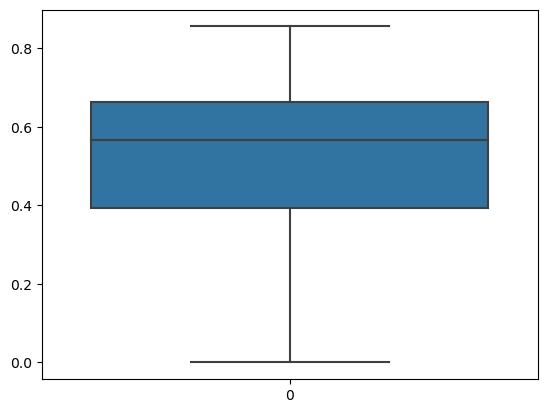

In [60]:
sns.boxplot(appl_data.EXT_SOURCE_2)
plt.show()

In [61]:
appl_data.EXT_SOURCE_2.quantile(q=[0.25,0.5,0.75,1])

0.25    0.392457
0.50    0.565961
0.75    0.663617
1.00    0.855000
Name: EXT_SOURCE_2, dtype: float64

In [62]:
appl_data.EXT_SOURCE_2.mode()[0]

0.2858978721410488

In [63]:
appl_data.EXT_SOURCE_2.mean()

0.5143926741308462

In [64]:
appl_data.AMT_GOODS_PRICE.value_counts().head()

450000.0    26022
225000.0    25282
675000.0    24962
900000.0    15416
270000.0    11428
Name: AMT_GOODS_PRICE, dtype: int64

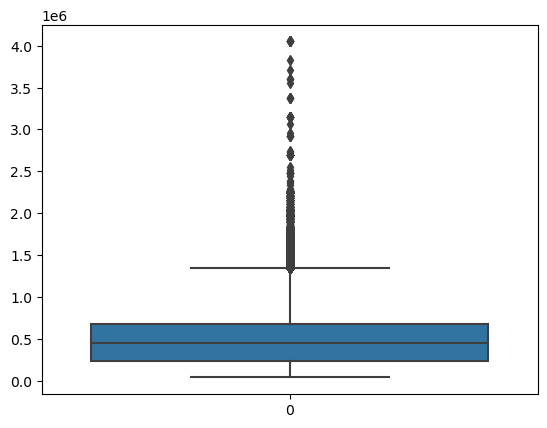

In [65]:
sns.boxplot(appl_data.AMT_GOODS_PRICE)
plt.show()

In [66]:
appl_data.AMT_GOODS_PRICE.quantile(q=[0.25,0.5,0.75,1])

0.25     238500.0
0.50     450000.0
0.75     679500.0
1.00    4050000.0
Name: AMT_GOODS_PRICE, dtype: float64

In [67]:
appl_data.AMT_GOODS_PRICE.mode()[0]

450000.0

In [68]:
appl_data.AMT_GOODS_PRICE.mean()

538396.2074288895

In [69]:
appl_data['CODE_GENDER'].value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

In [70]:
appl_data[appl_data['CODE_GENDER']=='XNA']

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
35657,141289,0,Revolving loans,XNA,Y,Y,0,207000.0,382500.0,19125.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
38566,144669,0,Revolving loans,XNA,N,Y,2,157500.0,270000.0,13500.0,...,0,0,0,0,0.0,0.0,0.0,3.0,0.0,4.0
83382,196708,0,Revolving loans,XNA,N,Y,1,135000.0,405000.0,20250.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
189640,319880,0,Revolving loans,XNA,Y,Y,0,247500.0,540000.0,27000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,6.0


In [71]:
appl_data['CODE_GENDER'] = appl_data['CODE_GENDER'].apply(lambda x: 'F' if x == 'XNA' else x)

In [72]:
appl_data['CODE_GENDER'].value_counts()

F    202452
M    105059
Name: CODE_GENDER, dtype: int64

In [73]:
appl_data['DAYS_BIRTH'].value_counts().head()

-13749    43
-13481    42
-18248    41
-10020    41
-15771    40
Name: DAYS_BIRTH, dtype: int64

In [74]:
appl_data['DAYS_BIRTH'].unique()

array([ -9461, -16765, -19046, ...,  -7951,  -7857, -25061], dtype=int64)

In [75]:
appl_data['DAYS_BIRTH'].nunique()

17460

In [76]:
appl_data['DAYS_BIRTH'] = appl_data['DAYS_BIRTH'].apply(lambda x: -x if x < 0 else x)

In [77]:
appl_data['DAYS_BIRTH'].value_counts()

13749    43
13481    42
18248    41
10020    41
15771    40
         ..
24898     1
24868     1
8017      1
25098     1
25061     1
Name: DAYS_BIRTH, Length: 17460, dtype: int64

In [78]:
appl_data['YEARS_BIRTH'] = appl_data['DAYS_BIRTH'].apply(lambda x: round(x/365))

In [79]:
appl_data['NAME_FAMILY_STATUS'].value_counts()

Married                 196432
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64

In [80]:
appl_data[appl_data['NAME_FAMILY_STATUS'] == 'Unknown']

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH
41982,148605,0,Revolving loans,M,N,Y,0,450000.0,675000.0,33750.0,...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,34
187348,317181,0,Revolving loans,F,N,Y,0,202500.0,585000.0,29250.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,35


In [81]:
appl_data['NAME_FAMILY_STATUS'].value_counts(normalize = True) * 100

Married                 63.878040
Single / not married    14.778008
Civil marriage           9.682580
Separated                6.429038
Widow                    5.231683
Unknown                  0.000650
Name: NAME_FAMILY_STATUS, dtype: float64

In [82]:
appl_data['NAME_FAMILY_STATUS'] = appl_data['NAME_FAMILY_STATUS'].apply(lambda x: 'Married' if x == 'Unknown' else x)

In [83]:
appl_data['NAME_FAMILY_STATUS'].value_counts()

Married                 196434
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Name: NAME_FAMILY_STATUS, dtype: int64

In [84]:
appl_data['DAYS_EMPLOYED'].value_counts().head()

 365243    55374
-200         156
-224         152
-230         151
-199         151
Name: DAYS_EMPLOYED, dtype: int64

In [85]:
appl_data['DAYS_EMPLOYED'].value_counts(normalize = True) * 100

 365243    18.007161
-200        0.050730
-224        0.049429
-230        0.049104
-199        0.049104
             ...    
-13961      0.000325
-11827      0.000325
-10176      0.000325
-9459       0.000325
-8694       0.000325
Name: DAYS_EMPLOYED, Length: 12574, dtype: float64

In [86]:
len(appl_data[appl_data['DAYS_EMPLOYED'] < 365243])

252137

In [87]:
appl_data[appl_data['DAYS_EMPLOYED'] < 365243].DAYS_EMPLOYED.value_counts()

-200      156
-224      152
-199      151
-230      151
-212      150
         ... 
-13961      1
-11827      1
-10176      1
-9459       1
-8694       1
Name: DAYS_EMPLOYED, Length: 12573, dtype: int64

In [88]:
appl_data['DAYS_EMPLOYED'].unique()

array([  -637,  -1188,   -225, ..., -12971, -11084,  -8694], dtype=int64)

In [89]:
appl_data['DAYS_EMPLOYED'].nunique()

12574

In [90]:
appl_data['DAYS_EMPLOYED'] = appl_data['DAYS_EMPLOYED'].apply(lambda x: -x if x < 0 else x)

In [91]:
appl_data['DAYS_EMPLOYED'].value_counts().head()

365243    55374
200         156
224         152
230         151
199         151
Name: DAYS_EMPLOYED, dtype: int64

In [92]:
appl_data[appl_data['DAYS_EMPLOYED'] == 365243].NAME_INCOME_TYPE.value_counts()

Pensioner     55352
Unemployed       22
Name: NAME_INCOME_TYPE, dtype: int64

In [93]:
appl_data['YEARS_EMPLOYED'] = appl_data['DAYS_EMPLOYED'].apply(lambda x: round(x/365))

In [94]:
appl_data['DAYS_REGISTRATION'].value_counts().head()

-1.0    113
-7.0     98
-6.0     96
-4.0     92
-2.0     92
Name: DAYS_REGISTRATION, dtype: int64

In [95]:
appl_data['DAYS_REGISTRATION'].value_counts(normalize = True).head()

-1.0    0.000367
-7.0    0.000319
-6.0    0.000312
-4.0    0.000299
-2.0    0.000299
Name: DAYS_REGISTRATION, dtype: float64

In [96]:
appl_data['DAYS_REGISTRATION'].unique()

array([ -3648.,  -1186.,  -4260., ..., -16396., -14558., -14798.])

In [97]:
appl_data['DAYS_REGISTRATION'].nunique()

15688

In [98]:
appl_data['DAYS_REGISTRATION'] = appl_data['DAYS_REGISTRATION'].apply(lambda x: -x if x < 0 else x)

In [99]:
appl_data['DAYS_REGISTRATION'].value_counts().head()

1.0    113
7.0     98
6.0     96
4.0     92
2.0     92
Name: DAYS_REGISTRATION, dtype: int64

In [100]:
appl_data['YEARS_REGISTRATION'] = appl_data['DAYS_REGISTRATION'].apply(lambda x: round(x/365))

In [101]:
appl_data['DAYS_ID_PUBLISH'].value_counts().head()

-4053    169
-4095    162
-4046    161
-4417    159
-4256    158
Name: DAYS_ID_PUBLISH, dtype: int64

In [102]:
appl_data['DAYS_ID_PUBLISH'].value_counts(normalize = True).head()

-4053    0.000550
-4095    0.000527
-4046    0.000524
-4417    0.000517
-4256    0.000514
Name: DAYS_ID_PUBLISH, dtype: float64

In [103]:
appl_data['DAYS_ID_PUBLISH'].unique()

array([-2120,  -291, -2531, ..., -6194, -5854, -6211], dtype=int64)

In [104]:
appl_data['DAYS_ID_PUBLISH'].nunique()

6168

In [105]:
appl_data['DAYS_ID_PUBLISH'] = appl_data['DAYS_ID_PUBLISH'].apply(lambda x: -x if x < 0 else x)

In [106]:
appl_data['DAYS_ID_PUBLISH'].value_counts().head()

4053    169
4095    162
4046    161
4417    159
4256    158
Name: DAYS_ID_PUBLISH, dtype: int64

In [107]:
appl_data['YEARS_ID_PUBLISH'] = appl_data['DAYS_ID_PUBLISH'].apply(lambda x: round(x/365))

In [108]:
appl_data['DAYS_LAST_PHONE_CHANGE'].value_counts().head()

 0.0    37672
-1.0     2812
-2.0     2318
-3.0     1763
-4.0     1285
Name: DAYS_LAST_PHONE_CHANGE, dtype: int64

In [109]:
appl_data['DAYS_LAST_PHONE_CHANGE'].value_counts(normalize = True).head()

 0.0    0.122507
-1.0    0.009144
-2.0    0.007538
-3.0    0.005733
-4.0    0.004179
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [110]:
appl_data['DAYS_LAST_PHONE_CHANGE'].unique()

array([-1134.,  -828.,  -815., ..., -3988., -3899., -3538.])

In [111]:
appl_data['DAYS_LAST_PHONE_CHANGE'].nunique()

3773

In [112]:
appl_data['DAYS_LAST_PHONE_CHANGE'] = appl_data['DAYS_LAST_PHONE_CHANGE'].apply(lambda x: -x if x < 0 else x)

In [113]:
appl_data['DAYS_LAST_PHONE_CHANGE'].value_counts().head()

0.0    37672
1.0     2812
2.0     2318
3.0     1763
4.0     1285
Name: DAYS_LAST_PHONE_CHANGE, dtype: int64

In [114]:
appl_data['YEARS_LAST_PHONE_CHANGE'] = appl_data['DAYS_LAST_PHONE_CHANGE'].apply(lambda x: round(x/365,0))

In [115]:
def fn_dist_box(dataset,column):
    plt.subplots(1,2 ,figsize = (20,8))

    plt.subplot(121)
    sns.distplot(dataset[column], color = 'purple')
    pltname = 'Distplot of ' + column
    plt.ticklabel_format(style='plain', axis='x')
    plt.title(pltname)

    plt.subplot(122)
    red_diamond = dict(markerfacecolor='r', marker='D')
    sns.boxplot(y = column, data = dataset, flierprops = red_diamond)
    pltname = 'Boxplot of ' + column
    plt.title(pltname)

    plt.tight_layout(pad = 4)
    plt.show()

In [116]:
def age_cat(years):
    if years <= 20:
        return '0-20'
    elif years > 20 and years <= 30:
        return '20-30'
    elif years > 30 and years <= 40:
        return '30-40'  
    elif years > 40 and years <= 50:
        return '40-50'
    elif years > 50 and years <= 60:
        return '50-60'
    elif years > 60 and years <= 70:
        return '60-70'
    elif years > 70:
        return '70+'

In [117]:
def fn_uni_countplot(column):
    plt.figure(figsize = [20,8])
    palt = sns.color_palette("bright")

    plt.subplot(1,2,1)
    pltname = column + ' of clients with payment difficulties'
    plt.title(pltname)
    sns.countplot(x = column, data = appl_data1, order = sorted(appl_data1[column].unique(), reverse = True), palette = palt)
    plt.xticks(rotation = 90)
    
    plt.subplot(1,2,2)
    pltname = column + ' of clients with on-time payments'
    plt.title(pltname)
    sns.countplot(x = column, data = appl_data0, order = sorted(appl_data0[column].unique(), reverse = True), palette = palt)
    plt.xticks(rotation = 90)

    plt.tight_layout(pad = 4)
    plt.show()

In [118]:
def fn_uni_piechart(column):
    plt.figure(figsize = [20,12])

    plt.subplot(1,2,1)
    pltname = column + ' of clients with payment difficulties'
    plt.title(pltname)
    appl_data1[column].value_counts().plot.pie(autopct='%1.1f%%',shadow=True, startangle=60, colors = ['green','yellow','purple','orange','red'], labeldistance=None)
    plt.legend()
    
    plt.subplot(1,2,2)
    pltname = column + ' of clients with on-time payments'
    plt.title(pltname)
    appl_data0[column].value_counts().plot.pie(autopct='%1.1f%%',shadow=True, startangle=60, colors = ['green','yellow','purple','orange','red'], labeldistance=None)
    
    plt.legend()
    plt.tight_layout(pad = 4)
    plt.show()

In [119]:
def fn_uni_barplot(column):
    plt.figure(figsize = [20,8])

    plt.subplot(1,2,1)
    (appl_data1[column].value_counts(normalize=True)*100).plot.bar(title = column + " Payment difficulties", color=['black', 'red', 'green', 'blue', 'cyan'])
    plt.xticks(rotation=90)

    plt.subplot(1,2,2)
    (appl_data0[column].value_counts(normalize=True)*100).plot.bar(title = column + " On-Time Payments", color=['black', 'red', 'green', 'blue', 'cyan'])
    plt.xticks(rotation=90)

    plt.tight_layout(pad = 4)
    plt.show()

In [120]:
def outlier_range(dataset,column):
    Q1 = dataset[column].quantile(0.25)
    Q3 = dataset[column].quantile(0.75)
    IQR = Q3 - Q1
    Min_value = (Q1 - 1.5 * IQR)
    Max_value = (Q3 + 1.5 * IQR)
    return Max_value

In [121]:
 def fn_bi_boxplot(categorical,continuous,max_continuous1,max_continuous0,hue_column):
    plt.figure(figsize = [20,12])

    plt.subplot(1,2,1)
    plt.title('Payment Difficulties')
    red_diamond = dict(markerfacecolor='r', marker='D')
    sns.boxplot(x = categorical, 
                y = appl_data1[appl_data1[continuous] < max_continuous1][continuous], 
                data = appl_data1, 
                flierprops = red_diamond, 
                order = sorted(appl_data1[categorical].unique(), reverse = True),
                hue = hue_column, hue_order = sorted(appl_data0[hue_column].unique(), reverse = True))
    plt.ticklabel_format(style='plain', axis='y')
    plt.xticks(rotation=90)

    plt.subplot(1,2,2)
    plt.title('On-Time Payments')
    sns.boxplot(x = categorical, 
                y = appl_data0[appl_data0[continuous] < max_continuous0][continuous], 
                data = appl_data0, 
                flierprops = red_diamond, 
                order = sorted(appl_data0[categorical].unique(), reverse = True),
                hue = hue_column, hue_order = sorted(appl_data0[hue_column].unique(), reverse = True))
    plt.ticklabel_format(style='plain', axis='y')
    plt.xticks(rotation=90)

    plt.tight_layout(pad = 4)
    plt.show()

In [122]:
def fn_bi_countplot(column,hue_column):
    plt.figure(figsize = [20,8])
    palt = sns.color_palette("bright")

    plt.subplot(1,2,1)
    pltname = 'Clients with payment difficulties'
    plt.title(pltname)
    sns.countplot(x = column, data = appl_data1, 
                  order = sorted(appl_data1[column].unique(), reverse = True), palette = palt,
                  hue = hue_column, hue_order = sorted(appl_data1[hue_column].unique(), reverse = True))
    plt.xticks(rotation = 90)
    
    plt.subplot(1,2,2)
    pltname = 'Clients with on-time payments'
    plt.title(pltname)
    sns.countplot(x = column, data = appl_data0, 
                  order = sorted(appl_data0[column].unique(), reverse = True), palette = palt,
                  hue = hue_column, hue_order = sorted(appl_data0[hue_column].unique(), reverse = True))
    plt.xticks(rotation = 90)

    plt.tight_layout(pad = 4)
    plt.show()

In [123]:
def fn_uni_countplot_merge(column):
    plt.figure(figsize = [20,8])
    palt = sns.color_palette("bright")
    
    pltname = 'Analysis of ' + column
    plt.title(pltname)
    sns.countplot(x = column, data = df_merge, order = sorted(df_merge[column].unique(), reverse = True), palette = palt)
    plt.xticks(rotation = 90)

    plt.tight_layout(pad = 4)
    plt.show()

In [124]:
def fn_uni_piechart_merge(column):
    plt.figure(figsize = [10,6])

    pltname = 'Analysis of ' + column
    plt.title(pltname)
    df_merge[column].value_counts().plot.pie(autopct='%1.1f%%',shadow=True, startangle=60, colors = ['purple','orange','red','green','yellow','pink'], labeldistance=None)
    
    plt.legend()
    plt.tight_layout(pad = 4)
    plt.show()

In [125]:
 def fn_bi_boxplot_merge(categorical,continuous,max_continuous,hue_column):
    plt.figure(figsize = [20,12])
    red_diamond = dict(markerfacecolor='r', marker='D')

    sns.boxplot(x = categorical, 
                y = df_merge[df_merge[continuous] < max_continuous][continuous], 
                data = df_merge, 
                flierprops = red_diamond, 
                order = sorted(df_merge[categorical].unique(), reverse = True),
                hue = hue_column, hue_order = sorted(df_merge[hue_column].unique(), reverse = True))
    plt.ticklabel_format(style='plain', axis='y')
    plt.xticks(rotation=90)

    plt.tight_layout(pad = 4)
    plt.show()

In [126]:
def fn_bi_countplot_merge(column,hue_column):
    plt.figure(figsize = [20,8])
    palt = sns.color_palette("bright")

    sns.countplot(x = column, data = df_merge, 
                  order = sorted(df_merge[column].unique()), palette = palt,
                  hue = hue_column, hue_order = sorted(df_merge[hue_column].unique(), reverse = True))
    plt.xticks(rotation = 90)

    plt.tight_layout(pad = 4)
    plt.show()

In [127]:
appl_data['CNT_CHILDREN'].value_counts().sort_values(ascending = False).head()

0    215371
1     61119
2     26749
3      3717
4       429
Name: CNT_CHILDREN, dtype: int64

In [128]:
(appl_data['CNT_CHILDREN'].value_counts(normalize = True).sort_values(ascending = False) * 100).head()

0    70.036844
1    19.875387
2     8.698551
3     1.208737
4     0.139507
Name: CNT_CHILDREN, dtype: float64

C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\3719826990.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dataset[column], color = 'purple')


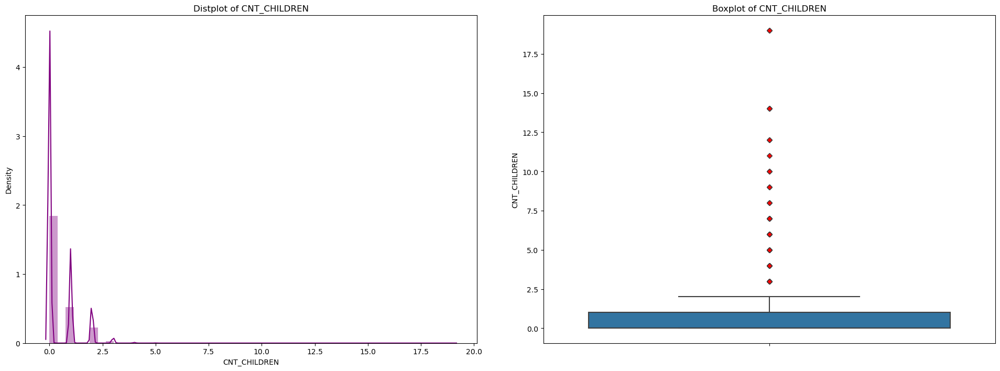

In [129]:
fn_dist_box(appl_data,'CNT_CHILDREN')

In [130]:
Q1 = appl_data['CNT_CHILDREN'].quantile(0.25)
Q3 = appl_data['CNT_CHILDREN'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

1.0


In [131]:
Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value))
print("Max value after which outlier exist: {}".format(Max_value))

Min value before which outlier exist: -1.5
Max value after which outlier exist: 2.5


In [132]:
appl_data['AMT_INCOME_TOTAL'].value_counts().sort_values(ascending = False).head()

135000.0    35750
112500.0    31019
157500.0    26556
180000.0    24719
90000.0     22483
Name: AMT_INCOME_TOTAL, dtype: int64

In [133]:
(appl_data['AMT_INCOME_TOTAL'].value_counts(normalize = True).sort_values(ascending = False) * 100).head()

135000.0    11.625600
112500.0    10.087119
157500.0     8.635789
180000.0     8.038412
90000.0      7.311283
Name: AMT_INCOME_TOTAL, dtype: float64

In [134]:
appl_data['AMT_INCOME_TOTAL'].describe(percentiles = [0.75,0.99,0.999])

count    3.075110e+05
mean     1.687979e+05
std      2.371231e+05
min      2.565000e+04
50%      1.471500e+05
75%      2.025000e+05
99%      4.725000e+05
99.9%    9.000000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64

C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\3719826990.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dataset[column], color = 'purple')


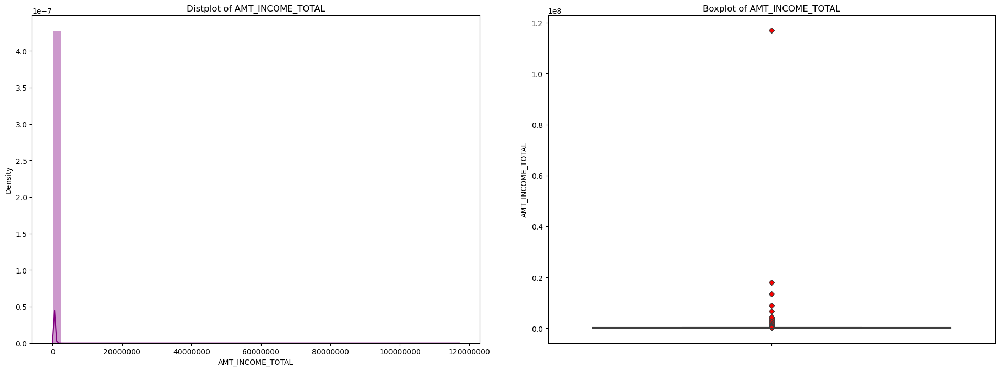

In [135]:
fn_dist_box(appl_data,'AMT_INCOME_TOTAL')

C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\3262802930.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(appl_data[appl_data['AMT_INCOME_TOTAL'] < 900000].AMT_INCOME_TOTAL)


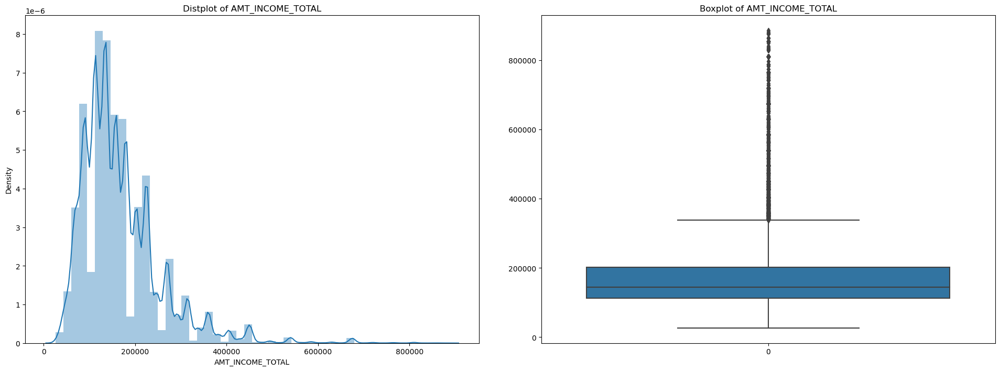

In [136]:
plt.subplots(1,2 ,figsize = (20,8))

plt.subplot(121)
sns.distplot(appl_data[appl_data['AMT_INCOME_TOTAL'] < 900000].AMT_INCOME_TOTAL)
pltname = 'Distplot of ' + 'AMT_INCOME_TOTAL'
plt.title(pltname)

plt.subplot(122)
sns.boxplot(appl_data[appl_data['AMT_INCOME_TOTAL'] < 900000].AMT_INCOME_TOTAL)
pltname = 'Boxplot of ' + 'AMT_INCOME_TOTAL'
plt.title(pltname)

plt.tight_layout(pad = 4)
plt.show()

In [137]:
appl_data[appl_data['AMT_INCOME_TOTAL'] > 900000].head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,YEARS_LAST_PHONE_CHANGE
1504,101769,0,Revolving loans,M,Y,Y,0,1080000.0,180000.0,9000.0,...,0.0,0.0,0.0,0.0,0.0,37,15,0,14,1.0
1723,102015,0,Cash loans,F,N,Y,0,1935000.0,269550.0,10534.5,...,0.0,0.0,0.0,0.0,0.0,51,1001,9,6,1.0
3371,103938,0,Cash loans,F,N,N,1,1350000.0,2410380.0,109053.0,...,0.0,0.0,3.0,0.0,0.0,33,2,2,11,0.0
4603,105384,0,Revolving loans,F,Y,Y,0,1350000.0,405000.0,20250.0,...,0.0,0.0,0.0,0.0,0.0,40,13,10,11,0.0
5673,106637,0,Cash loans,M,Y,Y,3,967500.0,450000.0,30073.5,...,0.0,0.0,1.0,1.0,0.0,33,1,8,1,0.0


In [138]:
appl_data['CNT_FAM_MEMBERS'].value_counts().sort_values(ascending = False).head()

2.0    158357
1.0     67847
3.0     52601
4.0     24697
5.0      3478
Name: CNT_FAM_MEMBERS, dtype: int64

In [139]:
(appl_data['CNT_FAM_MEMBERS'].value_counts(normalize = True).sort_values(ascending = False) * 100).head()

2.0    51.496704
1.0    22.063419
3.0    17.105516
4.0     8.031310
5.0     1.131024
Name: CNT_FAM_MEMBERS, dtype: float64

In [140]:
appl_data['CNT_FAM_MEMBERS'].describe(percentiles = [0.75,0.99,0.9999])

count     307509.000000
mean           2.152665
std            0.910682
min            1.000000
50%            2.000000
75%            3.000000
99%            5.000000
99.99%         8.000000
max           20.000000
Name: CNT_FAM_MEMBERS, dtype: float64

C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\3719826990.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dataset[column], color = 'purple')


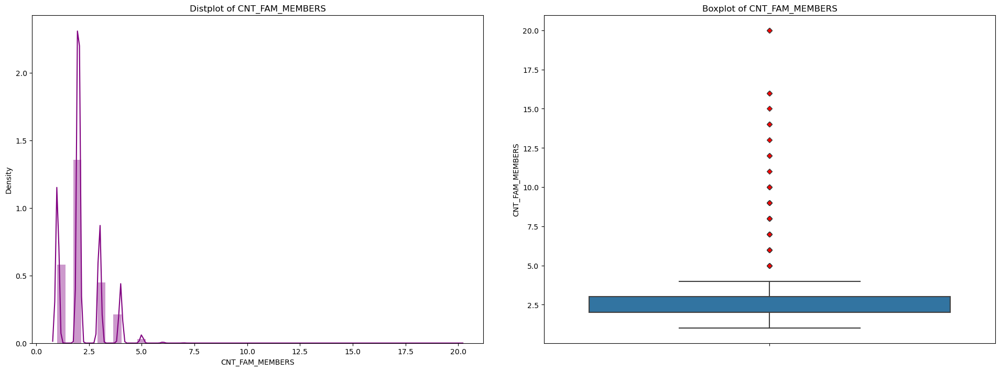

In [141]:
fn_dist_box(appl_data,'CNT_FAM_MEMBERS')

C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\2714785305.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(appl_data[appl_data['CNT_FAM_MEMBERS'] <= 8].CNT_FAM_MEMBERS)


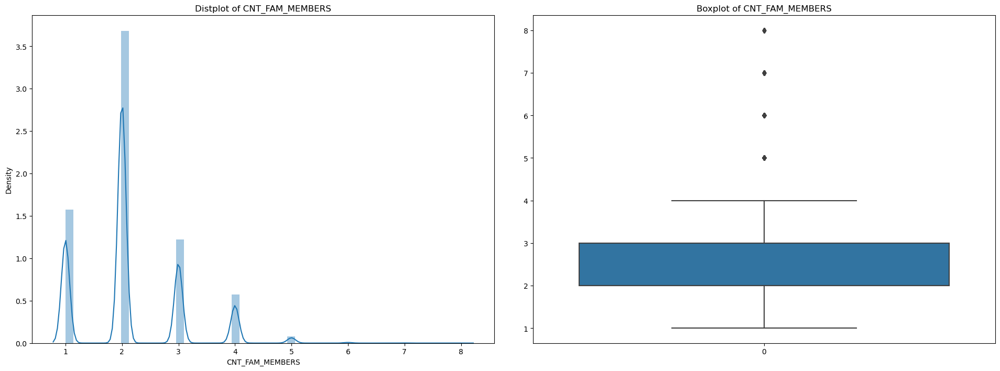

In [142]:
plt.subplots(1,2 ,figsize = (20,8))

plt.subplot(121)
sns.distplot(appl_data[appl_data['CNT_FAM_MEMBERS'] <= 8].CNT_FAM_MEMBERS)
pltname = 'Distplot of ' + 'CNT_FAM_MEMBERS'
plt.title(pltname)

plt.subplot(122)
sns.boxplot(appl_data[appl_data['CNT_FAM_MEMBERS'] <= 8].CNT_FAM_MEMBERS)
pltname = 'Boxplot of ' + 'CNT_FAM_MEMBERS'
plt.title(pltname)

plt.tight_layout(pad = 4)
plt.show()

In [143]:
appl_data['AMT_ANNUITY'].value_counts().sort_values(ascending = False).head()

9000.0     6385
13500.0    5514
6750.0     2279
10125.0    2035
37800.0    1602
Name: AMT_ANNUITY, dtype: int64

In [144]:
(appl_data['AMT_ANNUITY'].value_counts(normalize = True).sort_values(ascending = False) * 100).head()

9000.0     2.076430
13500.0    1.793177
6750.0     0.741141
10125.0    0.661791
37800.0    0.520977
Name: AMT_ANNUITY, dtype: float64

In [145]:
appl_data['AMT_ANNUITY'].describe(percentiles = [0.75,0.99,0.9999])

count     307499.000000
mean       27108.573909
std        14493.737315
min         1615.500000
50%        24903.000000
75%        34596.000000
99%        70006.500000
99.99%    213291.000000
max       258025.500000
Name: AMT_ANNUITY, dtype: float64

In [146]:
Q1 = appl_data['AMT_ANNUITY'].quantile(0.25)
Q3 = appl_data['AMT_ANNUITY'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

18072.0


In [147]:
Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value))
print("Max value after which outlier exist: {}".format(Max_value))

Min value before which outlier exist: -10584.0
Max value after which outlier exist: 61704.0


C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\3719826990.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dataset[column], color = 'purple')


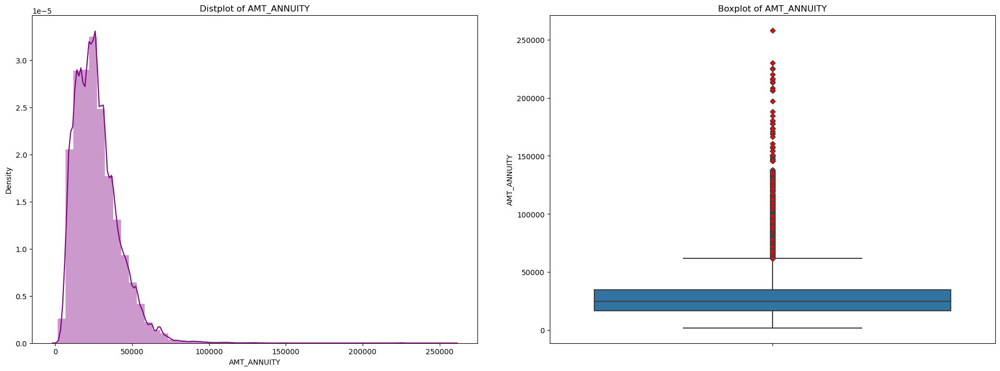

In [148]:
fn_dist_box(appl_data,'AMT_ANNUITY')

C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\1555320613.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(appl_data[appl_data['AMT_ANNUITY'] <= 61704.0].AMT_ANNUITY)


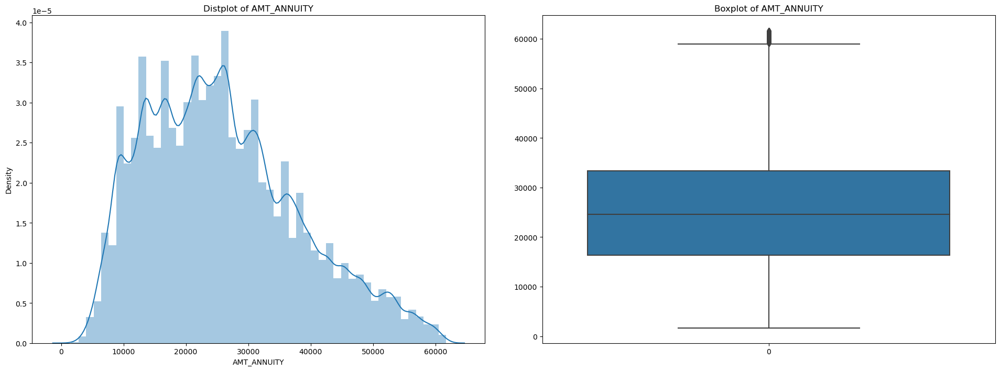

In [149]:
plt.subplots(1,2 ,figsize = (20,8))

plt.subplot(121)
sns.distplot(appl_data[appl_data['AMT_ANNUITY'] <= 61704.0].AMT_ANNUITY)
pltname = 'Distplot of ' + 'AMT_ANNUITY'
plt.title(pltname)

plt.subplot(122)
sns.boxplot(appl_data[appl_data['AMT_ANNUITY'] <= 61704.0].AMT_ANNUITY)
pltname = 'Boxplot of ' + 'AMT_ANNUITY'
plt.title(pltname)

plt.tight_layout(pad = 4)
plt.show()

In [150]:
appl_data['AMT_CREDIT'].value_counts().sort_values(ascending = False).head()

450000.0    9709
675000.0    8877
225000.0    8162
180000.0    7342
270000.0    7241
Name: AMT_CREDIT, dtype: int64

In [151]:
(appl_data['AMT_CREDIT'].value_counts(normalize = True).sort_values(ascending = False) * 100).head()

450000.0    3.157285
675000.0    2.886726
225000.0    2.654214
180000.0    2.387557
270000.0    2.354713
Name: AMT_CREDIT, dtype: float64

In [152]:
appl_data['AMT_CREDIT'].describe(percentiles = [0.75,0.99,0.9999])

count     3.075110e+05
mean      5.990260e+05
std       4.024908e+05
min       4.500000e+04
50%       5.135310e+05
75%       8.086500e+05
99%       1.854000e+06
99.99%    3.030531e+06
max       4.050000e+06
Name: AMT_CREDIT, dtype: float64

In [153]:
Q1 = appl_data['AMT_CREDIT'].quantile(0.25)
Q3 = appl_data['AMT_CREDIT'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

538650.0


In [154]:
Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value))
print("Max value after which outlier exist: {}".format(Max_value))

Min value before which outlier exist: -537975.0
Max value after which outlier exist: 1616625.0


C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\3719826990.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dataset[column], color = 'purple')


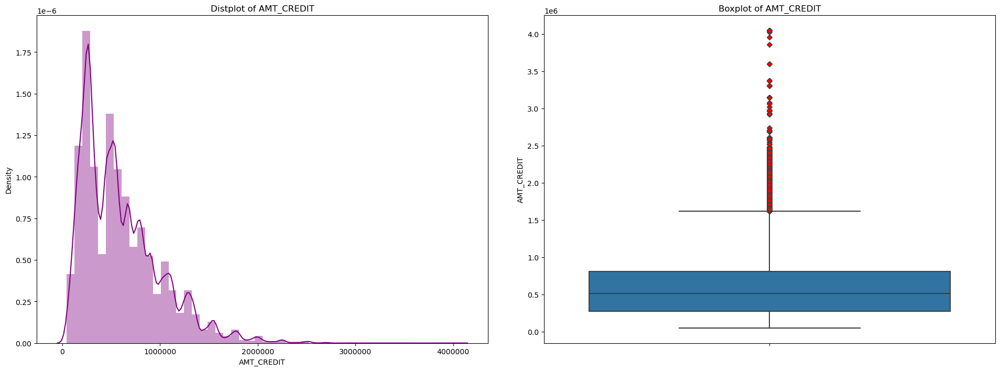

In [155]:
fn_dist_box(appl_data,'AMT_CREDIT')

C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\3364689788.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(appl_data[appl_data['AMT_CREDIT'] <= 1616625.0].AMT_CREDIT)


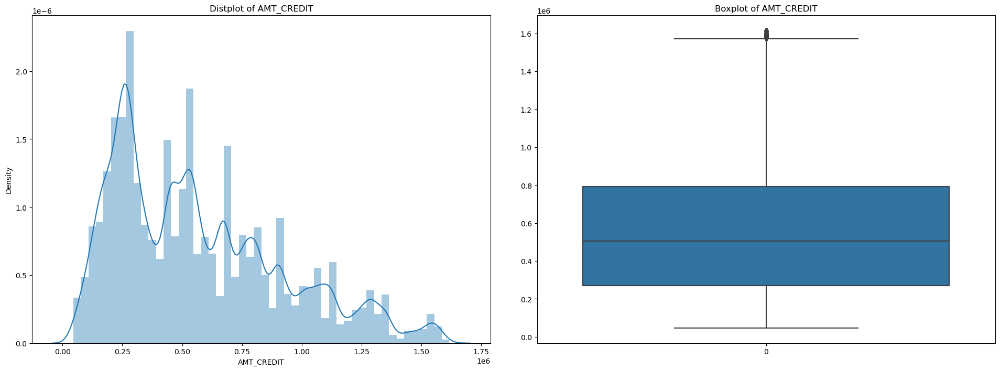

In [156]:
plt.subplots(1,2 ,figsize = (20,8))

plt.subplot(121)
sns.distplot(appl_data[appl_data['AMT_CREDIT'] <= 1616625.0].AMT_CREDIT)
pltname = 'Distplot of ' + 'AMT_CREDIT'
plt.title(pltname)

plt.subplot(122)
sns.boxplot(appl_data[appl_data['AMT_CREDIT'] <= 1616625.0].AMT_CREDIT)
pltname = 'Boxplot of ' + 'AMT_CREDIT'
plt.title(pltname)

plt.tight_layout(pad = 4)
plt.show()

In [157]:
appl_data['DAYS_LAST_PHONE_CHANGE'].value_counts().sort_values(ascending = False).head()

0.0    37672
1.0     2812
2.0     2318
3.0     1763
4.0     1285
Name: DAYS_LAST_PHONE_CHANGE, dtype: int64

In [158]:
(appl_data['DAYS_LAST_PHONE_CHANGE'].value_counts(normalize = True).sort_values(ascending = False) * 100).head()

0.0    12.250659
1.0     0.914442
2.0     0.753797
3.0     0.573315
4.0     0.417873
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [159]:
appl_data['DAYS_LAST_PHONE_CHANGE'].describe(percentiles = [0.75,0.99,0.9999])

count     307510.000000
mean         962.858788
std          826.808487
min            0.000000
50%          757.000000
75%         1570.000000
99%         3149.000000
99.99%      3999.747300
max         4292.000000
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [160]:
Q1 = appl_data['DAYS_LAST_PHONE_CHANGE'].quantile(0.25)
Q3 = appl_data['DAYS_LAST_PHONE_CHANGE'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

1296.0


In [161]:
Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value))
print("Max value after which outlier exist: {}".format(Max_value))

Min value before which outlier exist: -1670.0
Max value after which outlier exist: 3514.0


C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\3719826990.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dataset[column], color = 'purple')


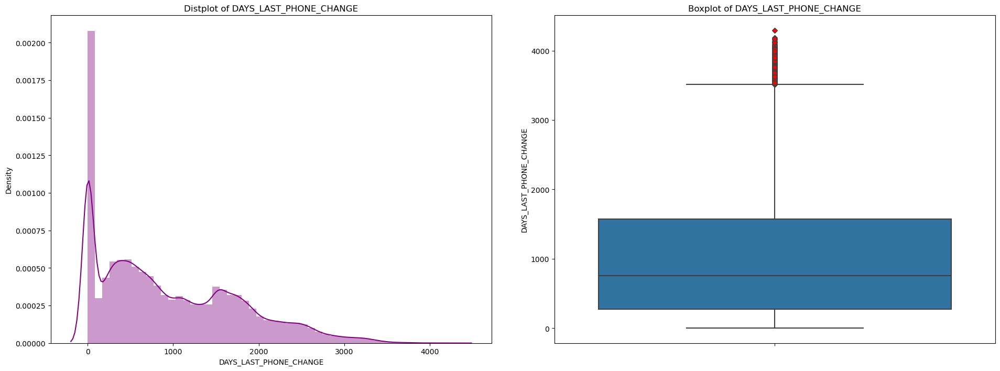

In [162]:
fn_dist_box(appl_data,'DAYS_LAST_PHONE_CHANGE')

C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\1785004707.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(appl_data[appl_data['DAYS_LAST_PHONE_CHANGE'] <= 3514.0].DAYS_LAST_PHONE_CHANGE)


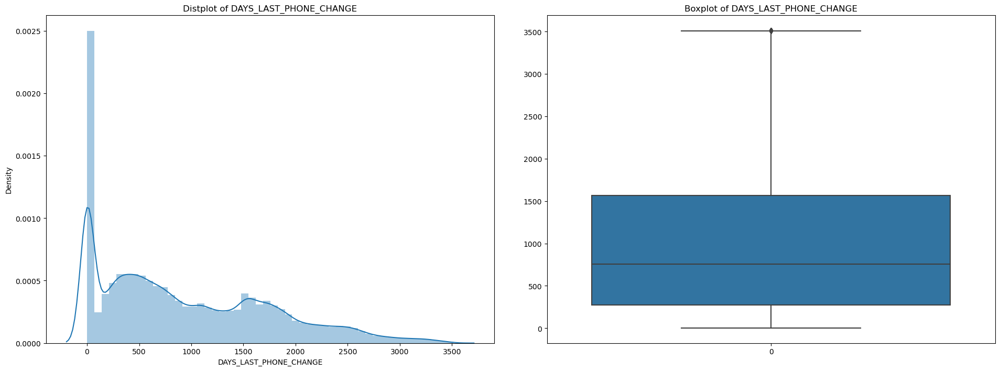

In [163]:
plt.subplots(1,2 ,figsize = (20,8))

plt.subplot(121)
sns.distplot(appl_data[appl_data['DAYS_LAST_PHONE_CHANGE'] <= 3514.0].DAYS_LAST_PHONE_CHANGE)
pltname = 'Distplot of ' + 'DAYS_LAST_PHONE_CHANGE'
plt.title(pltname)

plt.subplot(122)
sns.boxplot(appl_data[appl_data['DAYS_LAST_PHONE_CHANGE'] <= 3514.0].DAYS_LAST_PHONE_CHANGE)
pltname = 'Boxplot of ' + 'DAYS_LAST_PHONE_CHANGE'
plt.title(pltname)

plt.tight_layout(pad = 4)
plt.show()

In [164]:
appl_data['AMT_GOODS_PRICE'].value_counts().sort_values(ascending = False).head()

450000.0    26022
225000.0    25282
675000.0    24962
900000.0    15416
270000.0    11428
Name: AMT_GOODS_PRICE, dtype: int64

In [165]:
(appl_data['AMT_GOODS_PRICE'].value_counts(normalize = True).sort_values(ascending = False) * 100).head()

450000.0    8.469793
225000.0    8.228934
675000.0    8.124778
900000.0    5.017690
270000.0    3.719653
Name: AMT_GOODS_PRICE, dtype: float64

In [166]:
appl_data['AMT_GOODS_PRICE'].describe(percentiles = [0.25,0.75,0.99,0.9999])

count     3.072330e+05
mean      5.383962e+05
std       3.694465e+05
min       4.050000e+04
25%       2.385000e+05
50%       4.500000e+05
75%       6.795000e+05
99%       1.800000e+06
99.99%    2.934965e+06
max       4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64

In [167]:
appl_data['AMT_GOODS_PRICE_CATEGORY'] = pd.cut(appl_data['AMT_GOODS_PRICE'], bins = 5, labels = ['very low','low','medium','high','very high'])

In [168]:
appl_data['AMT_GOODS_PRICE_CATEGORY'].value_counts()

very low     246973
low           56087
medium         4108
high             47
very high        18
Name: AMT_GOODS_PRICE_CATEGORY, dtype: int64

In [169]:
appl_data['YEARS_BIRTH'].value_counts().sort_values(ascending = False).head()

39    9023
38    8793
37    8727
40    8602
41    8495
Name: YEARS_BIRTH, dtype: int64

In [170]:
(appl_data['YEARS_BIRTH'].value_counts(normalize = True).sort_values(ascending = False) * 100).head()

39    2.934204
38    2.859410
37    2.837947
40    2.797298
41    2.762503
Name: YEARS_BIRTH, dtype: float64

In [171]:
appl_data['YEARS_BIRTH'].describe(percentiles = [0.25,0.75,0.99,0.9999])

count     307511.000000
mean          43.938646
std           11.964047
min           21.000000
25%           34.000000
50%           43.000000
75%           54.000000
99%           67.000000
99.99%        69.000000
max           69.000000
Name: YEARS_BIRTH, dtype: float64

In [172]:
appl_data['YEARS_BIRTH_CATEGORY'] = appl_data['YEARS_BIRTH'].apply(age_cat)

In [173]:
appl_data['YEARS_BIRTH_CATEGORY'].value_counts().sort_values(ascending = False)

30-40    82770
40-50    75509
50-60    67955
20-30    48869
60-70    32408
Name: YEARS_BIRTH_CATEGORY, dtype: int64

In [174]:
appl_data['YEARS_REGISTRATION'].value_counts().sort_values(ascending = False).head()

1     15661
2     15564
3     13894
13    12866
12    12697
Name: YEARS_REGISTRATION, dtype: int64

In [175]:
(appl_data['YEARS_REGISTRATION'].value_counts(normalize = True).sort_values(ascending = False) * 100).head()

1     5.092826
2     5.061282
3     4.518212
13    4.183915
12    4.128958
Name: YEARS_REGISTRATION, dtype: float64

In [176]:
appl_data['YEARS_REGISTRATION'].describe(percentiles = [0.25,0.75,0.99,0.9999])

count     307511.000000
mean          13.659440
std            9.659369
min            0.000000
25%            6.000000
50%           12.000000
75%           20.000000
99%           38.000000
99.99%        54.249000
max           68.000000
Name: YEARS_REGISTRATION, dtype: float64

In [177]:
appl_data['YEARS_REGISTRATION_CATEGORY'] = appl_data['YEARS_REGISTRATION'].apply(age_cat)

In [178]:
appl_data['YEARS_REGISTRATION_CATEGORY'].value_counts().sort_values(ascending = False)

0-20     230697
20-30     59288
30-40     16051
40-50      1406
50-60        60
60-70         9
Name: YEARS_REGISTRATION_CATEGORY, dtype: int64

In [179]:
appl_data['TARGET'].value_counts().sort_values(ascending = False)

0    282686
1     24825
Name: TARGET, dtype: int64

In [180]:
appl_data['TARGET'].value_counts(normalize = True).sort_values(ascending = False) * 100

0    91.927118
1     8.072882
Name: TARGET, dtype: float64

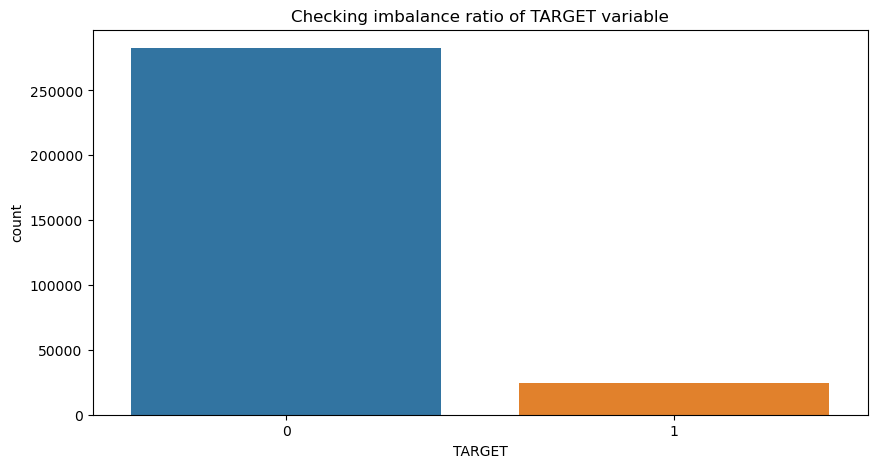

In [181]:
plt.figure(figsize = (10,5))
sns.countplot(x = appl_data['TARGET'], data = appl_data)
plt.title('Checking imbalance ratio of TARGET variable')
plt.show()

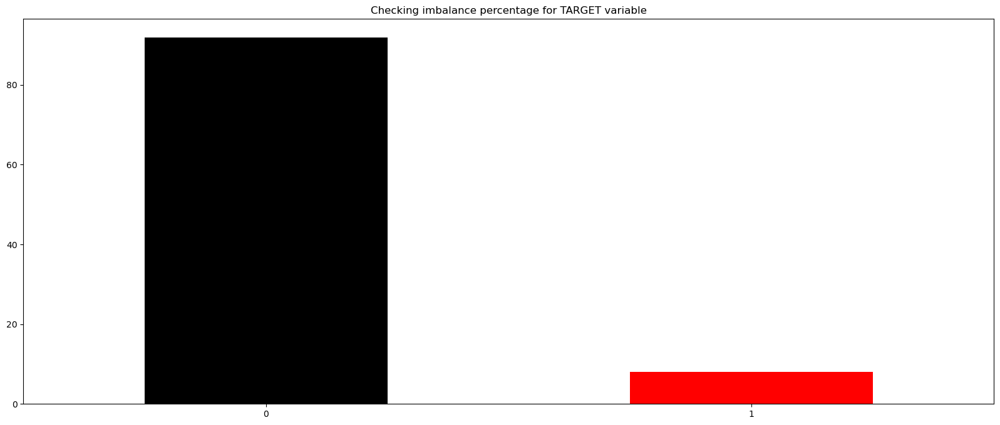

In [182]:
plt.figure(figsize = [20,8])
(appl_data['TARGET'].value_counts(normalize=True)*100).plot.bar(title = "Checking imbalance percentage for TARGET variable", color=['black', 'red', 'green', 'blue', 'cyan'])
plt.xticks(rotation=0)
plt.show()

In [183]:
appl_data1 = appl_data[appl_data['TARGET'] == 1]

In [184]:
appl_data1.TARGET.value_counts()

1    24825
Name: TARGET, dtype: int64

In [185]:
appl_data0 = appl_data[appl_data['TARGET'] == 0]

In [186]:
appl_data0.TARGET.value_counts()

0    282686
Name: TARGET, dtype: int64

In [187]:
appl_data1['NAME_CONTRACT_TYPE'].value_counts().sort_values(ascending = False)

Cash loans         23221
Revolving loans     1604
Name: NAME_CONTRACT_TYPE, dtype: int64

In [188]:
appl_data0['NAME_CONTRACT_TYPE'].value_counts().sort_values(ascending = False)

Cash loans         255011
Revolving loans     27675
Name: NAME_CONTRACT_TYPE, dtype: int64

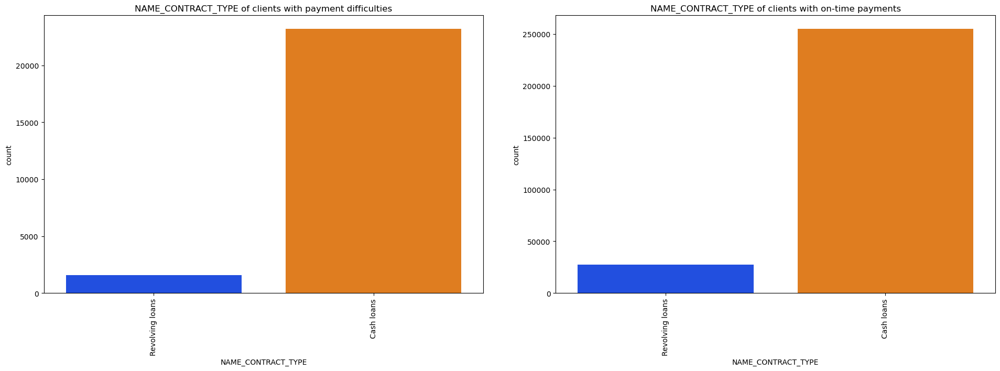

In [189]:
fn_uni_countplot('NAME_CONTRACT_TYPE')

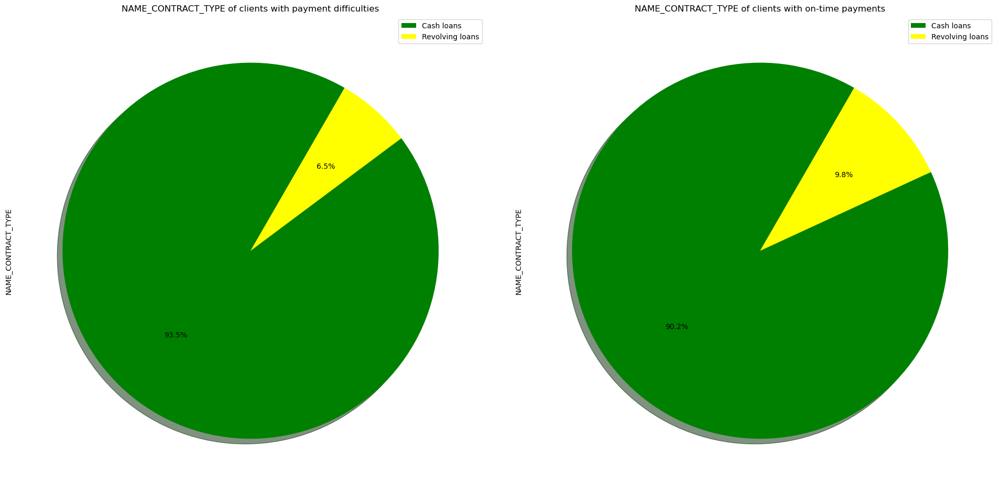

In [190]:
fn_uni_piechart('NAME_CONTRACT_TYPE')

In [191]:
appl_data1['CODE_GENDER'].value_counts().sort_values(ascending = False)

F    14170
M    10655
Name: CODE_GENDER, dtype: int64

In [192]:
appl_data0['CODE_GENDER'].value_counts().sort_values(ascending = False)

F    188282
M     94404
Name: CODE_GENDER, dtype: int64

In [193]:
sorted(appl_data['CODE_GENDER'].unique(), reverse = True)

['M', 'F']

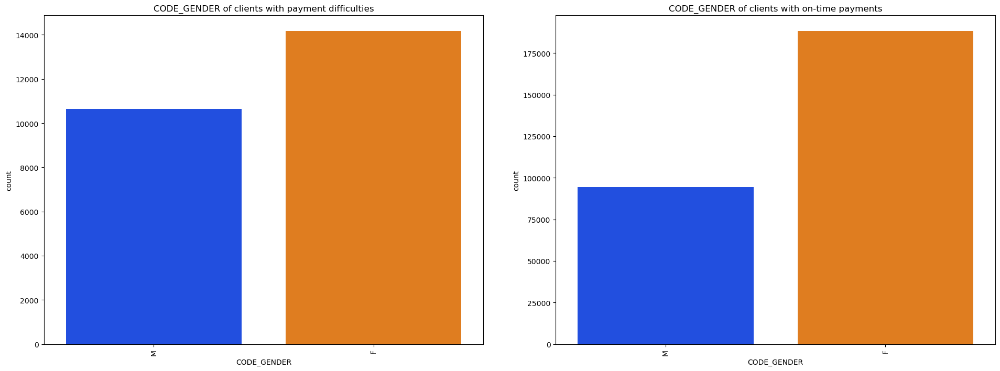

In [194]:
fn_uni_countplot('CODE_GENDER')

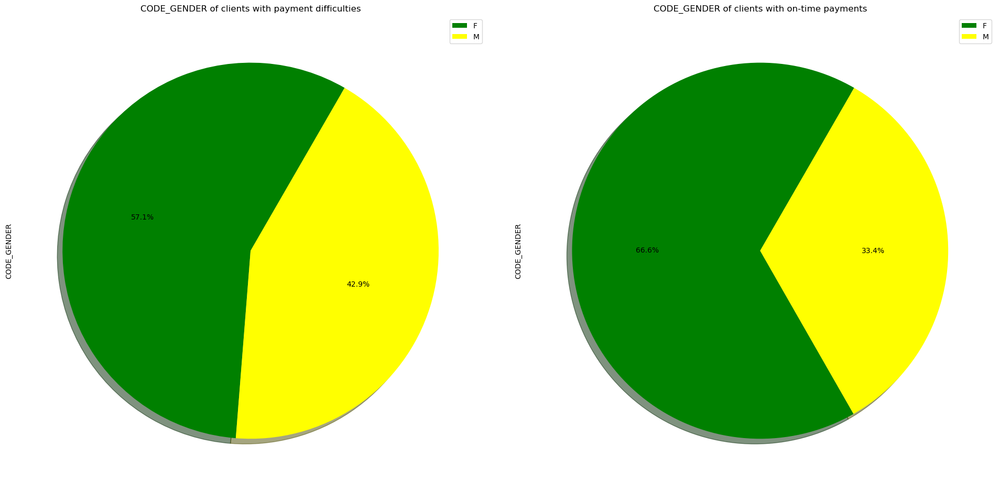

In [195]:
fn_uni_piechart('CODE_GENDER')

In [196]:
appl_data1['FLAG_OWN_CAR'].value_counts().sort_values(ascending = False)

N    17249
Y     7576
Name: FLAG_OWN_CAR, dtype: int64

In [197]:
appl_data0['FLAG_OWN_CAR'].value_counts().sort_values(ascending = False)

N    185675
Y     97011
Name: FLAG_OWN_CAR, dtype: int64

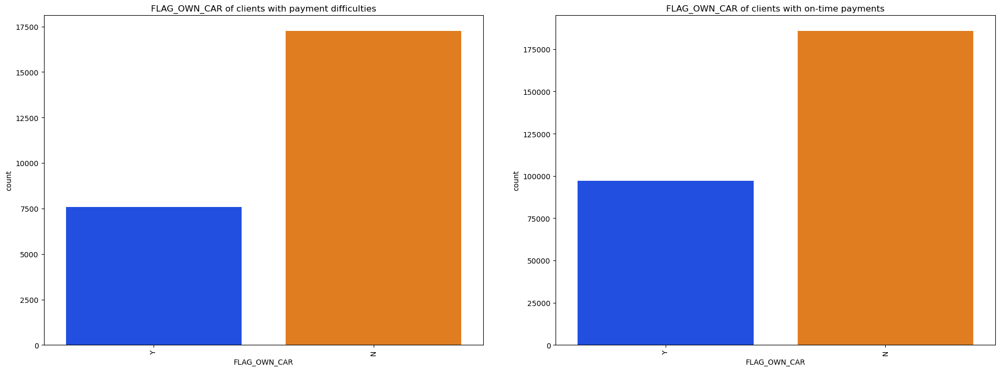

In [198]:
fn_uni_countplot('FLAG_OWN_CAR')

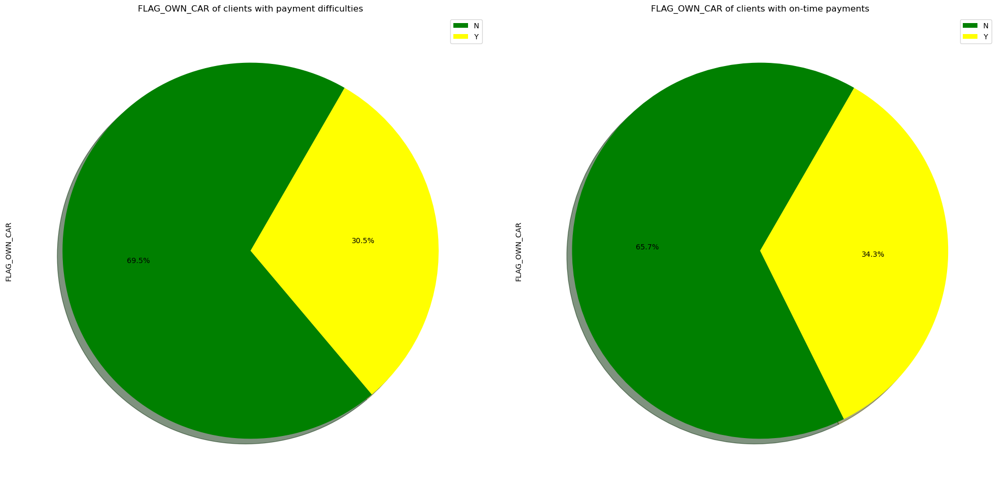

In [199]:
fn_uni_piechart('FLAG_OWN_CAR')

In [200]:
appl_data1['NAME_INCOME_TYPE'].value_counts().sort_values(ascending = False)

Working                 15224
Commercial associate     5360
Pensioner                2982
State servant            1249
Unemployed                  8
Maternity leave             2
Name: NAME_INCOME_TYPE, dtype: int64

In [201]:
appl_data0['NAME_INCOME_TYPE'].value_counts().sort_values(ascending = False)

Working                 143550
Commercial associate     66257
Pensioner                52380
State servant            20454
Student                     18
Unemployed                  14
Businessman                 10
Maternity leave              3
Name: NAME_INCOME_TYPE, dtype: int64

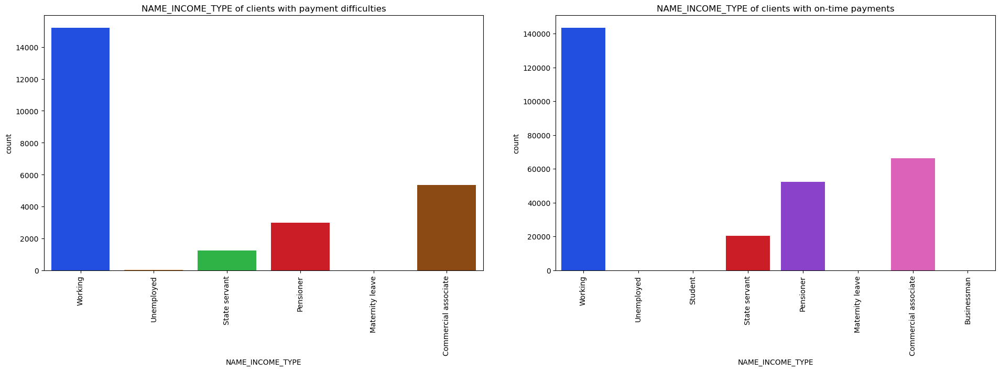

In [202]:
fn_uni_countplot('NAME_INCOME_TYPE')

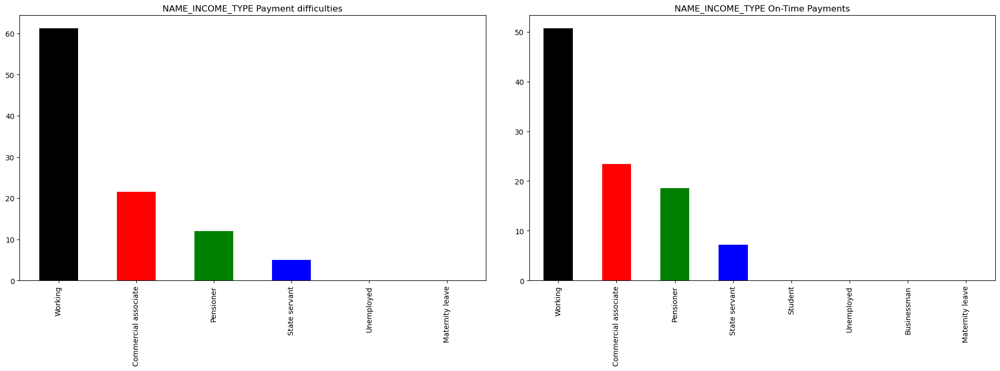

In [203]:
fn_uni_barplot('NAME_INCOME_TYPE')

In [204]:
appl_data1['NAME_EDUCATION_TYPE'].value_counts().sort_values(ascending = False)

Secondary / secondary special    19524
Higher education                  4009
Incomplete higher                  872
Lower secondary                    417
Academic degree                      3
Name: NAME_EDUCATION_TYPE, dtype: int64

In [205]:
appl_data0['NAME_EDUCATION_TYPE'].value_counts().sort_values(ascending = False)

Secondary / secondary special    198867
Higher education                  70854
Incomplete higher                  9405
Lower secondary                    3399
Academic degree                     161
Name: NAME_EDUCATION_TYPE, dtype: int64

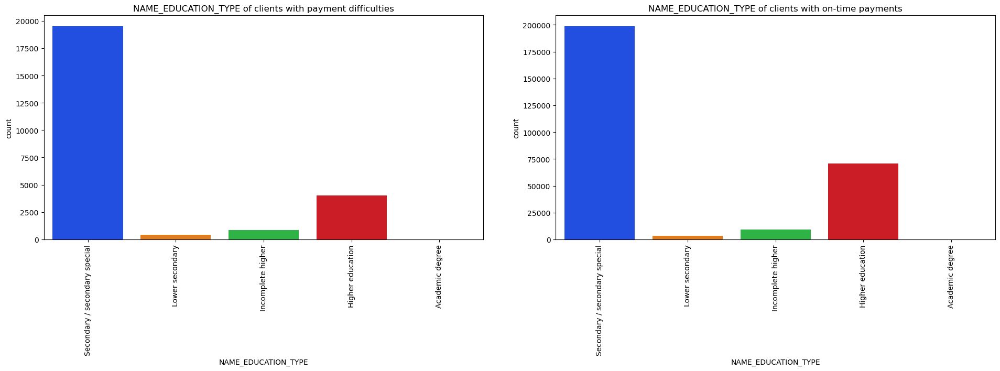

In [206]:
fn_uni_countplot('NAME_EDUCATION_TYPE')

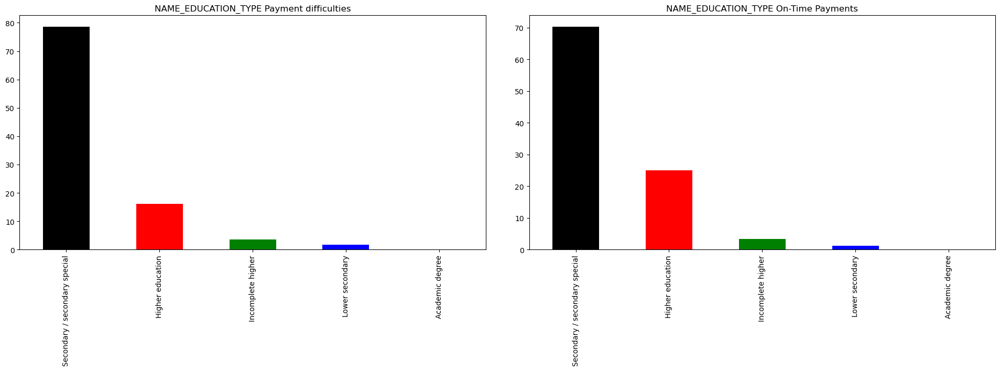

In [207]:
fn_uni_barplot('NAME_EDUCATION_TYPE')

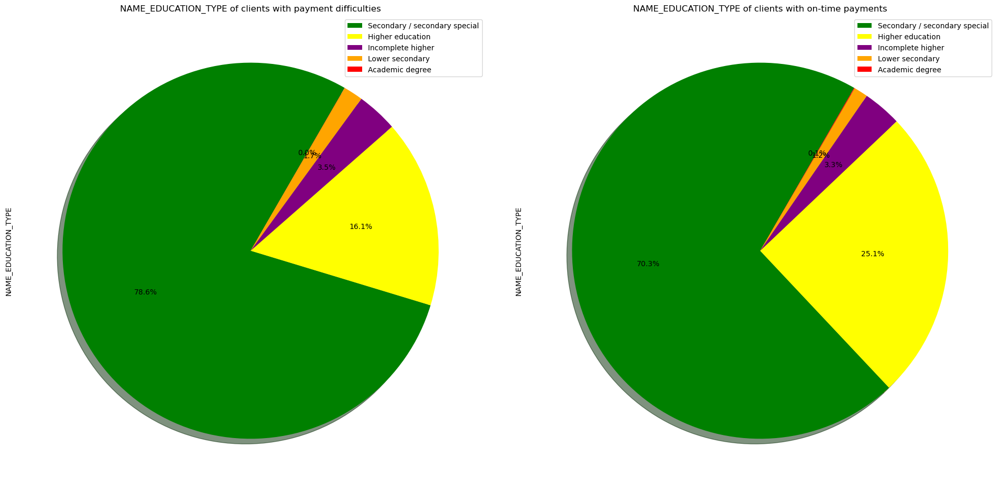

In [208]:
fn_uni_piechart('NAME_EDUCATION_TYPE')

In [209]:
appl_data1['NAME_FAMILY_STATUS'].value_counts().sort_values(ascending = False)

Married                 14850
Single / not married     4457
Civil marriage           2961
Separated                1620
Widow                     937
Name: NAME_FAMILY_STATUS, dtype: int64

In [210]:
appl_data0['NAME_FAMILY_STATUS'].value_counts().sort_values(ascending = False)

Married                 181584
Single / not married     40987
Civil marriage           26814
Separated                18150
Widow                    15151
Name: NAME_FAMILY_STATUS, dtype: int64

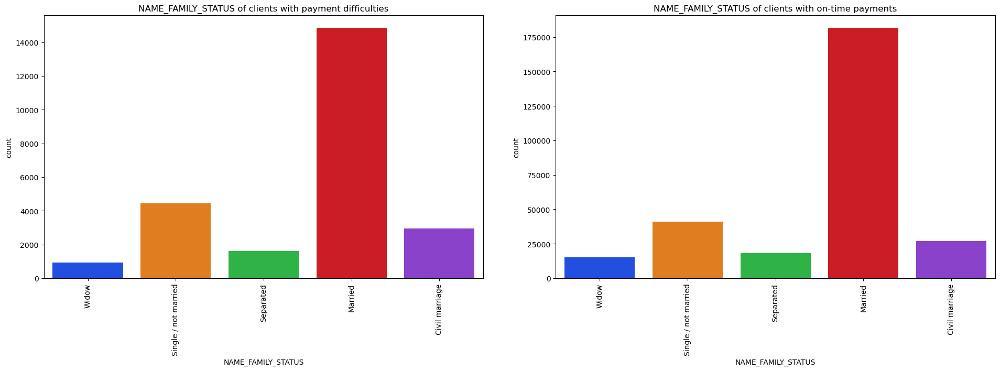

In [211]:
fn_uni_countplot('NAME_FAMILY_STATUS')

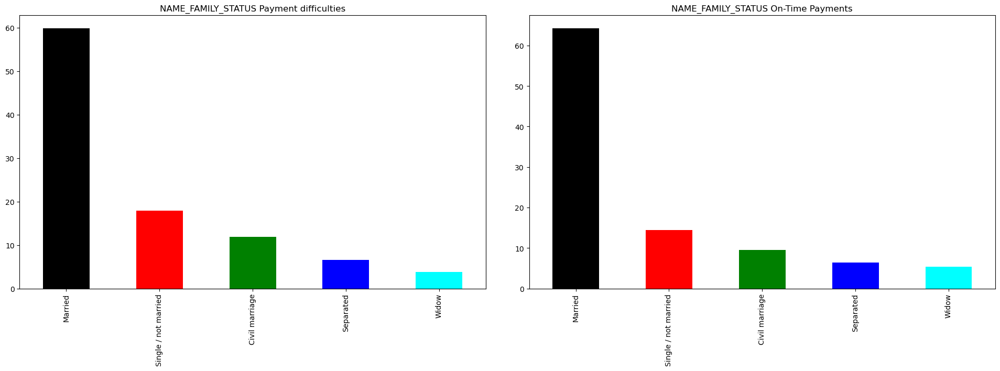

In [212]:
fn_uni_barplot('NAME_FAMILY_STATUS')

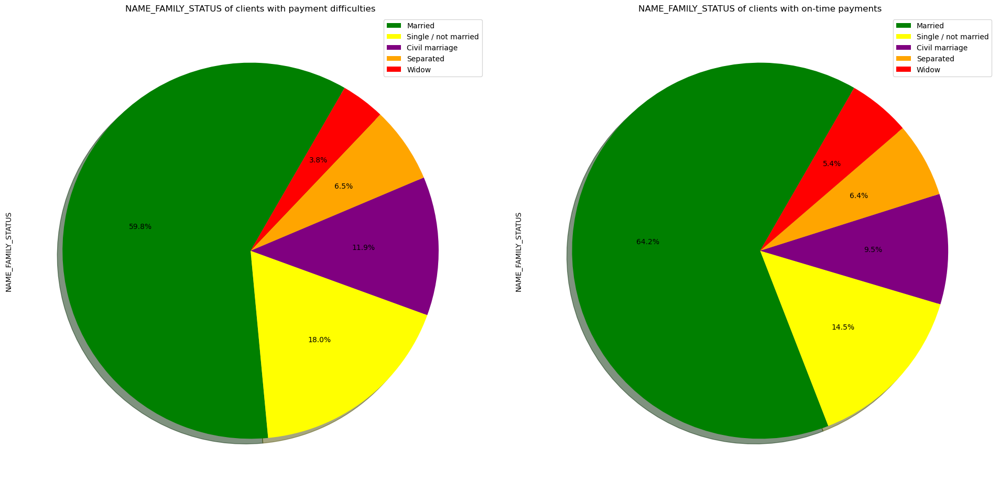

In [213]:
fn_uni_piechart('NAME_FAMILY_STATUS')

In [214]:
appl_data1.select_dtypes(include=["int64","float64"]).shape

(24825, 66)

In [215]:
corr_appl_data1 = appl_data1.select_dtypes(include=["int64","float64"]).corr()

In [216]:
corr_appl_data1.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,YEARS_LAST_PHONE_CHANGE
SK_ID_CURR,1.000000,NaN,-0.005144,-0.010165,-0.001290,-0.007578,-0.001816,0.006301,0.001254,-0.005161,...,-0.007954,-0.002999,0.006436,-0.000880,0.008916,0.001299,-0.005166,-0.006408,0.002450,-0.002190
TARGET,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CNT_CHILDREN,-0.005144,NaN,1.000000,0.004796,-0.001675,0.031257,-0.008112,-0.031975,-0.259109,-0.192864,...,-0.013004,-0.011792,-0.012583,-0.018174,-0.035427,-0.258910,-0.192862,-0.149369,0.032679,-0.012285
AMT_INCOME_TOTAL,-0.010165,NaN,0.004796,1.000000,0.038131,0.046421,0.037583,0.009135,-0.003096,-0.014977,...,-0.000272,0.000018,0.004114,-0.001133,0.001752,-0.002872,-0.014967,0.000144,0.004242,0.002357
AMT_CREDIT,-0.001290,NaN,-0.001675,0.038131,1.000000,0.752195,0.983103,0.069161,0.135316,0.001930,...,0.003008,0.007650,0.055038,-0.017467,-0.035719,0.135318,0.001933,0.025925,0.052461,0.108885


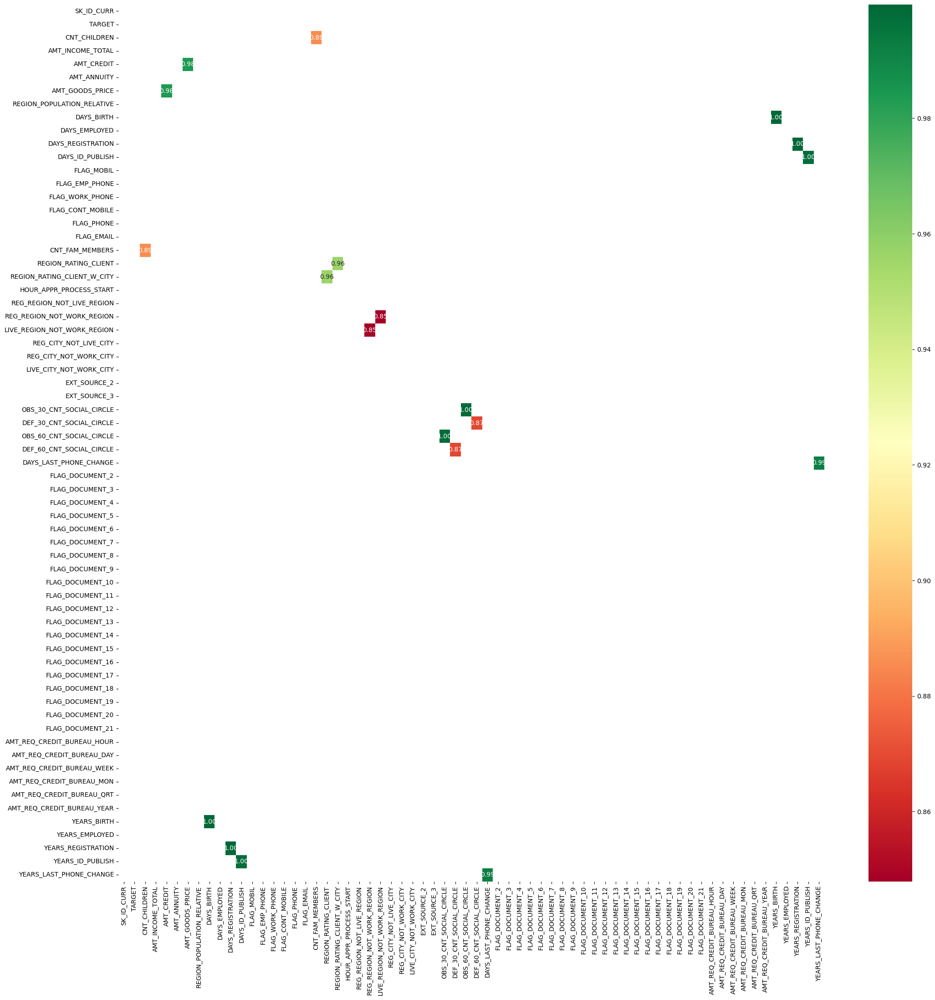

In [217]:
plt.figure(figsize = (25,25))
sns.heatmap(data = corr_appl_data1[(corr_appl_data1 >= 0.8) & (corr_appl_data1 < 0.9999)], annot = True, cmap = "RdYlGn", cbar = True, fmt='.2f')
plt.show()

In [218]:
corr_appl_data1[corr_appl_data1 <= 0.99].unstack().sort_values(ascending = False).head(22)

AMT_GOODS_PRICE              AMT_CREDIT                     0.983103
AMT_CREDIT                   AMT_GOODS_PRICE                0.983103
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.956637
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY    0.956637
CNT_FAM_MEMBERS              CNT_CHILDREN                   0.885484
CNT_CHILDREN                 CNT_FAM_MEMBERS                0.885484
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE       0.868994
DEF_30_CNT_SOCIAL_CIRCLE     DEF_60_CNT_SOCIAL_CIRCLE       0.868994
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION     0.847885
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION    0.847885
LIVE_CITY_NOT_WORK_CITY      REG_CITY_NOT_WORK_CITY         0.778540
REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY        0.778540
AMT_ANNUITY                  AMT_GOODS_PRICE                0.752699
AMT_GOODS_PRICE              AMT_ANNUITY                    0.752699
AMT_ANNUITY                  AMT_C

In [219]:
appl_data.select_dtypes(include=["int64","float64"]).shape

(307511, 66)

In [220]:
corr_appl_data0 = appl_data0.select_dtypes(include=["int64","float64"]).corr()

In [221]:
corr_appl_data0.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,YEARS_LAST_PHONE_CHANGE
SK_ID_CURR,1.000000,NaN,-0.000716,0.001739,-0.000342,0.000068,-0.000205,0.000360,0.001346,0.001744,...,-0.001725,0.002524,0.000054,0.001148,0.004349,0.001324,0.001744,0.001535,0.000123,0.001052
TARGET,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CNT_CHILDREN,-0.000716,NaN,1.000000,0.027397,0.003081,0.020905,-0.000525,-0.024363,-0.336966,-0.245174,...,0.000648,-0.001632,-0.010455,-0.007087,-0.042547,-0.336847,-0.245174,-0.185586,0.028569,0.008606
AMT_INCOME_TOTAL,0.001739,NaN,0.027397,1.000000,0.342799,0.418953,0.349462,0.167851,-0.062609,-0.140392,...,0.007862,0.006234,0.061470,0.013128,0.029536,-0.062597,-0.140389,-0.064963,-0.022840,0.041174
AMT_CREDIT,-0.000342,NaN,0.003081,0.342799,1.000000,0.771309,0.987250,0.100604,0.047378,-0.070104,...,0.004409,-0.001883,0.054071,0.017767,-0.048866,0.047426,-0.070102,-0.013409,0.001405,0.068155


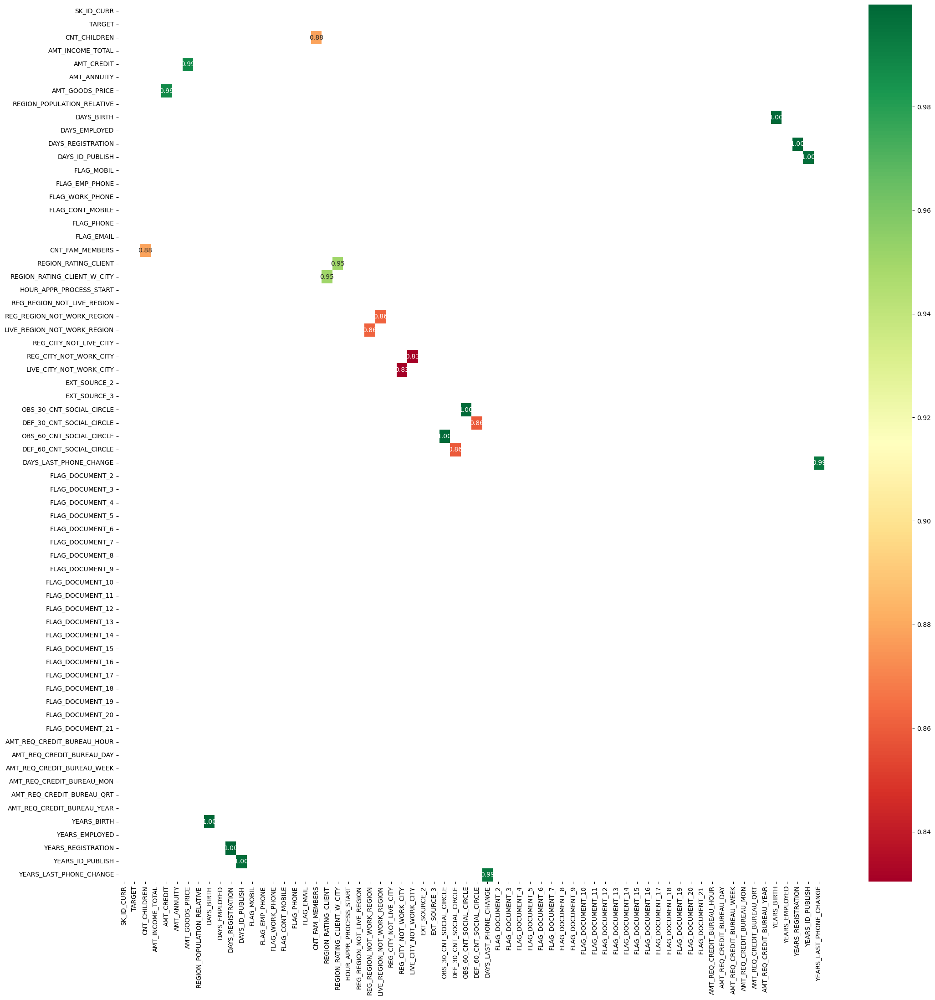

In [222]:
plt.figure(figsize = (25,25))
sns.heatmap(data = corr_appl_data0[(corr_appl_data0 >= 0.8) & (corr_appl_data0 < 0.9999)], annot = True, cmap = "RdYlGn", cbar = True, fmt='.2f')
plt.show()

In [223]:
corr_appl_data0[corr_appl_data0 <= 0.99].unstack().sort_values(ascending = False).head(28)

AMT_CREDIT                   AMT_GOODS_PRICE                0.987250
AMT_GOODS_PRICE              AMT_CREDIT                     0.987250
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.950149
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY    0.950149
CNT_CHILDREN                 CNT_FAM_MEMBERS                0.878571
CNT_FAM_MEMBERS              CNT_CHILDREN                   0.878571
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION    0.861861
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION     0.861861
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE       0.859332
DEF_30_CNT_SOCIAL_CIRCLE     DEF_60_CNT_SOCIAL_CIRCLE       0.859332
REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY        0.830381
LIVE_CITY_NOT_WORK_CITY      REG_CITY_NOT_WORK_CITY         0.830381
AMT_ANNUITY                  AMT_GOODS_PRICE                0.776686
AMT_GOODS_PRICE              AMT_ANNUITY                    0.776686
AMT_CREDIT                   AMT_A

In [224]:
Q1 = appl_data1['AMT_CREDIT'].quantile(0.25)
Q3 = appl_data1['AMT_CREDIT'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

448915.5


In [225]:
Min_value1 = (Q1 - 1.5 * IQR)
Max_value1 = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value1))
print("Max value after which outlier exist: {}".format(Max_value1))

Min value before which outlier exist: -388973.25
Max value after which outlier exist: 1406688.75


In [226]:
Q1 = appl_data0['AMT_CREDIT'].quantile(0.25)
Q3 = appl_data0['AMT_CREDIT'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

540000.0


In [227]:
Min_value0 = (Q1 - 1.5 * IQR)
Max_value0 = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value0))
print("Max value after which outlier exist: {}".format(Max_value0))

Min value before which outlier exist: -540000.0
Max value after which outlier exist: 1620000.0


C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\4234249963.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(appl_data1[appl_data1['AMT_CREDIT'] <= Max_value1].AMT_CREDIT,label = 'Payment difficulties', hist=False)
C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\4234249963.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwa

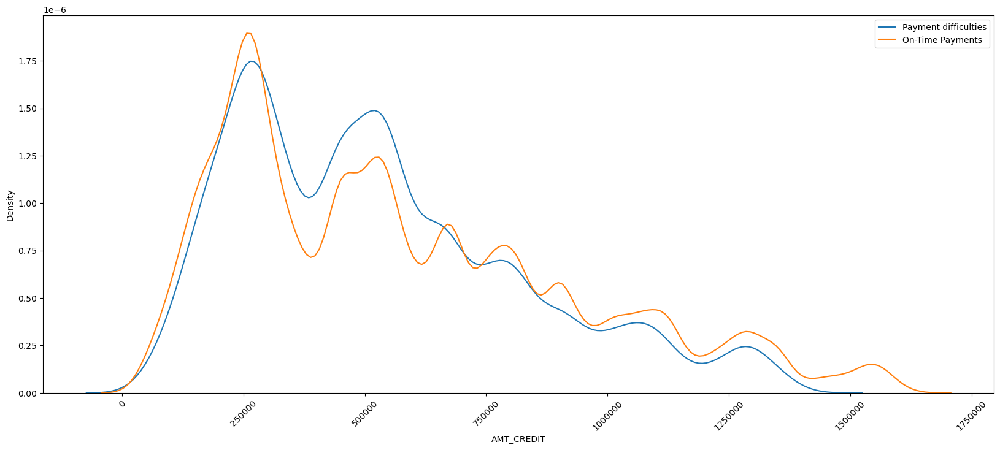

In [228]:
plt.figure(figsize = [20,8])
sns.distplot(appl_data1[appl_data1['AMT_CREDIT'] <= Max_value1].AMT_CREDIT,label = 'Payment difficulties', hist=False)
sns.distplot(appl_data0[appl_data0['AMT_CREDIT'] <= Max_value0].AMT_CREDIT,label = 'On-Time Payments', hist=False)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

In [229]:
Q1 = appl_data1['YEARS_BIRTH'].quantile(0.25)
Q3 = appl_data1['YEARS_BIRTH'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

18.0


In [230]:
Min_value1 = (Q1 - 1.5 * IQR)
Max_value1 = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value1))
print("Max value after which outlier exist: {}".format(Max_value1))

Min value before which outlier exist: 4.0
Max value after which outlier exist: 76.0


In [231]:
Q1 = appl_data0['YEARS_BIRTH'].quantile(0.25)
Q3 = appl_data0['YEARS_BIRTH'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

20.0


In [232]:
Min_value0 = (Q1 - 1.5 * IQR)
Max_value0 = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value0))
print("Max value after which outlier exist: {}".format(Max_value0))

Min value before which outlier exist: 4.0
Max value after which outlier exist: 84.0


C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\3166164785.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(appl_data1[appl_data1['YEARS_BIRTH'] <= Max_value1].YEARS_BIRTH,label = 'Payment difficulties', hist=False)
C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\3166164785.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/m

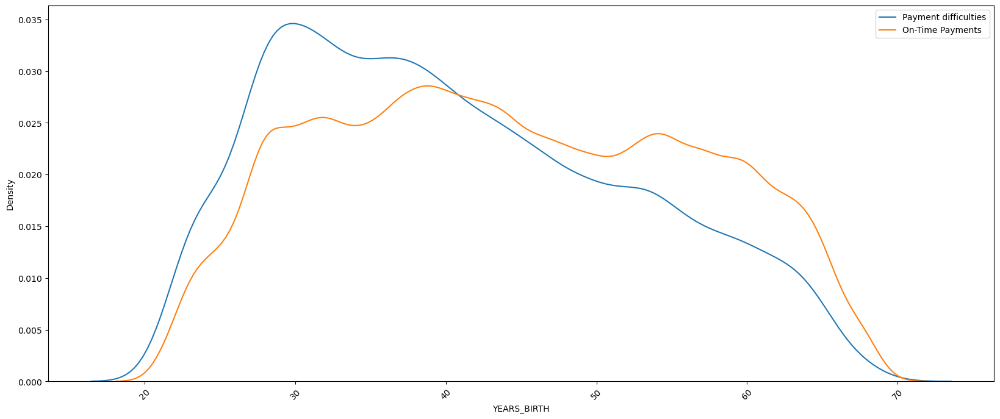

In [233]:
plt.figure(figsize = [20,8])
sns.distplot(appl_data1[appl_data1['YEARS_BIRTH'] <= Max_value1].YEARS_BIRTH,label = 'Payment difficulties', hist=False)
sns.distplot(appl_data0[appl_data0['YEARS_BIRTH'] <= Max_value0].YEARS_BIRTH,label = 'On-Time Payments', hist=False)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

In [234]:
Q1 = appl_data1['AMT_GOODS_PRICE'].quantile(0.25)
Q3 = appl_data1['AMT_GOODS_PRICE'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

436500.0


In [235]:
Min_value1 = (Q1 - 1.5 * IQR)
Max_value1 = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value1))
print("Max value after which outlier exist: {}".format(Max_value1))

Min value before which outlier exist: -416250.0
Max value after which outlier exist: 1329750.0


In [236]:
Q1 = appl_data0['AMT_GOODS_PRICE'].quantile(0.25)
Q3 = appl_data0['AMT_GOODS_PRICE'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

450000.0


In [237]:
Min_value0 = (Q1 - 1.5 * IQR)
Max_value0 = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value0))
print("Max value after which outlier exist: {}".format(Max_value0))

Min value before which outlier exist: -436500.0
Max value after which outlier exist: 1363500.0


C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\4102667413.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(appl_data1[appl_data1['AMT_GOODS_PRICE'] <= Max_value1].AMT_GOODS_PRICE,label = 'Payment difficulties', hist=False)
C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\4102667413.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.gith

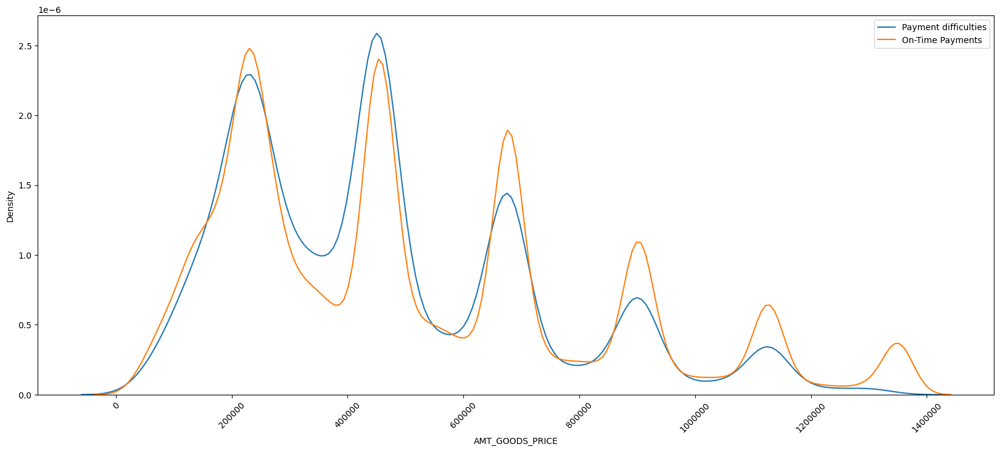

In [238]:
plt.figure(figsize = [20,8])
sns.distplot(appl_data1[appl_data1['AMT_GOODS_PRICE'] <= Max_value1].AMT_GOODS_PRICE,label = 'Payment difficulties', hist=False)
sns.distplot(appl_data0[appl_data0['AMT_GOODS_PRICE'] <= Max_value0].AMT_GOODS_PRICE,label = 'On-Time Payments', hist=False)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

In [239]:
Q1 = appl_data1['DAYS_EMPLOYED'].quantile(0.25)
Q3 = appl_data1['DAYS_EMPLOYED'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

2603.0


In [240]:
Min_value1 = (Q1 - 1.5 * IQR)
Max_value1 = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value1))
print("Max value after which outlier exist: {}".format(Max_value1))

Min value before which outlier exist: -3227.5
Max value after which outlier exist: 7184.5


In [241]:
Q1 = appl_data0['DAYS_EMPLOYED'].quantile(0.25)
Q3 = appl_data0['DAYS_EMPLOYED'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

5107.0


In [242]:
Min_value0 = (Q1 - 1.5 * IQR)
Max_value0 = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value0))
print("Max value after which outlier exist: {}".format(Max_value0))

Min value before which outlier exist: -6693.5
Max value after which outlier exist: 13734.5


C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\560132662.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(appl_data1[appl_data1['DAYS_EMPLOYED'] <= Max_value1].DAYS_EMPLOYED,label = 'Payment difficulties', hist=False)
C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\560132662.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com

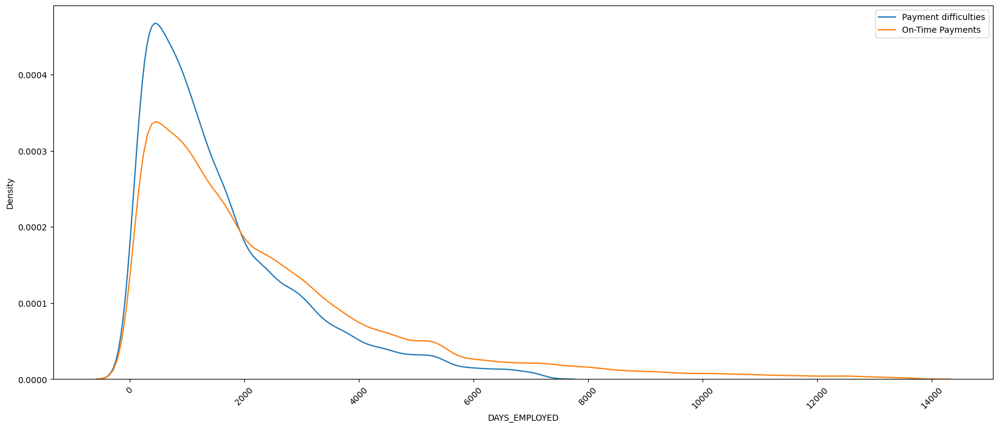

In [243]:
plt.figure(figsize = [20,8])
sns.distplot(appl_data1[appl_data1['DAYS_EMPLOYED'] <= Max_value1].DAYS_EMPLOYED,label = 'Payment difficulties', hist=False)
sns.distplot(appl_data0[appl_data0['DAYS_EMPLOYED'] <= Max_value0].DAYS_EMPLOYED,label = 'On-Time Payments', hist=False)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

In [244]:
Q1 = appl_data1['CNT_CHILDREN'].quantile(0.25)
Q3 = appl_data1['CNT_CHILDREN'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

1.0


In [245]:
Min_value1 = (Q1 - 1.5 * IQR)
Max_value1 = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value1))
print("Max value after which outlier exist: {}".format(Max_value1))

Min value before which outlier exist: -1.5
Max value after which outlier exist: 2.5


In [246]:
Q1 = appl_data0['CNT_CHILDREN'].quantile(0.25)
Q3 = appl_data0['CNT_CHILDREN'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

1.0


In [247]:
Min_value0 = (Q1 - 1.5 * IQR)
Max_value0 = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value0))
print("Max value after which outlier exist: {}".format(Max_value0))

Min value before which outlier exist: -1.5
Max value after which outlier exist: 2.5


C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\3834683294.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(appl_data1[appl_data1['CNT_CHILDREN'] <= Max_value1].CNT_CHILDREN,label = 'Payment difficulties', hist=False)
C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\3834683294.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com

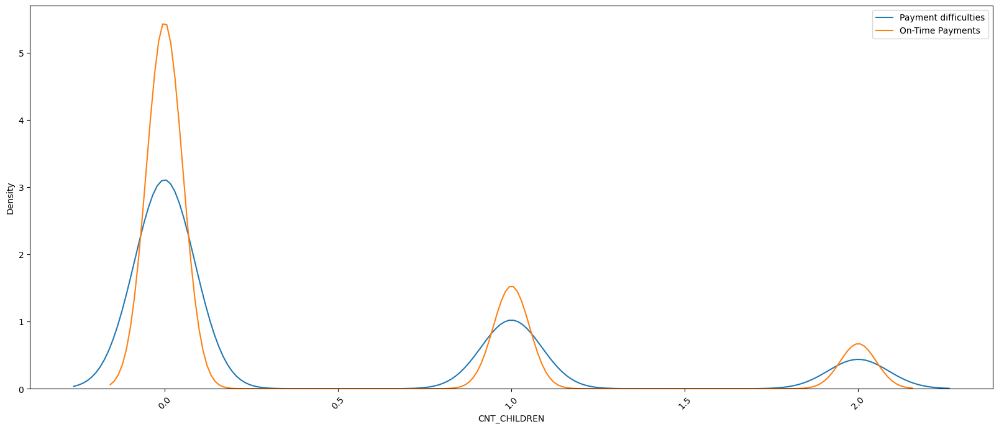

In [248]:
plt.figure(figsize = [20,8])
sns.distplot(appl_data1[appl_data1['CNT_CHILDREN'] <= Max_value1].CNT_CHILDREN,label = 'Payment difficulties', hist=False)
sns.distplot(appl_data0[appl_data0['CNT_CHILDREN'] <= Max_value0].CNT_CHILDREN,label = 'On-Time Payments', hist=False)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

In [249]:
Q1 = appl_data1['AMT_INCOME_TOTAL'].quantile(0.25)
Q3 = appl_data1['AMT_INCOME_TOTAL'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

90000.0


In [250]:
Min_value1 = (Q1 - 1.5 * IQR)
Max_value1 = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value1))
print("Max value after which outlier exist: {}".format(Max_value1))

Min value before which outlier exist: -22500.0
Max value after which outlier exist: 337500.0


In [251]:
Q1 = appl_data0['AMT_INCOME_TOTAL'].quantile(0.25)
Q3 = appl_data0['AMT_INCOME_TOTAL'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

90000.0


In [252]:
Min_value0 = (Q1 - 1.5 * IQR)
Max_value0 = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value0))
print("Max value after which outlier exist: {}".format(Max_value0))

Min value before which outlier exist: -22500.0
Max value after which outlier exist: 337500.0


C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\337215465.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(appl_data1[appl_data1['AMT_INCOME_TOTAL'] <= Max_value1].AMT_INCOME_TOTAL,label = 'Payment difficulties', hist=False)
C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\337215465.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.gith

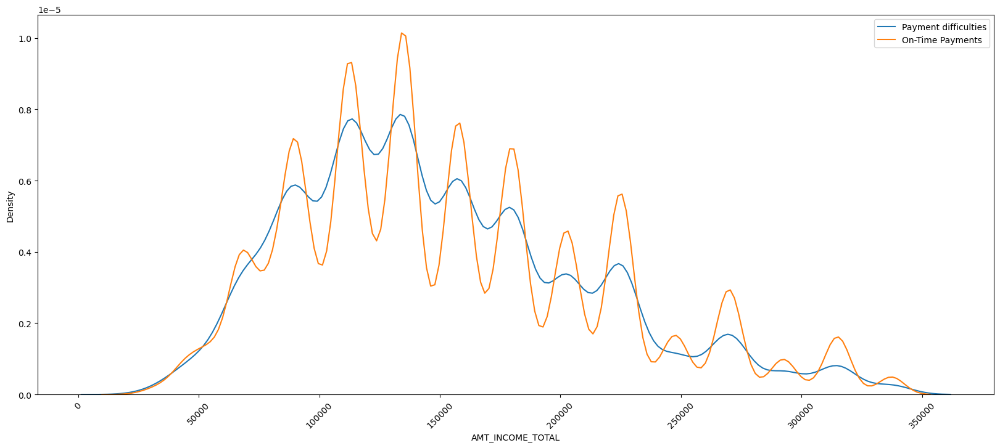

In [253]:
plt.figure(figsize = [20,8])
sns.distplot(appl_data1[appl_data1['AMT_INCOME_TOTAL'] <= Max_value1].AMT_INCOME_TOTAL,label = 'Payment difficulties', hist=False)
sns.distplot(appl_data0[appl_data0['AMT_INCOME_TOTAL'] <= Max_value0].AMT_INCOME_TOTAL,label = 'On-Time Payments', hist=False)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

In [254]:
max_value1_AMT_GOODS_PRICE = outlier_range(appl_data1,'AMT_GOODS_PRICE')
max_value1_AMT_GOODS_PRICE

1329750.0

In [255]:
max_value1_AMT_CREDIT = outlier_range(appl_data1,'AMT_CREDIT')
max_value1_AMT_CREDIT

1406688.75

In [256]:
max_value0_AMT_GOODS_PRICE = outlier_range(appl_data0,'AMT_GOODS_PRICE')
max_value0_AMT_GOODS_PRICE

1363500.0

In [257]:
max_value0_AMT_CREDIT = outlier_range(appl_data0,'AMT_CREDIT')
max_value0_AMT_CREDIT

1620000.0

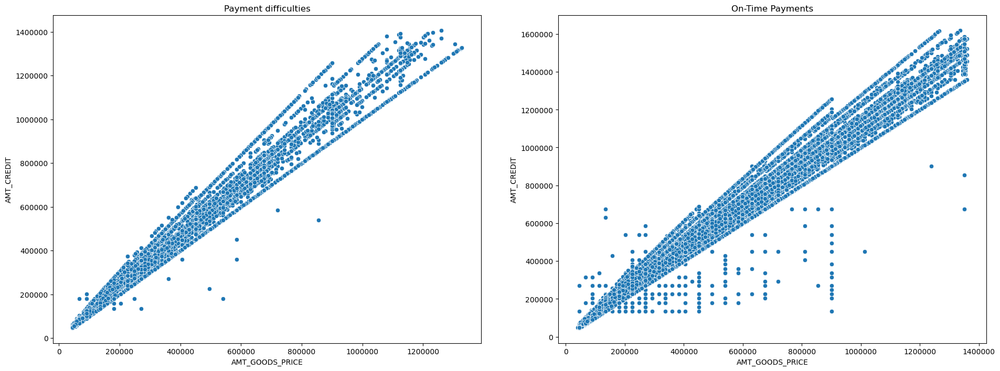

In [258]:
plt.figure(figsize = [20,8])

plt.subplot(1,2,1)
plt.title('Payment difficulties')
sns.scatterplot(x = appl_data1[appl_data1['AMT_GOODS_PRICE'] < max_value1_AMT_GOODS_PRICE].AMT_GOODS_PRICE, 
                y = appl_data1[appl_data1['AMT_CREDIT'] < max_value1_AMT_CREDIT].AMT_CREDIT, data = appl_data1)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.subplot(1,2,2)
plt.title('On-Time Payments')
sns.scatterplot(x = appl_data0[appl_data0['AMT_GOODS_PRICE'] < max_value0_AMT_GOODS_PRICE].AMT_GOODS_PRICE, 
                y = appl_data0[appl_data0['AMT_CREDIT'] < max_value0_AMT_CREDIT].AMT_CREDIT, data = appl_data0)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

In [259]:
max_value1_AMT_ANNUITY = outlier_range(appl_data1,'AMT_ANNUITY')
max_value1_AMT_ANNUITY

56398.5

In [260]:
max_value1_AMT_CREDIT = outlier_range(appl_data1,'AMT_CREDIT')
max_value1_AMT_CREDIT

1406688.75

In [261]:
max_value0_AMT_ANNUITY = outlier_range(appl_data0,'AMT_ANNUITY')
max_value0_AMT_ANNUITY

62187.75

In [262]:
max_value0_AMT_CREDIT = outlier_range(appl_data0,'AMT_CREDIT')
max_value0_AMT_CREDIT

1620000.0

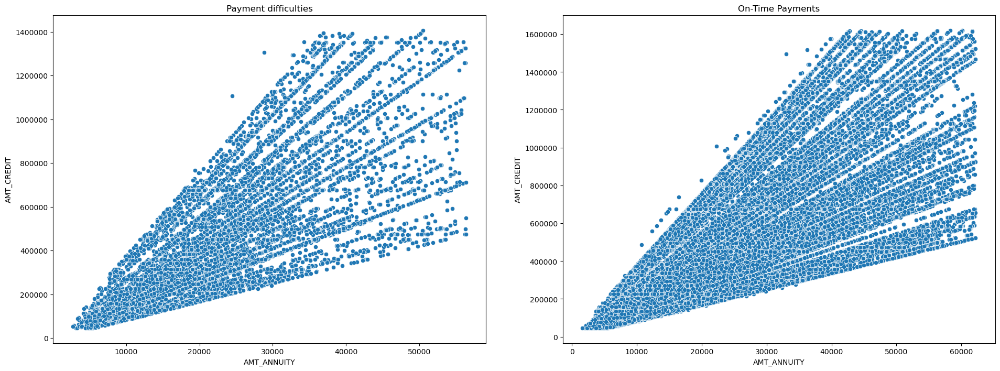

In [263]:
plt.figure(figsize = [20,8])

plt.subplot(1,2,1)
plt.title('Payment difficulties')
sns.scatterplot(x = appl_data1[appl_data1['AMT_ANNUITY'] < max_value1_AMT_ANNUITY].AMT_ANNUITY, 
                y = appl_data1[appl_data1['AMT_CREDIT'] < max_value1_AMT_CREDIT].AMT_CREDIT, data = appl_data1)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.subplot(1,2,2)
plt.title('On-Time Payments')
sns.scatterplot(x = appl_data0[appl_data0['AMT_ANNUITY'] < max_value0_AMT_ANNUITY].AMT_ANNUITY, 
                y = appl_data0[appl_data0['AMT_CREDIT'] < max_value0_AMT_CREDIT].AMT_CREDIT, data = appl_data0)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

In [264]:
max_value1_DAYS_EMPLOYED = outlier_range(appl_data1,'DAYS_EMPLOYED')
max_value1_DAYS_EMPLOYED

7184.5

In [265]:
max_value1_AMT_INCOME_TOTAL = outlier_range(appl_data1,'AMT_INCOME_TOTAL')
max_value1_AMT_INCOME_TOTAL

337500.0

In [266]:
max_value0_DAYS_EMPLOYED = outlier_range(appl_data0,'DAYS_EMPLOYED')
max_value0_DAYS_EMPLOYED

13734.5

In [267]:
max_value0_AMT_INCOME_TOTAL = outlier_range(appl_data0,'AMT_INCOME_TOTAL')
max_value0_AMT_INCOME_TOTAL

337500.0

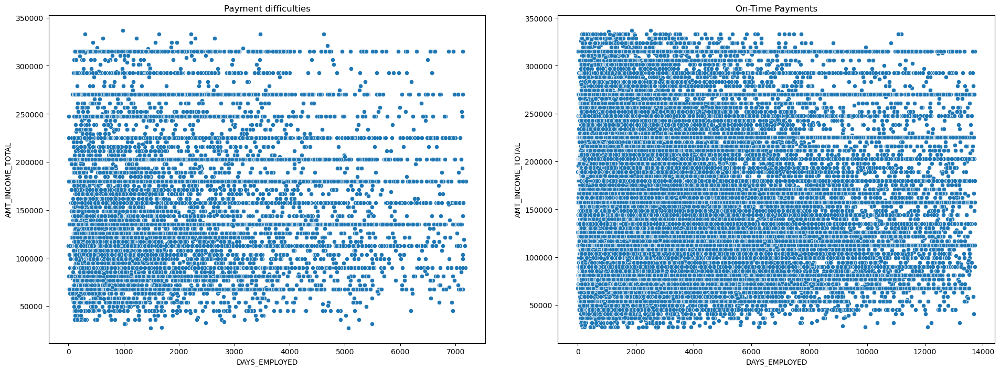

In [268]:
plt.figure(figsize = [20,8])

plt.subplot(1,2,1)
plt.title('Payment difficulties')
sns.scatterplot(x = appl_data1[appl_data1['DAYS_EMPLOYED'] < max_value1_DAYS_EMPLOYED].DAYS_EMPLOYED, 
                y = appl_data1[appl_data1['AMT_INCOME_TOTAL'] < max_value1_AMT_INCOME_TOTAL].AMT_INCOME_TOTAL, data = appl_data1)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.subplot(1,2,2)
plt.title('On-Time Payments')
sns.scatterplot(x = appl_data0[appl_data0['DAYS_EMPLOYED'] < max_value0_DAYS_EMPLOYED].DAYS_EMPLOYED, 
                y = appl_data0[appl_data0['AMT_INCOME_TOTAL'] < max_value0_AMT_INCOME_TOTAL].AMT_INCOME_TOTAL, data = appl_data0)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

In [269]:
max_value1_AMT_CREDIT = outlier_range(appl_data1,'AMT_CREDIT')
max_value1_AMT_CREDIT

1406688.75

In [270]:
max_value1_DAYS_BIRTH = outlier_range(appl_data1,'DAYS_BIRTH')
max_value1_DAYS_BIRTH

27998.5

In [271]:
max_value0_AMT_CREDIT = outlier_range(appl_data0,'AMT_CREDIT')
max_value0_AMT_CREDIT

1620000.0

In [272]:
max_value0_DAYS_BIRTH = outlier_range(appl_data0,'DAYS_BIRTH')
max_value0_DAYS_BIRTH

30680.375

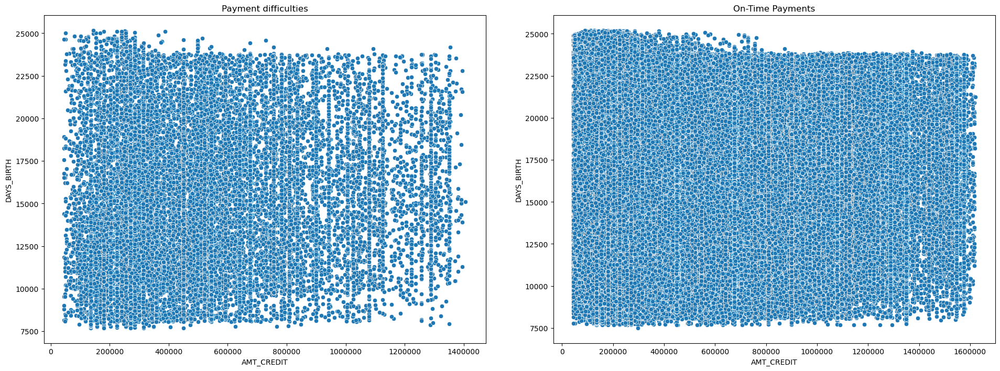

In [273]:
plt.figure(figsize = [20,8])

plt.subplot(1,2,1)
plt.title('Payment difficulties')
sns.scatterplot(x = appl_data1[appl_data1['AMT_CREDIT'] < max_value1_AMT_CREDIT].AMT_CREDIT, 
                y = appl_data1[appl_data1['DAYS_BIRTH'] < max_value1_DAYS_BIRTH].DAYS_BIRTH, data = appl_data1)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.subplot(1,2,2)
plt.title('On-Time Payments')
sns.scatterplot(x = appl_data0[appl_data0['AMT_CREDIT'] < max_value0_AMT_CREDIT].AMT_CREDIT, 
                y = appl_data0[appl_data0['DAYS_BIRTH'] < max_value0_DAYS_BIRTH].DAYS_BIRTH, data = appl_data0)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

In [274]:
max_value1_AMT_ANNUITY = outlier_range(appl_data1,'AMT_ANNUITY')
max_value1_AMT_ANNUITY

56398.5

In [275]:
max_value1_AMT_GOODS_PRICE = outlier_range(appl_data1,'AMT_GOODS_PRICE')
max_value1_AMT_GOODS_PRICE

1329750.0

In [276]:
max_value0_AMT_ANNUITY = outlier_range(appl_data0,'AMT_ANNUITY')
max_value0_AMT_ANNUITY

62187.75

In [277]:
max_value0_AMT_GOODS_PRICE = outlier_range(appl_data0,'AMT_GOODS_PRICE')
max_value0_AMT_GOODS_PRICE

1363500.0

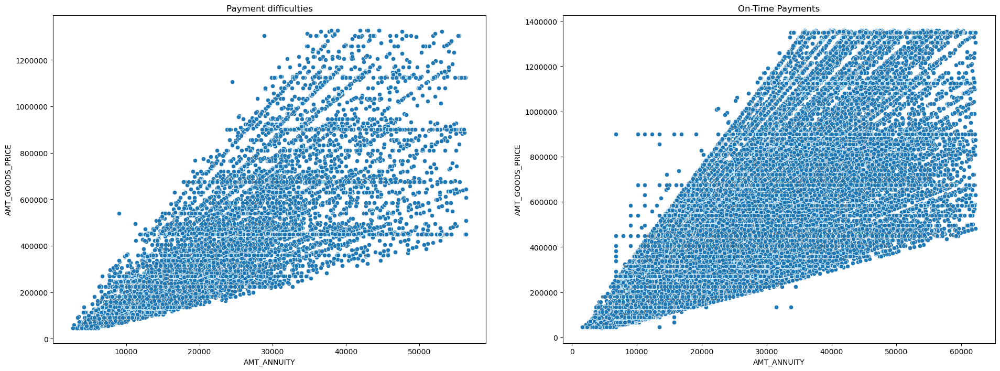

In [278]:
plt.figure(figsize = [20,8])

plt.subplot(1,2,1)
plt.title('Payment difficulties')
sns.scatterplot(x = appl_data1[appl_data1['AMT_ANNUITY'] < max_value1_AMT_ANNUITY].AMT_ANNUITY, 
                y = appl_data1[appl_data1['AMT_GOODS_PRICE'] < max_value1_AMT_GOODS_PRICE].AMT_GOODS_PRICE, data = appl_data1)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.subplot(1,2,2)
plt.title('On-Time Payments')
sns.scatterplot(x = appl_data0[appl_data0['AMT_ANNUITY'] < max_value0_AMT_ANNUITY].AMT_ANNUITY, 
                y = appl_data0[appl_data0['AMT_GOODS_PRICE'] < max_value0_AMT_GOODS_PRICE].AMT_GOODS_PRICE, data = appl_data0)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

In [279]:
max_value1_AMT_CREDIT = outlier_range(appl_data1,'AMT_CREDIT')
max_value1_AMT_CREDIT

1406688.75

In [280]:
max_value0_AMT_CREDIT = outlier_range(appl_data0,'AMT_CREDIT')
max_value0_AMT_CREDIT

1620000.0

In [281]:
appl_data1.groupby(by = ['NAME_EDUCATION_TYPE','CODE_GENDER']).AMT_CREDIT.describe().head()

count           mean            std  \
NAME_EDUCATION_TYPE CODE_GENDER                                         
Academic degree     F               3.0  950245.500000  504711.375348   
Higher education    F            2438.0  648500.581624  410415.703440   
                    M            1571.0  642070.944940  409695.934841   
Incomplete higher   F             504.0  520150.348214  352227.493127   
                    M             368.0  554723.816576  347843.706372   

                                      min       25%       50%          75%  \
NAME_EDUCATION_TYPE CODE_GENDER                                              
Academic degree     F            544491.0  667660.5  790830.0  1153122.750   
Higher education    F             47970.0  323595.0  545040.0   877500.000   
                    M             45000.0  329202.0  545040.0   832797.000   
Incomplete higher   F             91692.0  269550.0  450000.0   675000.000   
                    M             74628.0  284400.0  497520.0   699976.125   

                                       max  
NAME_EDUCATION_TYPE CODE_GENDER             
Academic degree     F            1515415.5  
Higher education    F            2687355.0  
                    M            2695500.0  
Incomplete higher   F            2695500.0  
                    M            2013840.0

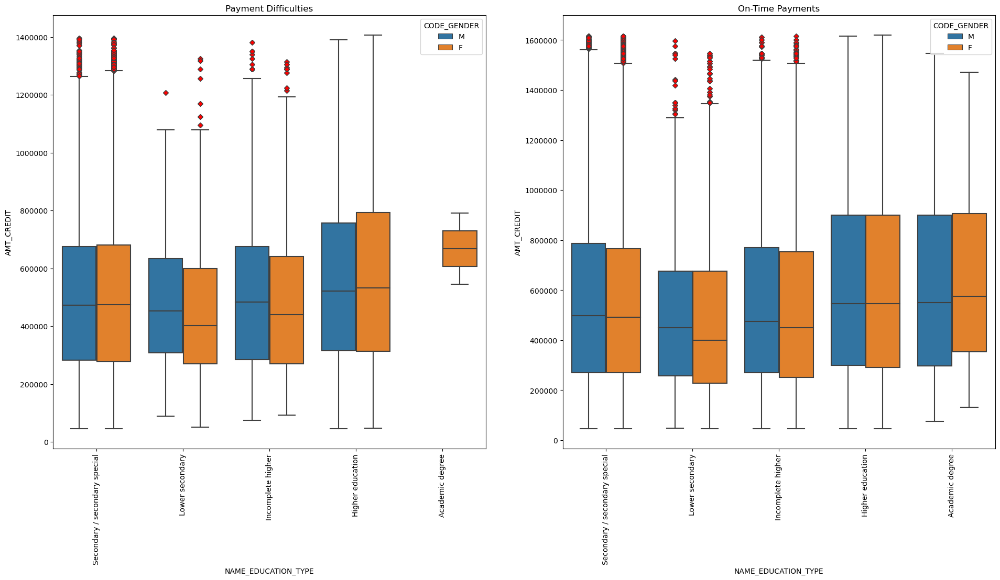

In [282]:
fn_bi_boxplot('NAME_EDUCATION_TYPE','AMT_CREDIT',max_value1_AMT_CREDIT,max_value0_AMT_CREDIT,'CODE_GENDER')

In [283]:
max_value1_AMT_INCOME_TOTAL = outlier_range(appl_data1,'AMT_INCOME_TOTAL')
max_value1_AMT_INCOME_TOTAL

337500.0

In [284]:
max_value0_AMT_INCOME_TOTAL = outlier_range(appl_data0,'AMT_INCOME_TOTAL')
max_value0_AMT_INCOME_TOTAL

337500.0

In [285]:
appl_data1.groupby(by = ['NAME_FAMILY_STATUS','CODE_GENDER']).AMT_INCOME_TOTAL.describe().head()

count           mean           std      min  \
NAME_FAMILY_STATUS CODE_GENDER                                                 
Civil marriage     F            1753.0  153620.720194  1.010459e+05  25650.0   
                   M            1208.0  173949.988411  9.244917e+04  36000.0   
Married            F            8324.0  159907.850853  1.283283e+06  27000.0   
                   M            6526.0  182233.063975  9.478777e+04  31500.0   
Separated          F            1045.0  161159.546411  8.263333e+04  36000.0   

                                     25%       50%       75%          max  
NAME_FAMILY_STATUS CODE_GENDER                                             
Civil marriage     F            108000.0  135000.0  180000.0    3150000.0  
                   M            117000.0  157500.0  202500.0    1350000.0  
Married            F             90000.0  135000.0  180000.0  117000000.0  
                   M            126000.0  157500.0  225000.0    1890000.0  
Separated          F            112500.0  135000.0  202500.0     832500.0

In [286]:
appl_data0.groupby(by = ['NAME_FAMILY_STATUS','CODE_GENDER']).AMT_INCOME_TOTAL.describe().head()

count           mean            std  \
NAME_FAMILY_STATUS CODE_GENDER                                           
Civil marriage     F             19017.0  162086.054245  106811.493431   
                   M              7797.0  184126.294363  106559.488198   
Married            F            114125.0  154289.532323   88593.427099   
                   M             67459.0  199592.828178  147599.764903   
Separated          F             14416.0  166374.209767   94782.184577   

                                    min       25%       50%       75%  \
NAME_FAMILY_STATUS CODE_GENDER                                          
Civil marriage     F            27000.0  112500.0  135000.0  202500.0   
                   M            27000.0  121500.0  157500.0  225000.0   
Married            F            26100.0   94500.0  135000.0  180000.0   
                   M            27000.0  135000.0  180000.0  225000.0   
Separated          F            27000.0  112500.0  139500.0  202500.0   

                                       max  
NAME_FAMILY_STATUS CODE_GENDER              
Civil marriage     F             9000000.0  
                   M             3825000.0  
Married            F             3600000.0  
                   M            18000090.0  
Separated          F             2250000.0

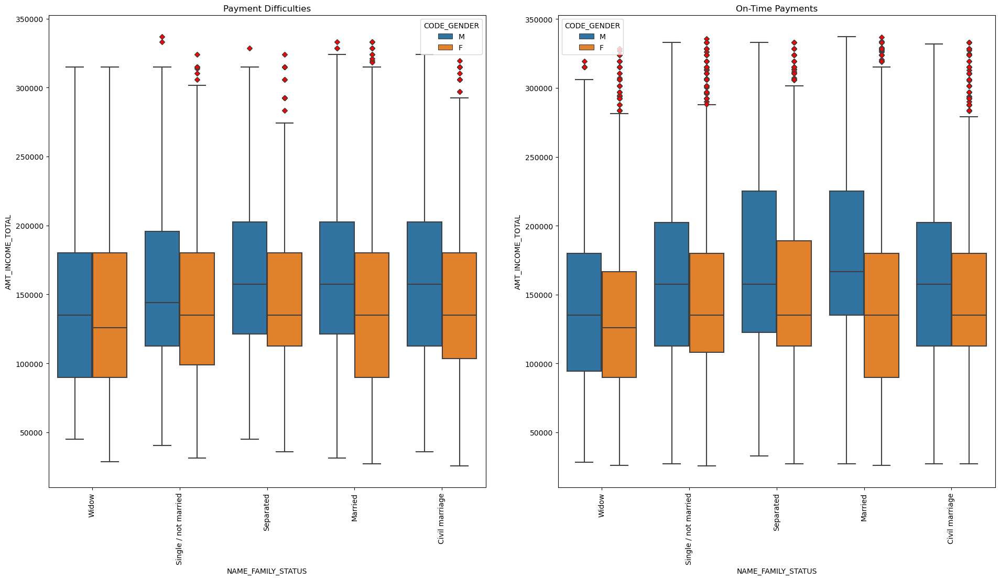

In [287]:
fn_bi_boxplot('NAME_FAMILY_STATUS','AMT_INCOME_TOTAL',max_value1_AMT_INCOME_TOTAL,max_value0_AMT_INCOME_TOTAL,'CODE_GENDER')

In [288]:
max_value1_AMT_INCOME_TOTAL = outlier_range(appl_data1,'AMT_INCOME_TOTAL')
max_value1_AMT_INCOME_TOTAL

337500.0

In [289]:
max_value0_AMT_INCOME_TOTAL = outlier_range(appl_data0,'AMT_INCOME_TOTAL')
max_value0_AMT_INCOME_TOTAL

337500.0

In [290]:
appl_data1.groupby(by = ['YEARS_BIRTH_CATEGORY','NAME_HOUSING_TYPE']).AMT_INCOME_TOTAL.describe().head()

count           mean           std  \
YEARS_BIRTH_CATEGORY NAME_HOUSING_TYPE                                          
20-30                Co-op apartment        40.0  148628.700000  59516.236000   
                     House / apartment    4201.0  151897.216139  70874.650190   
                     Municipal apartment   153.0  153608.823529  78282.787422   
                     Office apartment       40.0  147375.000000  50817.263118   
                     Rented apartment      229.0  144210.104803  59998.658014   

                                              min       25%       50%  \
YEARS_BIRTH_CATEGORY NAME_HOUSING_TYPE                                  
20-30                Co-op apartment      67500.0  110250.0  135000.0   
                     House / apartment    31500.0  112500.0  135000.0   
                     Municipal apartment  45000.0  108000.0  135000.0   
                     Office apartment     67500.0  112500.0  135000.0   
                     Rented apartment     45000.0   99000.0  135000.0   

                                               75%       max  
YEARS_BIRTH_CATEGORY NAME_HOUSING_TYPE                        
20-30                Co-op apartment      185625.0  360000.0  
                     House / apartment    180000.0  810000.0  
                     Municipal apartment  180000.0  675000.0  
                     Office apartment     180000.0  270000.0  
                     Rented apartment     180000.0  405000.0

In [291]:
appl_data0.groupby(by = ['YEARS_BIRTH_CATEGORY','NAME_HOUSING_TYPE']).AMT_INCOME_TOTAL.describe().head()

count           mean  \
YEARS_BIRTH_CATEGORY NAME_HOUSING_TYPE                             
20-30                Co-op apartment        298.0  161153.154362   
                     House / apartment    33165.0  163944.390551   
                     Municipal apartment   1099.0  166235.077343   
                     Office apartment       455.0  177960.184615   
                     Rented apartment      1535.0  153028.061238   

                                                    std      min       25%  \
YEARS_BIRTH_CATEGORY NAME_HOUSING_TYPE                                       
20-30                Co-op apartment       76171.261949  45000.0  112500.0   
                     House / apartment     92313.182190  27000.0  112500.0   
                     Municipal apartment   88698.468692  45000.0  112500.0   
                     Office apartment     115765.133191  36000.0  112500.0   
                     Rented apartment      70748.987226  29250.0  109125.0   

                                               50%       75%        max  
YEARS_BIRTH_CATEGORY NAME_HOUSING_TYPE                                   
20-30                Co-op apartment      139500.0  202500.0   720000.0  
                     House / apartment    141264.0  202500.0  4500000.0  
                     Municipal apartment  144000.0  202500.0  1417500.0  
                     Office apartment     157500.0  225000.0  1800000.0  
                     Rented apartment     135000.0  180000.0   742500.0

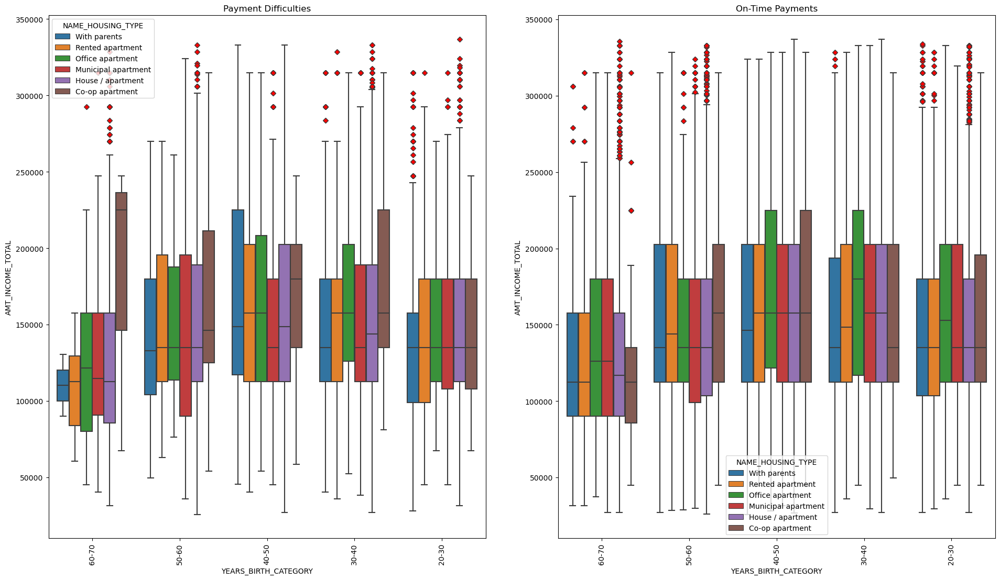

In [292]:
fn_bi_boxplot('YEARS_BIRTH_CATEGORY','AMT_INCOME_TOTAL',max_value1_AMT_INCOME_TOTAL,max_value0_AMT_INCOME_TOTAL,'NAME_HOUSING_TYPE')

In [293]:
max_value1_AMT_ANNUITY = outlier_range(appl_data1,'AMT_ANNUITY')
max_value1_AMT_ANNUITY

56398.5

In [294]:
max_value0_AMT_ANNUITY = outlier_range(appl_data0,'AMT_ANNUITY')
max_value0_AMT_ANNUITY

62187.75

In [295]:
appl_data1.groupby(by = ['FLAG_OWN_CAR','CODE_GENDER']).AMT_ANNUITY.describe().head()

count          mean           std     min  \
FLAG_OWN_CAR CODE_GENDER                                                
N            F            11567.0  24910.533717  11855.563615  2722.5   
             M             5682.0  26258.836061  12075.777539  3172.5   
Y            F             2603.0  28577.909527  13256.174575  3559.5   
             M             4973.0  29293.817313  13130.940168  4374.0   

                                25%       50%       75%       max  
FLAG_OWN_CAR CODE_GENDER                                           
N            F            16350.750  23715.00  31261.50  149211.0  
             M            17517.375  25202.25  32352.75  127507.5  
Y            F            18969.750  26797.50  35961.75  128178.0  
             M            20007.000  27558.00  36459.00  115803.0

In [296]:
appl_data0.groupby(by = ['FLAG_OWN_CAR','CODE_GENDER']).AMT_ANNUITY.describe().head()

count          mean           std     min  \
FLAG_OWN_CAR CODE_GENDER                                                 
N            F            145917.0  25351.258280  13579.026022  1615.5   
             M             39749.0  26799.801001  14295.319107  1980.0   
Y            F             42357.0  29830.221120  15705.982418  1993.5   
             M             54651.0  30200.482077  15988.655901  2317.5   

                              25%      50%      75%       max  
FLAG_OWN_CAR CODE_GENDER                                       
N            F            15448.5  23283.0  32125.5  230161.5  
             M            16294.5  24750.0  34114.5  225000.0  
Y            F            18409.5  27085.5  38133.0  225000.0  
             M            19125.0  27630.0  38322.0  258025.5

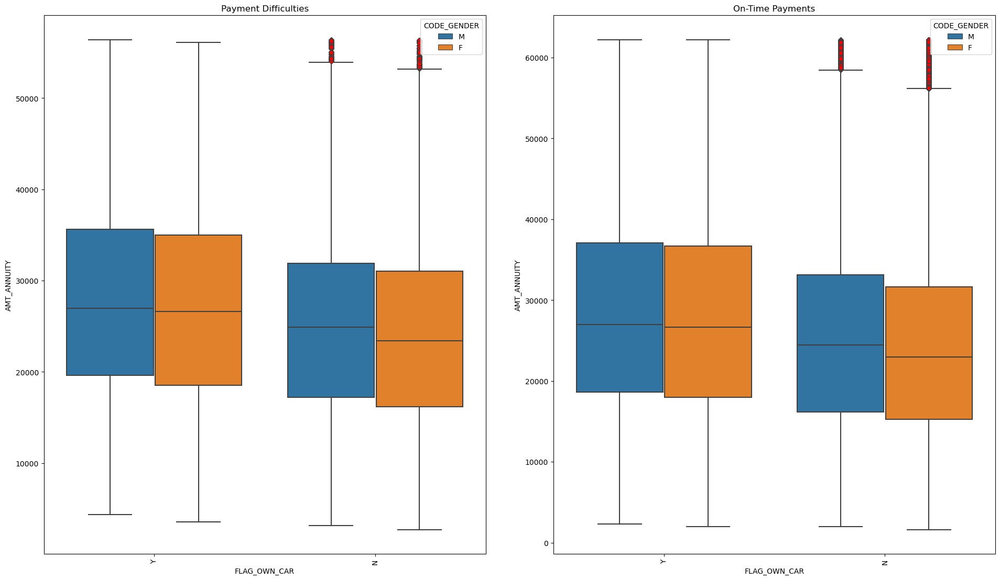

In [297]:
fn_bi_boxplot('FLAG_OWN_CAR','AMT_ANNUITY',max_value1_AMT_ANNUITY,max_value0_AMT_ANNUITY,'CODE_GENDER')

In [298]:
max_value1_AMT_GOODS_PRICE = outlier_range(appl_data1,'AMT_GOODS_PRICE')
max_value1_AMT_GOODS_PRICE

1329750.0

In [299]:
max_value0_AMT_GOODS_PRICE = outlier_range(appl_data0,'AMT_GOODS_PRICE')
max_value0_AMT_GOODS_PRICE

1363500.0

In [300]:
appl_data1.groupby(by = ['NAME_INCOME_TYPE','CODE_GENDER']).AMT_GOODS_PRICE.describe().head()

count           mean            std  \
NAME_INCOME_TYPE     CODE_GENDER                                         
Commercial associate F            2966.0  536362.214262  353710.652628   
                     M            2391.0  526387.309912  335859.941286   
Maternity leave      F               2.0  929250.000000  715945.615951   
Pensioner            F            2241.0  495016.255020  317042.451456   
                     M             739.0  486543.075101  321104.431714   

                                       min       25%       50%        75%  \
NAME_INCOME_TYPE     CODE_GENDER                                            
Commercial associate F             45000.0  270000.0  450000.0   675000.0   
                     M             45000.0  270000.0  450000.0   675000.0   
Maternity leave      F            423000.0  676125.0  929250.0  1182375.0   
Pensioner            F             45000.0  229500.0  450000.0   675000.0   
                     M             45000.0  229500.0  450000.0   675000.0   

                                        max  
NAME_INCOME_TYPE     CODE_GENDER             
Commercial associate F            3600000.0  
                     M            2961000.0  
Maternity leave      F            1435500.0  
Pensioner            F            2173500.0  
                     M            1800000.0

In [301]:
appl_data0.groupby(by = ['NAME_INCOME_TYPE','CODE_GENDER']).AMT_GOODS_PRICE.describe().head()

count          mean           std  \
NAME_INCOME_TYPE     CODE_GENDER                                        
Businessman          F                3.0  1.125000e+06  1.031080e+06   
                     M                7.0  1.272857e+06  7.551041e+05   
Commercial associate F            41522.0  6.022426e+05  4.008250e+05   
                     M            24691.0  6.202202e+05  4.224455e+05   
Maternity leave      F                2.0  5.625000e+05  3.500179e+05   

                                       min       25%        50%        75%  \
NAME_INCOME_TYPE     CODE_GENDER                                             
Businessman          F            225000.0  562500.0   900000.0  1575000.0   
                     M            495000.0  607500.0  1350000.0  1800000.0   
Commercial associate F             45000.0  270000.0   472500.0   837000.0   
                     M             45000.0  270000.0   472500.0   900000.0   
Maternity leave      F            315000.0  438750.0   562500.0   686250.0   

                                        max  
NAME_INCOME_TYPE     CODE_GENDER             
Businessman          F            2250000.0  
                     M            2250000.0  
Commercial associate F            4050000.0  
                     M            4050000.0  
Maternity leave      F             810000.0

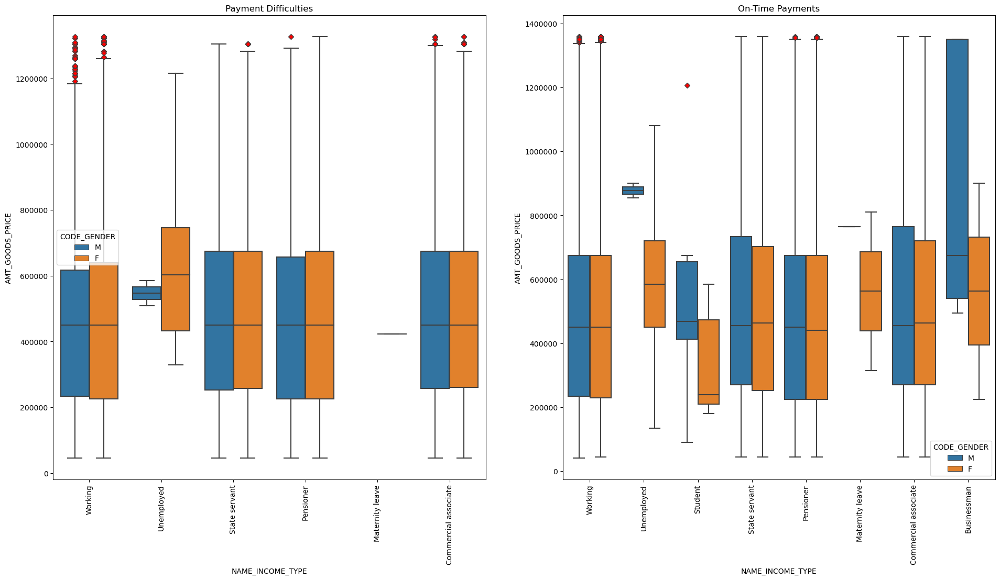

In [302]:
fn_bi_boxplot('NAME_INCOME_TYPE','AMT_GOODS_PRICE',max_value1_AMT_GOODS_PRICE,max_value0_AMT_GOODS_PRICE,'CODE_GENDER')

In [303]:
max_value1_AMT_INCOME_TOTAL = outlier_range(appl_data1,'AMT_INCOME_TOTAL')
max_value1_AMT_INCOME_TOTAL

337500.0

In [304]:
max_value0_AMT_INCOME_TOTAL = outlier_range(appl_data0,'AMT_INCOME_TOTAL')
max_value0_AMT_INCOME_TOTAL

337500.0

In [305]:
appl_data1.groupby(by = ['NAME_INCOME_TYPE','CODE_GENDER']).AMT_INCOME_TOTAL.describe().head()

count           mean            std  \
NAME_INCOME_TYPE     CODE_GENDER                                         
Commercial associate F            2968.0  172962.535209   94922.968878   
                     M            2392.0  207145.505017  120281.013430   
Maternity leave      F               2.0   58500.000000   12727.922061   
Pensioner            F            2243.0  133275.589166   71580.630080   
                     M             739.0  142481.259134   76941.738672   

                                      min       25%       50%       75%  \
NAME_INCOME_TYPE     CODE_GENDER                                          
Commercial associate F            36000.0  112500.0  157500.0  202500.0   
                     M            45000.0  135000.0  180000.0  225000.0   
Maternity leave      F            49500.0   54000.0   58500.0   63000.0   
Pensioner            F            25650.0   90000.0  117000.0  157500.0   
                     M            31500.0   90000.0  135000.0  180000.0   

                                        max  
NAME_INCOME_TYPE     CODE_GENDER             
Commercial associate F            1575000.0  
                     M            1890000.0  
Maternity leave      F              67500.0  
Pensioner            F            1260000.0  
                     M             585000.0

In [306]:
appl_data0.groupby(by = ['NAME_INCOME_TYPE','CODE_GENDER']).AMT_INCOME_TOTAL.describe().head()

count           mean            std  \
NAME_INCOME_TYPE     CODE_GENDER                                          
Businessman          F                3.0  555000.000000  337749.907476   
                     M                7.0  694285.714286  738446.728904   
Commercial associate F            41552.0  187223.556855  108354.861814   
                     M            24705.0  232612.571849  199602.652415   
Maternity leave      F                2.0  112500.000000   31819.805153   

                                       min       25%       50%       75%  \
NAME_INCOME_TYPE     CODE_GENDER                                           
Businessman          F            225000.0  382500.0  540000.0  720000.0   
                     M            180000.0  202500.0  450000.0  787500.0   
Commercial associate F             26550.0  117000.0  157500.0  225000.0   
                     M             36000.0  157500.0  202500.0  270000.0   
Maternity leave      F             90000.0  101250.0  112500.0  123750.0   

                                         max  
NAME_INCOME_TYPE     CODE_GENDER              
Businessman          F              900000.0  
                     M             2250000.0  
Commercial associate F             3600000.0  
                     M            18000090.0  
Maternity leave      F              135000.0

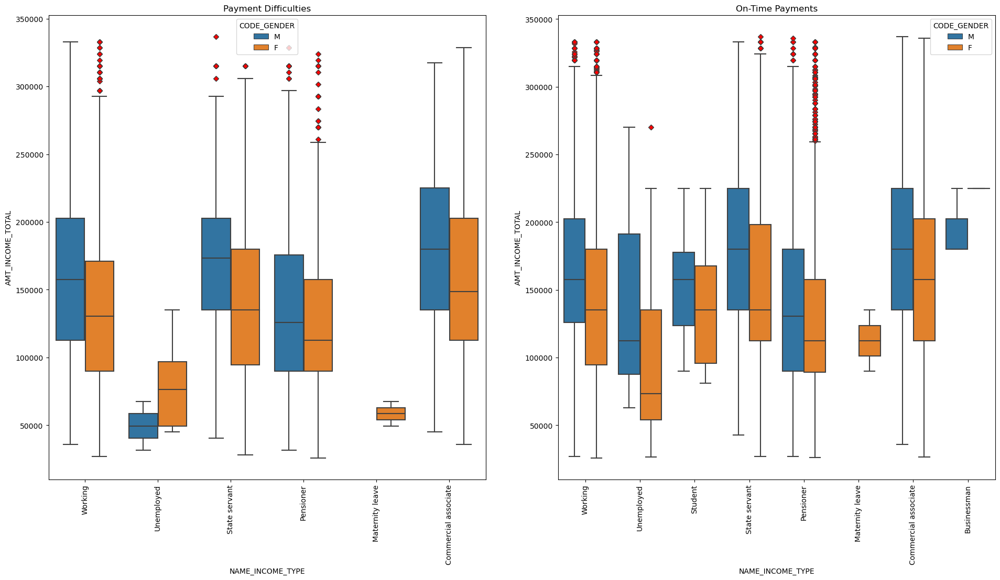

In [307]:
fn_bi_boxplot('NAME_INCOME_TYPE','AMT_INCOME_TOTAL',max_value1_AMT_INCOME_TOTAL,max_value0_AMT_INCOME_TOTAL,'CODE_GENDER')

In [308]:
max_value1_AMT_INCOME_TOTAL = outlier_range(appl_data1,'AMT_INCOME_TOTAL')
max_value1_AMT_INCOME_TOTAL

337500.0

In [309]:
max_value0_AMT_INCOME_TOTAL = outlier_range(appl_data0,'AMT_INCOME_TOTAL')
max_value0_AMT_INCOME_TOTAL

337500.0

In [310]:
appl_data1.groupby(by = ['OCCUPATION_TYPE','CODE_GENDER']).AMT_INCOME_TOTAL.describe().head()

count           mean           std      min  \
OCCUPATION_TYPE CODE_GENDER                                                
Accountants     F            457.0  174840.636761  79021.040323  54000.0   
                M             17.0  202367.647059  98623.658009  81000.0   
Cleaning staff  F            410.0  128907.987805  70328.229454  31500.0   
                M             37.0  119493.243243  45786.206320  45000.0   
Cooking staff   F            555.0  129298.378378  55531.877347  32400.0   

                                  25%       50%       75%       max  
OCCUPATION_TYPE CODE_GENDER                                          
Accountants     F            112500.0  157500.0  202500.0  540000.0  
                M            121500.0  180000.0  252000.0  438750.0  
Cleaning staff  F             90000.0  112500.0  157500.0  720000.0  
                M             90000.0  112500.0  135000.0  247500.0  
Cooking staff   F             90000.0  112500.0  157500.0  405000.0

In [311]:
appl_data0.groupby(by = ['OCCUPATION_TYPE','CODE_GENDER']).AMT_INCOME_TOTAL.describe().head()

count           mean            std      min  \
OCCUPATION_TYPE CODE_GENDER                                                  
Accountants     F            9072.0  194324.507937  109135.608131  27000.0   
                M             267.0  236490.893258  131795.325488  54000.0   
Cleaning staff  F            3904.0  130602.052254   63495.045291  25650.0   
                M             302.0  137172.516556   64373.090447  31500.0   
Cooking staff   F            4830.0  134460.402922   60213.558132  27000.0   

                                  25%       50%       75%        max  
OCCUPATION_TYPE CODE_GENDER                                           
Accountants     F            130500.0  175500.0  225000.0  2214117.0  
                M            141750.0  216000.0  270000.0  1035000.0  
Cleaning staff  F             90000.0  112500.0  157500.0  1080000.0  
                M             90000.0  132750.0  169875.0   450000.0  
Cooking staff   F             90000.0  121500.0  157500.0   540000.0

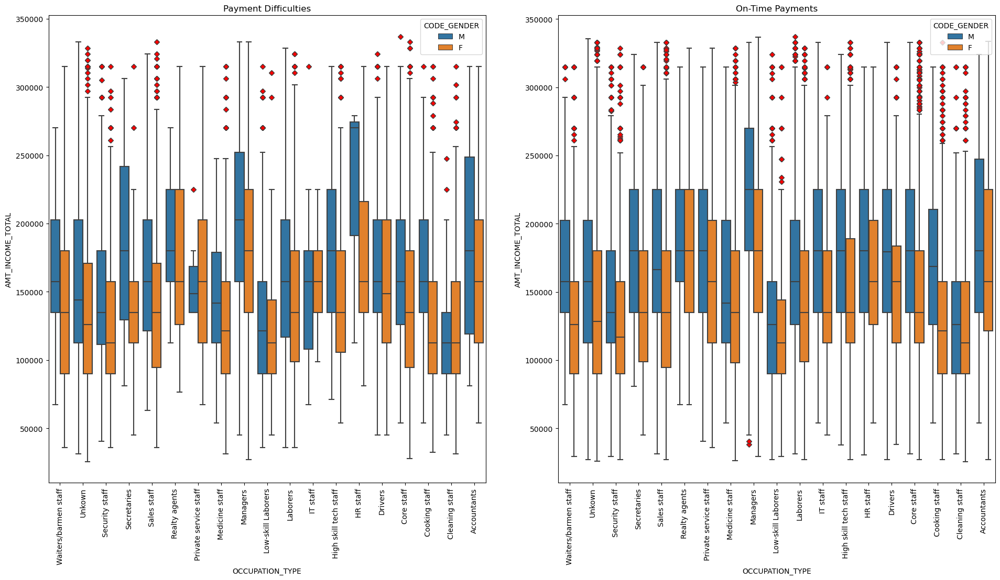

In [312]:
fn_bi_boxplot('OCCUPATION_TYPE','AMT_INCOME_TOTAL',max_value1_AMT_INCOME_TOTAL,max_value0_AMT_INCOME_TOTAL,'CODE_GENDER')

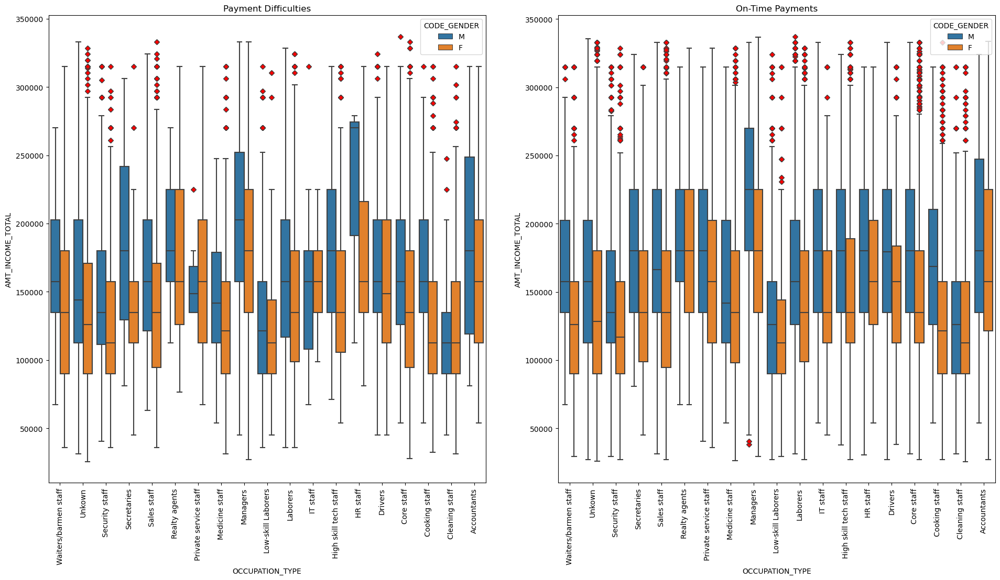

In [313]:
fn_bi_boxplot('OCCUPATION_TYPE','AMT_INCOME_TOTAL',max_value1_AMT_INCOME_TOTAL,max_value0_AMT_INCOME_TOTAL,'CODE_GENDER')

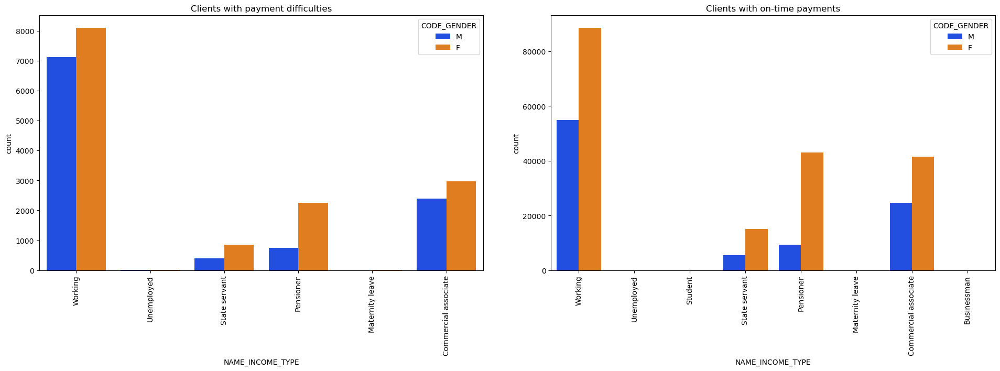

In [314]:
fn_bi_countplot('NAME_INCOME_TYPE','CODE_GENDER')

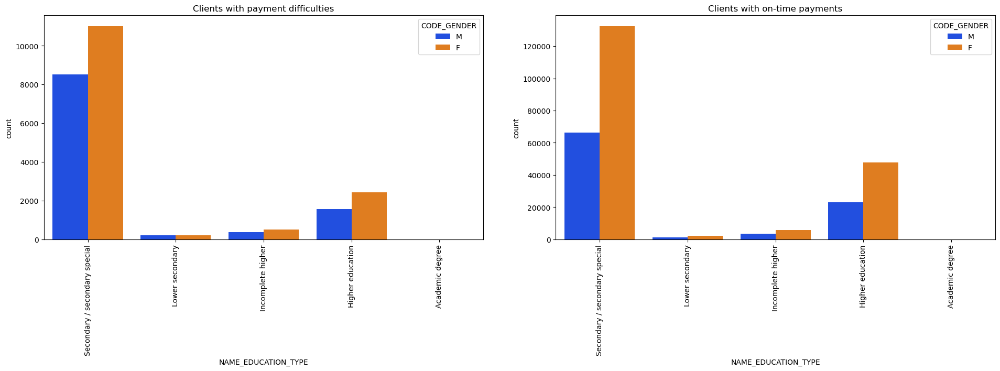

In [315]:
fn_bi_countplot('NAME_EDUCATION_TYPE','CODE_GENDER')

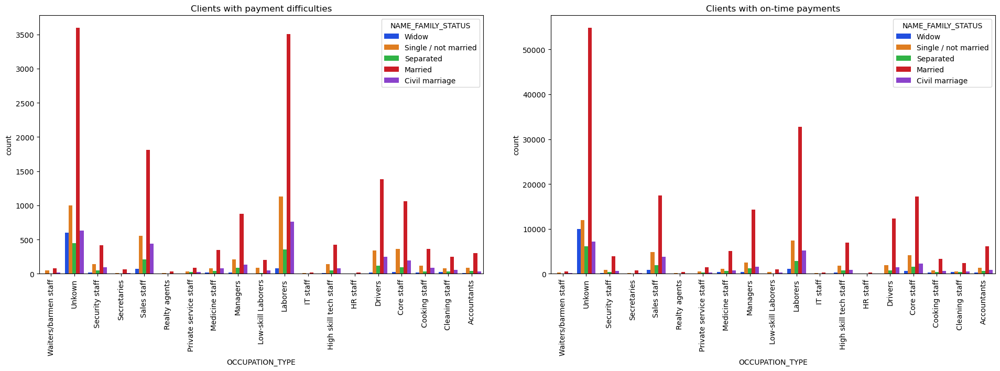

In [316]:
fn_bi_countplot('OCCUPATION_TYPE','NAME_FAMILY_STATUS')

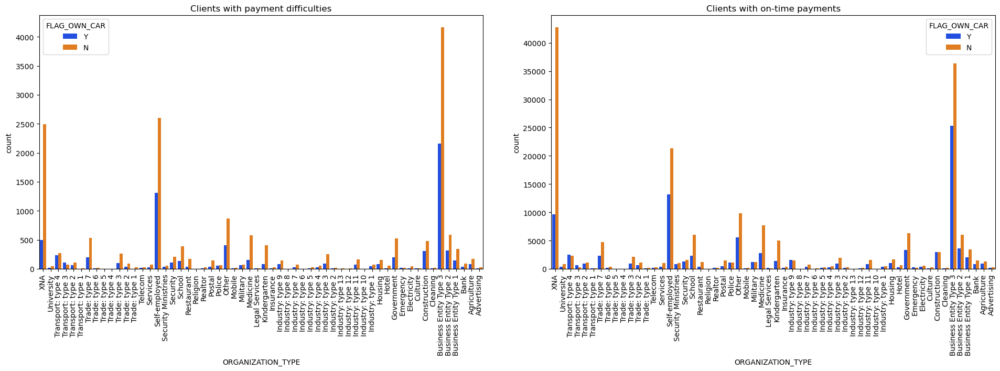

In [317]:
fn_bi_countplot('ORGANIZATION_TYPE','FLAG_OWN_CAR')

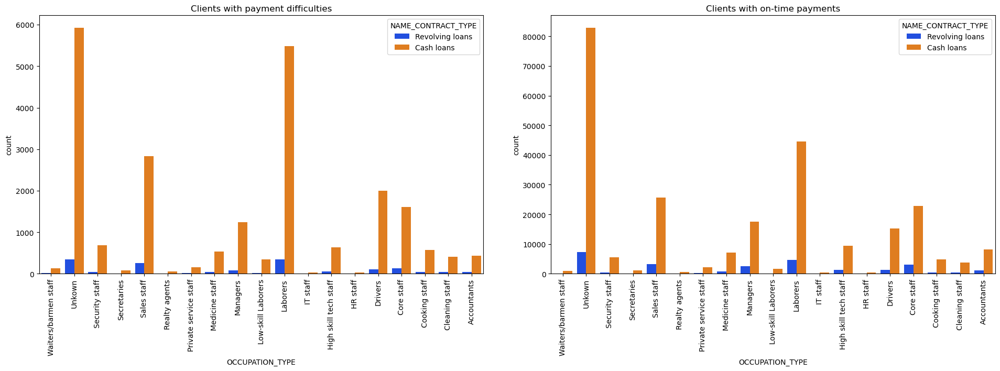

In [318]:
fn_bi_countplot('OCCUPATION_TYPE','NAME_CONTRACT_TYPE')

In [319]:
df_prev = pd.read_csv('previous_application.csv')

In [320]:
df_prev.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [321]:
df_prev.info(verbose = True,null_counts = True)

C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\2371858747.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  df_prev.info(verbose = True,null_counts = True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [322]:
df_prev.shape

(1670214, 37)

In [323]:
df_prev.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,...,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,...,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,...,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,...,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,...,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,...,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,...,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,...,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


In [324]:
df_prev.select_dtypes(include = "object").columns

Index(['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON',
       'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY',
       'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE',
       'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

In [325]:
# Checking number of categorical variables
len(df_prev.select_dtypes(include = "object").columns)

16

In [326]:
df_prev.select_dtypes(include=["int64","float64"]).columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'AMT_ANNUITY', 'AMT_APPLICATION',
       'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'SELLERPLACE_AREA',
       'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE',
       'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION',
       'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [327]:
len(df_prev.select_dtypes(include=["int64","float64"]).columns)

21

In [328]:
df_prev.select_dtypes(include=["int64","float64"]).head()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,1730.430,17145.0,17145.0,0.0,17145.0,15,1,0.0,...,0.867336,-73,35,12.0,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,25188.615,607500.0,679671.0,NaN,607500.0,11,1,NaN,...,NaN,-164,-1,36.0,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,15060.735,112500.0,136444.5,NaN,112500.0,11,1,NaN,...,NaN,-301,-1,12.0,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,47041.335,450000.0,470790.0,NaN,450000.0,7,1,NaN,...,NaN,-512,-1,12.0,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,31924.395,337500.0,404055.0,NaN,337500.0,9,1,NaN,...,NaN,-781,-1,24.0,NaN,NaN,NaN,NaN,NaN,NaN


In [329]:
df_prev.dtypes

SK_ID_PREV                       int64
SK_ID_CURR                       int64
NAME_CONTRACT_TYPE              object
AMT_ANNUITY                    float64
AMT_APPLICATION                float64
AMT_CREDIT                     float64
AMT_DOWN_PAYMENT               float64
AMT_GOODS_PRICE                float64
WEEKDAY_APPR_PROCESS_START      object
HOUR_APPR_PROCESS_START          int64
FLAG_LAST_APPL_PER_CONTRACT     object
NFLAG_LAST_APPL_IN_DAY           int64
RATE_DOWN_PAYMENT              float64
RATE_INTEREST_PRIMARY          float64
RATE_INTEREST_PRIVILEGED       float64
NAME_CASH_LOAN_PURPOSE          object
NAME_CONTRACT_STATUS            object
DAYS_DECISION                    int64
NAME_PAYMENT_TYPE               object
CODE_REJECT_REASON              object
NAME_TYPE_SUITE                 object
NAME_CLIENT_TYPE                object
NAME_GOODS_CATEGORY             object
NAME_PORTFOLIO                  object
NAME_PRODUCT_TYPE               object
CHANNEL_TYPE             

In [330]:
df_prev.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [331]:
df_prev.isnull().values.any()

True

In [332]:
df_prev.isnull().values.sum()

11109336

In [333]:
df_prev.columns[df_prev.isnull().any()]

Index(['AMT_ANNUITY', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_TYPE_SUITE', 'CNT_PAYMENT',
       'PRODUCT_COMBINATION', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE',
       'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION',
       'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [334]:
len(df_prev.columns[df_prev.isnull().any()])

16

In [335]:
null_count = df_prev.isnull().sum()
null_percentage = round((df_prev.isnull().sum()/df_prev.shape[0])*100, 2)

In [336]:
null_df = pd.DataFrame({'column_name' : df_prev.columns,'null_count' : null_count,'null_percentage': null_percentage})
null_df.reset_index(drop = True, inplace = True)

In [337]:
null_df.sort_values(by = 'null_percentage', ascending = False)

,column_name,null_count,null_percentage
14,RATE_INTEREST_PRIVILEGED,1664263,99.64
13,RATE_INTEREST_PRIMARY,1664263,99.64
12,RATE_DOWN_PAYMENT,895844,53.64
6,AMT_DOWN_PAYMENT,895844,53.64
20,NAME_TYPE_SUITE,820405,49.12
36,NFLAG_INSURED_ON_APPROVAL,673065,40.30
31,DAYS_FIRST_DRAWING,673065,40.30
32,DAYS_FIRST_DUE,673065,40.30
33,DAYS_LAST_DUE_1ST_VERSION,673065,40.30
34,DAYS_LAST_DUE,673065,40.30


In [338]:
columns_to_be_deleted = null_df[null_df['null_percentage'] > 40].column_name.to_list()

In [339]:
columns_to_be_deleted

['AMT_DOWN_PAYMENT',
 'RATE_DOWN_PAYMENT',
 'RATE_INTEREST_PRIMARY',
 'RATE_INTEREST_PRIVILEGED',
 'NAME_TYPE_SUITE',
 'DAYS_FIRST_DRAWING',
 'DAYS_FIRST_DUE',
 'DAYS_LAST_DUE_1ST_VERSION',
 'DAYS_LAST_DUE',
 'DAYS_TERMINATION',
 'NFLAG_INSURED_ON_APPROVAL']

In [340]:
len(columns_to_be_deleted)

11

In [341]:
df_prev.drop(columns = columns_to_be_deleted, inplace = True)

In [342]:
df_prev.shape

(1670214, 26)

In [343]:
null_df_under40 = null_df[null_df['null_percentage'] < 40]

In [344]:
null_df_under40.sort_values(by = 'null_percentage', ascending = False)

,column_name,null_count,null_percentage
7,AMT_GOODS_PRICE,385515,23.08
3,AMT_ANNUITY,372235,22.29
28,CNT_PAYMENT,372230,22.29
30,PRODUCT_COMBINATION,346,0.02
18,NAME_PAYMENT_TYPE,0,0.00
29,NAME_YIELD_GROUP,0,0.00
27,NAME_SELLER_INDUSTRY,0,0.00
26,SELLERPLACE_AREA,0,0.00
25,CHANNEL_TYPE,0,0.00
24,NAME_PRODUCT_TYPE,0,0.00


In [345]:
df_prev.AMT_GOODS_PRICE.value_counts().head()

45000.0     47831
225000.0    43549
135000.0    40666
450000.0    38926
90000.0     29367
Name: AMT_GOODS_PRICE, dtype: int64

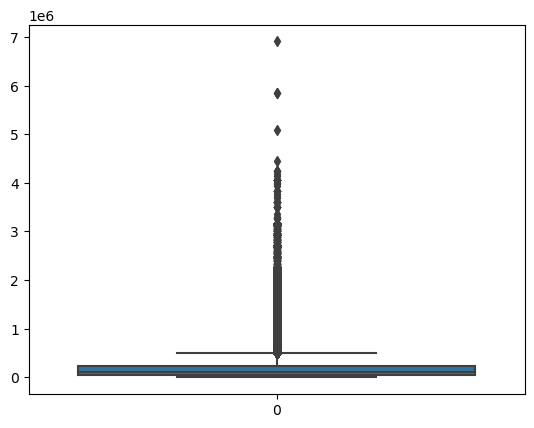

In [346]:
sns.boxplot(df_prev.AMT_GOODS_PRICE)
plt.show()

In [347]:
df_prev.AMT_GOODS_PRICE.quantile(q = [0.25,0.5,0.75,1])

0.25      50841.0
0.50     112320.0
0.75     234000.0
1.00    6905160.0
Name: AMT_GOODS_PRICE, dtype: float64

In [348]:
df_prev.AMT_GOODS_PRICE.mode()[0]

45000.0

In [349]:
df_prev.AMT_GOODS_PRICE.mean()

227847.27928334562

In [350]:
df_prev.AMT_ANNUITY.value_counts().head()

2250.0     31865
11250.0    13974
6750.0     13442
9000.0     12496
22500.0    11903
Name: AMT_ANNUITY, dtype: int64

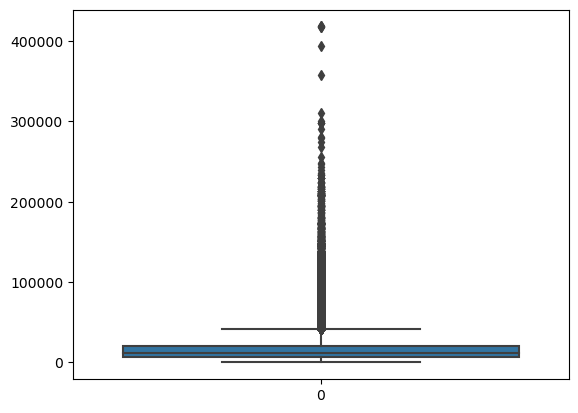

In [351]:
sns.boxplot(df_prev.AMT_ANNUITY)
plt.show()

In [352]:
df_prev.AMT_ANNUITY.quantile(q = [0.25,0.5,0.75,1])

0.25      6321.780
0.50     11250.000
0.75     20658.420
1.00    418058.145
Name: AMT_ANNUITY, dtype: float64

In [353]:
df_prev.AMT_ANNUITY.mode()[0]

2250.0

In [354]:
df_prev.AMT_ANNUITY.mean()

15955.120659452119

In [355]:
df_prev.CNT_PAYMENT.value_counts().head()

12.0    323049
6.0     190461
0.0     144985
10.0    141851
24.0    137764
Name: CNT_PAYMENT, dtype: int64

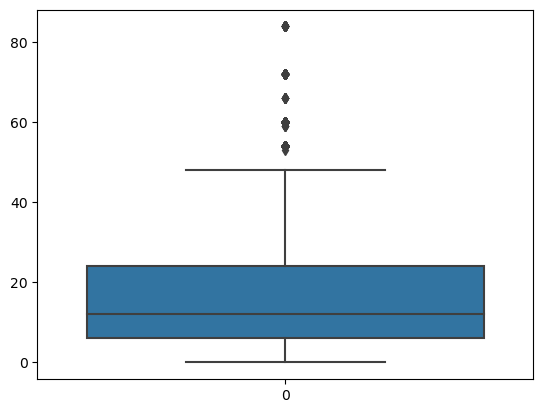

In [356]:
sns.boxplot(df_prev.CNT_PAYMENT)
plt.show()

In [357]:
df_prev.CNT_PAYMENT.quantile(q = [0.25,0.5,0.75,1])

0.25     6.0
0.50    12.0
0.75    24.0
1.00    84.0
Name: CNT_PAYMENT, dtype: float64

In [358]:
df_prev.CNT_PAYMENT.mode()[0]

12.0

In [359]:
df_prev.CNT_PAYMENT.mean()

16.0540815603274

In [360]:
null_df_under1 = null_df[(null_df['null_percentage'] > 0) & (null_df['null_percentage'] < 1)]

In [361]:
null_df_under1.sort_values(by = 'null_percentage', ascending = False)

,column_name,null_count,null_percentage
30,PRODUCT_COMBINATION,346,0.02


In [362]:
df_prev['PRODUCT_COMBINATION'].value_counts().head()

Cash                           285990
POS household with interest    263622
POS mobile with interest       220670
Cash X-Sell: middle            143883
Cash X-Sell: low               130248
Name: PRODUCT_COMBINATION, dtype: int64

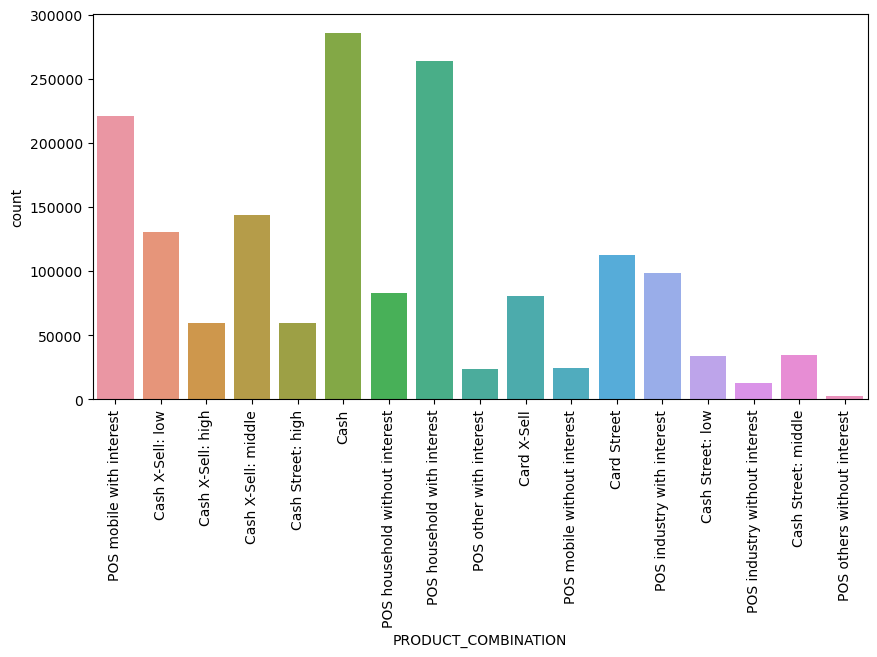

In [363]:
plt.figure(figsize = (10,5))
sns.countplot(data = df_prev, x = "PRODUCT_COMBINATION")
plt.xticks(rotation = 90)
plt.show()

In [364]:
df_prev['NAME_CASH_LOAN_PURPOSE'].value_counts(normalize = True).head()

XAP             0.552421
XNA             0.405887
Repairs         0.014229
Other           0.009345
Urgent needs    0.005036
Name: NAME_CASH_LOAN_PURPOSE, dtype: float64

In [365]:
df_prev['DAYS_DECISION'].value_counts()

-245     2444
-238     2390
-210     2375
-273     2350
-196     2315
         ... 
-2882     163
-2922     162
-2921     158
-2902     148
-1          2
Name: DAYS_DECISION, Length: 2922, dtype: int64

In [366]:
df_prev['DAYS_DECISION'].unique()

array([  -73,  -164,  -301, ..., -1967, -2389,    -1], dtype=int64)

In [367]:
df_prev['DAYS_DECISION'].nunique()

2922

In [368]:
df_prev['DAYS_DECISION'] = df_prev['DAYS_DECISION'].apply(lambda x: -x if x < 0 else x)

In [369]:
df_prev['DAYS_DECISION'].value_counts()

245     2444
238     2390
210     2375
273     2350
196     2315
        ... 
2882     163
2922     162
2921     158
2902     148
1          2
Name: DAYS_DECISION, Length: 2922, dtype: int64

In [370]:
df_prev['NAME_PAYMENT_TYPE'].value_counts(normalize = True)

Cash through the bank                        0.618814
XNA                                          0.375631
Non-cash from your account                   0.004905
Cashless from the account of the employer    0.000650
Name: NAME_PAYMENT_TYPE, dtype: float64

In [371]:
df_prev['CODE_REJECT_REASON'].value_counts(normalize = True)

XAP       0.810132
HC        0.104915
LIMIT     0.033337
SCO       0.022432
CLIENT    0.015828
SCOFR     0.007670
XNA       0.003140
VERIF     0.002116
SYSTEM    0.000429
Name: CODE_REJECT_REASON, dtype: float64

In [372]:
df_prev['NAME_CLIENT_TYPE'].value_counts(normalize=True)

Repeater     0.737188
New          0.180434
Refreshed    0.081217
XNA          0.001162
Name: NAME_CLIENT_TYPE, dtype: float64

In [373]:
df_prev[df_prev['NAME_CLIENT_TYPE'] == 'XNA'].head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,...,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
694,1044207,241230,Cash loans,NaN,0.0,0.0,NaN,SUNDAY,12,Y,...,XNA,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
3419,1167657,366138,Cash loans,55400.895,1354500.0,1451047.5,1354500.0,MONDAY,17,Y,...,XNA,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,36.0,low_normal,Cash X-Sell: low
3594,2609511,334664,Consumer loans,2223.990,20659.5,23112.0,20659.5,MONDAY,11,Y,...,XNA,Computers,POS,XNA,Country-wide,50,Consumer electronics,12.0,low_action,POS household without interest
5819,2092311,281867,Cash loans,NaN,0.0,0.0,NaN,MONDAY,13,Y,...,XNA,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
5990,2680830,335491,Cash loans,32048.460,877500.0,1016496.0,877500.0,MONDAY,9,Y,...,XNA,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,48.0,low_normal,Cash Street: low


In [374]:
df_prev['NAME_CLIENT_TYPE'] = df_prev['NAME_CLIENT_TYPE'].apply(lambda x: 'Repeater' if x == 'XNA' else x)

In [375]:
df_prev['NAME_CLIENT_TYPE'].value_counts(normalize=True)

Repeater     0.738350
New          0.180434
Refreshed    0.081217
Name: NAME_CLIENT_TYPE, dtype: float64

In [376]:
df_prev['AMT_ANNUITY'].value_counts().sort_values(ascending = False).head()

2250.0     31865
11250.0    13974
6750.0     13442
9000.0     12496
22500.0    11903
Name: AMT_ANNUITY, dtype: int64

In [377]:
(df_prev['AMT_ANNUITY'].value_counts(normalize = True).sort_values(ascending = False) * 100).head()

2250.0     2.454970
11250.0    1.076597
6750.0     1.035610
9000.0     0.962727
22500.0    0.917041
Name: AMT_ANNUITY, dtype: float64

In [378]:
df_prev.AMT_ANNUITY.quantile(q = [0.25,0.5,0.75,0.99,1])

0.25      6321.7800
0.50     11250.0000
0.75     20658.4200
0.99     69685.7886
1.00    418058.1450
Name: AMT_ANNUITY, dtype: float64

C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\3719826990.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dataset[column], color = 'purple')


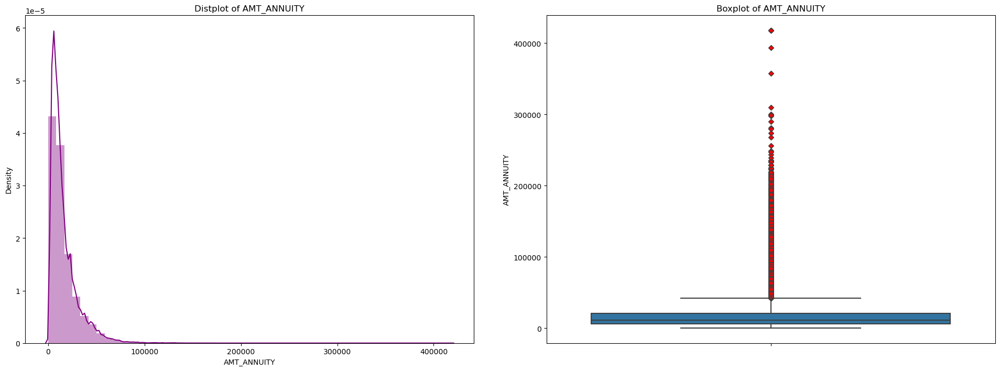

In [379]:
fn_dist_box(df_prev,'AMT_ANNUITY')

In [380]:
Q1 = df_prev['AMT_ANNUITY'].quantile(0.25)
Q3 = df_prev['AMT_ANNUITY'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

14336.64


In [381]:
Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value))
print("Max value after which outlier exist: {}".format(Max_value))

Min value before which outlier exist: -15183.18
Max value after which outlier exist: 42163.38


In [382]:
df_prev['AMT_APPLICATION'].value_counts().sort_values(ascending = False).head()

0.0         392402
45000.0      47831
225000.0     43543
135000.0     40678
450000.0     38905
Name: AMT_APPLICATION, dtype: int64

In [383]:
(df_prev['AMT_APPLICATION'].value_counts(normalize = True).sort_values(ascending = False) * 100).head()

0.0         23.494115
45000.0      2.863765
225000.0     2.607031
135000.0     2.435496
450000.0     2.329342
Name: AMT_APPLICATION, dtype: float64

In [384]:
df_prev.AMT_APPLICATION.quantile(q = [0.25,0.5,0.75,0.99,1])

0.25      18720.0
0.50      71046.0
0.75     180360.0
0.99    1350000.0
1.00    6905160.0
Name: AMT_APPLICATION, dtype: float64

C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\3719826990.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dataset[column], color = 'purple')


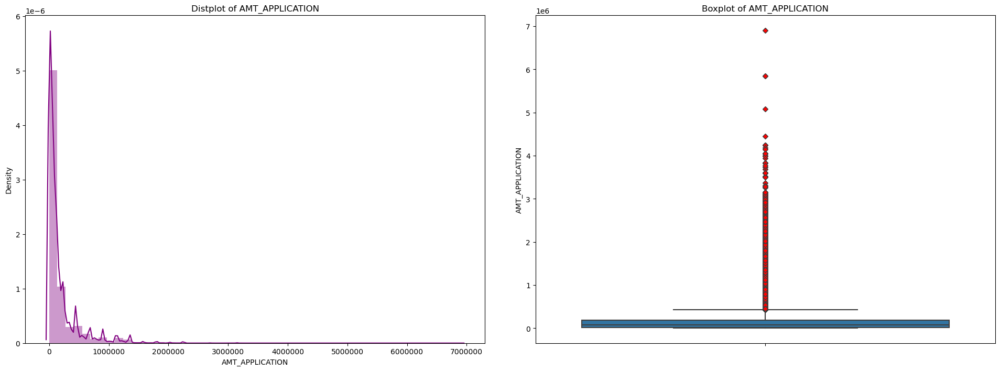

In [385]:
fn_dist_box(df_prev,'AMT_APPLICATION')

In [386]:
Q1 = df_prev['AMT_APPLICATION'].quantile(0.25)
Q3 = df_prev['AMT_APPLICATION'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

161640.0


In [387]:
Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value))
print("Max value after which outlier exist: {}".format(Max_value))

Min value before which outlier exist: -223740.0
Max value after which outlier exist: 422820.0


In [388]:
df_prev['AMT_CREDIT'].value_counts().sort_values(ascending = False).head()

0.0         336768
45000.0      35051
225000.0     21094
450000.0     19954
135000.0     18720
Name: AMT_CREDIT, dtype: int64

In [389]:
(df_prev['AMT_CREDIT'].value_counts(normalize = True).sort_values(ascending = False) * 100).head()

0.0         20.163177
45000.0      2.098595
225000.0     1.262953
450000.0     1.194698
135000.0     1.120815
Name: AMT_CREDIT, dtype: float64

In [390]:
df_prev.AMT_CREDIT.quantile(q = [0.25,0.5,0.75,0.99,1])

0.25      24160.5
0.50      80541.0
0.75     216418.5
0.99    1515377.7
1.00    6905160.0
Name: AMT_CREDIT, dtype: float64

C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\3719826990.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dataset[column], color = 'purple')


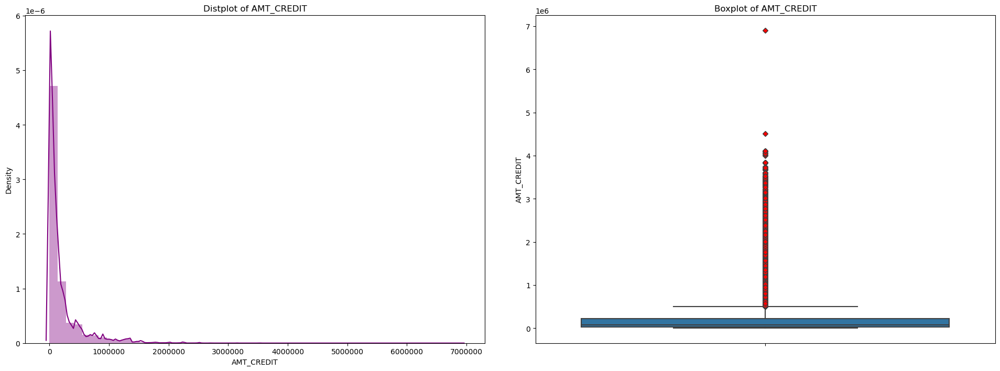

In [391]:
fn_dist_box(df_prev,'AMT_CREDIT')

In [392]:
Q1 = df_prev['AMT_CREDIT'].quantile(0.25)
Q3 = df_prev['AMT_CREDIT'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

192258.0


In [393]:
Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value))
print("Max value after which outlier exist: {}".format(Max_value))

Min value before which outlier exist: -264226.5
Max value after which outlier exist: 504805.5


In [394]:
df_merge = appl_data.merge(df_prev, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='inner')

In [395]:
appl_data.shape

(307511, 81)

In [396]:
df_prev.shape

(1670214, 26)

In [397]:
df_merge.shape

(1413701, 106)

In [398]:
df_merge.info(verbose = True,null_counts = True)

C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\1436989571.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  df_merge.info(verbose = True,null_counts = True)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413701 entries, 0 to 1413700
Data columns (total 106 columns):
 #    Column                        Non-Null Count    Dtype   
---   ------                        --------------    -----   
 0    SK_ID_CURR                    1413701 non-null  int64   
 1    TARGET                        1413701 non-null  int64   
 2    NAME_CONTRACT_TYPE_x          1413701 non-null  object  
 3    CODE_GENDER                   1413701 non-null  object  
 4    FLAG_OWN_CAR                  1413701 non-null  object  
 5    FLAG_OWN_REALTY               1413701 non-null  object  
 6    CNT_CHILDREN                  1413701 non-null  int64   
 7    AMT_INCOME_TOTAL              1413701 non-null  float64 
 8    AMT_CREDIT_x                  1413701 non-null  float64 
 9    AMT_ANNUITY_x                 1413608 non-null  float64 
 10   AMT_GOODS_PRICE_x             1412493 non-null  float64 
 11   NAME_TYPE_SUITE               1410175 non-null  object  
 12 

In [399]:
df_merge.shape

(1413701, 106)

In [400]:
df_merge[df_merge['SK_ID_CURR'] == 265681][['AMT_CREDIT_x','AMT_CREDIT_y']].head()

,AMT_CREDIT_x,AMT_CREDIT_y
654385,278460.0,109552.5
654386,278460.0,22234.5
654387,278460.0,225000.0
654388,278460.0,118989.0
654389,278460.0,337824.0


In [401]:
appl_data[appl_data['SK_ID_CURR'] == 265681][['AMT_CREDIT']].head()

,AMT_CREDIT
142895,278460.0


In [402]:
df_merge.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,SK_ID_PREV,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,HOUR_APPR_PROCESS_START_y,NFLAG_LAST_APPL_IN_DAY,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT
count,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413608e+06,1.412493e+06,1.413701e+06,1.413701e+06,1.413701e+06,...,1.413701e+06,1.106483e+06,1.413701e+06,1.413700e+06,1.094176e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.106488e+06
mean,2.784813e+05,8.655296e-02,4.048933e-01,1.733160e+05,5.875537e+05,2.701702e+04,5.277186e+05,2.074985e-02,1.632105e+04,7.266347e+04,...,1.922744e+06,1.583718e+04,1.752436e+05,1.963541e+05,2.264512e+05,1.247893e+01,9.964321e-01,8.803670e+02,3.149878e+02,1.605194e+01
std,1.028118e+05,2.811789e-01,7.173454e-01,1.985734e+05,3.849173e+05,1.395116e+04,3.532465e+05,1.334702e-02,4.344557e+03,1.433374e+05,...,5.327153e+05,1.472491e+04,2.936222e+05,3.194813e+05,3.159376e+05,3.331474e+00,5.962560e-02,7.835402e+02,7.695082e+03,1.456675e+01
min,1.000020e+05,0.000000e+00,0.000000e+00,2.565000e+04,4.500000e+04,1.615500e+03,4.050000e+04,2.900000e-04,7.489000e+03,0.000000e+00,...,1.000001e+06,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,-1.000000e+00,0.000000e+00
25%,1.893640e+05,0.000000e+00,0.000000e+00,1.125000e+05,2.700000e+05,1.682100e+04,2.385000e+05,1.003200e-02,1.273900e+04,1.042000e+03,...,1.461346e+06,6.257858e+03,1.975050e+04,2.488050e+04,4.982850e+04,1.000000e+01,1.000000e+00,2.710000e+02,-1.000000e+00,6.000000e+00
50%,2.789920e+05,0.000000e+00,0.000000e+00,1.575000e+05,5.084955e+05,2.492550e+04,4.500000e+05,1.885000e-02,1.604400e+04,2.401000e+03,...,1.922698e+06,1.122376e+04,7.087050e+04,8.059500e+04,1.102455e+05,1.200000e+01,1.000000e+00,5.820000e+02,4.000000e+00,1.200000e+01
75%,3.675560e+05,0.000000e+00,1.000000e+00,2.070000e+05,8.079840e+05,3.454200e+04,6.795000e+05,2.866300e-02,1.998000e+04,6.313000e+03,...,2.384012e+06,2.042078e+04,1.800000e+05,2.156400e+05,2.295000e+05,1.500000e+01,1.000000e+00,1.313000e+03,8.500000e+01,2.400000e+01
max,4.562550e+05,1.000000e+00,1.900000e+01,1.170000e+08,4.050000e+06,2.250000e+05,4.050000e+06,7.250800e-02,2.520100e+04,3.652430e+05,...,2.845381e+06,4.180581e+05,5.850000e+06,4.509688e+06,5.850000e+06,2.300000e+01,1.000000e+00,2.922000e+03,4.000000e+06,8.400000e+01


In [403]:
df_merge.select_dtypes(include = "object").columns

Index(['NAME_CONTRACT_TYPE_x', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START_x', 'ORGANIZATION_TYPE',
       'YEARS_BIRTH_CATEGORY', 'YEARS_REGISTRATION_CATEGORY',
       'NAME_CONTRACT_TYPE_y', 'WEEKDAY_APPR_PROCESS_START_y',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON',
       'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO',
       'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY',
       'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

In [404]:
len(df_merge.select_dtypes(include = "object").columns)

29

In [405]:
df_merge.select_dtypes(include=["int64","float64"]).columns

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT_x', 'AMT_ANNUITY_x', 'AMT_GOODS_PRICE_x',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE',
       'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START_x',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3',
       'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6',
       'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG

In [406]:
len(df_merge.select_dtypes(include=["int64","float64"]).columns)

76

In [407]:
df_merge['NAME_CONTRACT_STATUS'].value_counts().sort_values(ascending = False)

Approved        886099
Canceled        259441
Refused         245390
Unused offer     22771
Name: NAME_CONTRACT_STATUS, dtype: int64

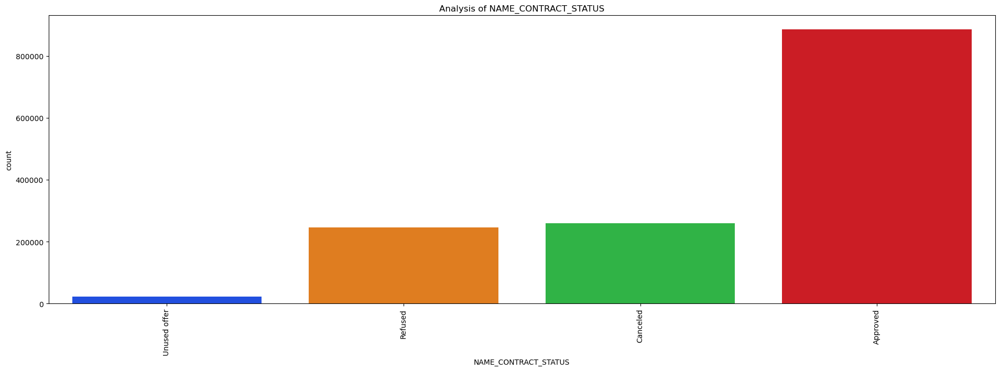

In [408]:
fn_uni_countplot_merge('NAME_CONTRACT_STATUS')

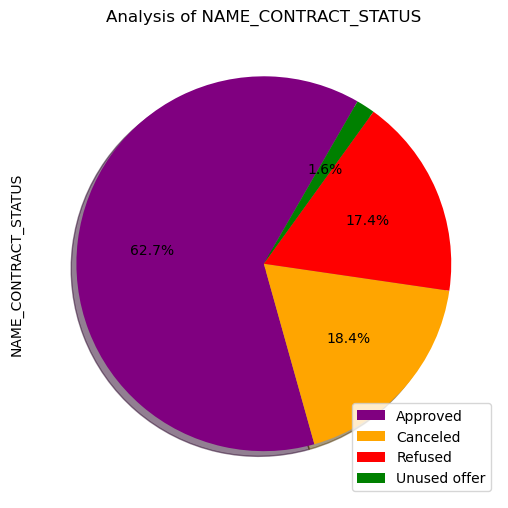

In [409]:
fn_uni_piechart_merge('NAME_CONTRACT_STATUS')

In [410]:
df_merge['NAME_CLIENT_TYPE'].value_counts().sort_values(ascending = False)

Repeater     1039225
New           259540
Refreshed     114936
Name: NAME_CLIENT_TYPE, dtype: int64

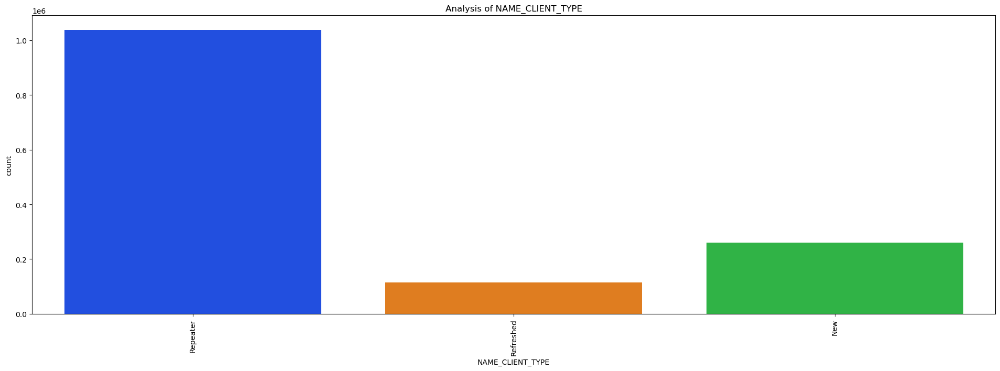

In [411]:
fn_uni_countplot_merge('NAME_CLIENT_TYPE')

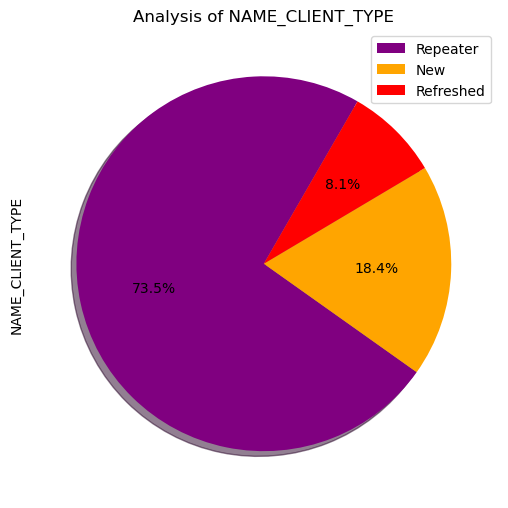

In [412]:
fn_uni_piechart_merge('NAME_CLIENT_TYPE')

In [413]:
df_merge['CHANNEL_TYPE'].value_counts().sort_values(ascending = False)

Credit and cash offices       600342
Country-wide                  423062
Stone                         183508
Regional / Local               92472
Contact center                 58891
AP+ (Cash loan)                49624
Channel of corporate sales      5396
Car dealer                       406
Name: CHANNEL_TYPE, dtype: int64

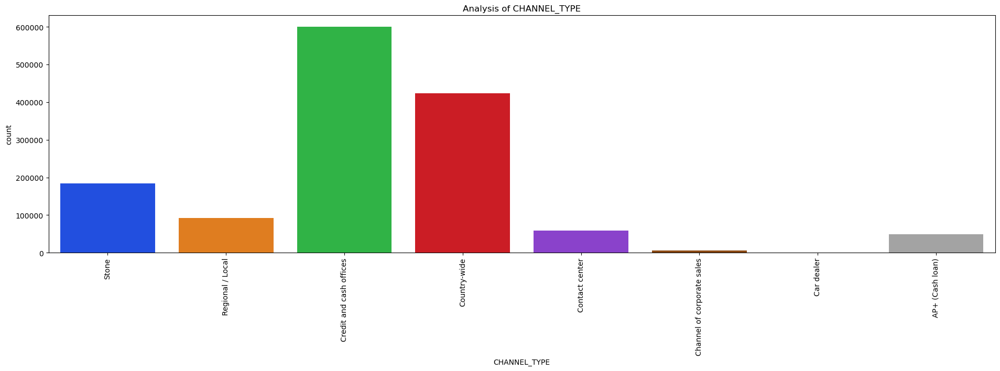

In [414]:
fn_uni_countplot_merge('CHANNEL_TYPE')

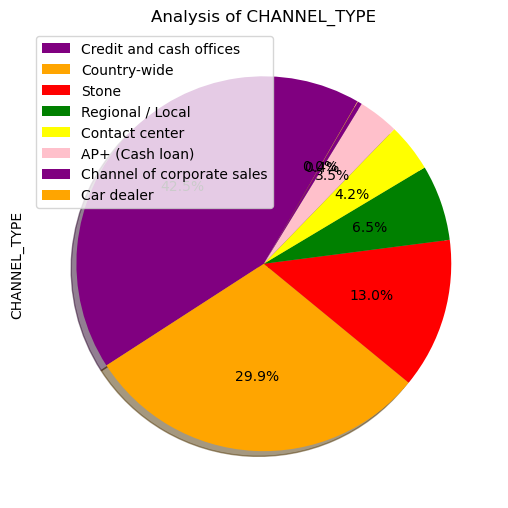

In [415]:
fn_uni_piechart_merge('CHANNEL_TYPE')

In [416]:
df_merge['NAME_YIELD_GROUP'].value_counts().sort_values(ascending = False)

XNA           429198
middle        324971
high          306061
low_normal    274884
low_action     78587
Name: NAME_YIELD_GROUP, dtype: int64

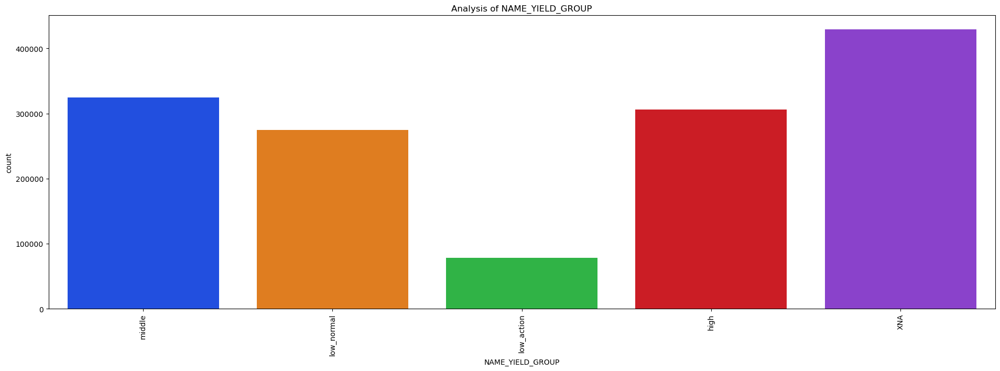

In [417]:
fn_uni_countplot_merge('NAME_YIELD_GROUP')

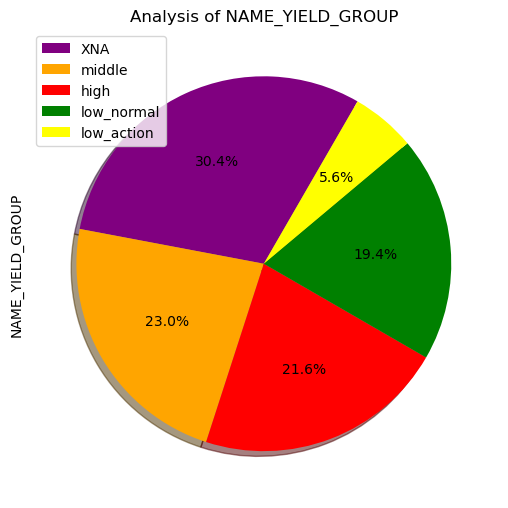

In [418]:
fn_uni_piechart_merge('NAME_YIELD_GROUP')

In [419]:
df_merge['NAME_GOODS_CATEGORY'].value_counts().sort_values(ascending = False).head()

XNA                     797209
Mobile                  193743
Consumer Electronics    104785
Computers                89923
Audio/Video              85502
Name: NAME_GOODS_CATEGORY, dtype: int64

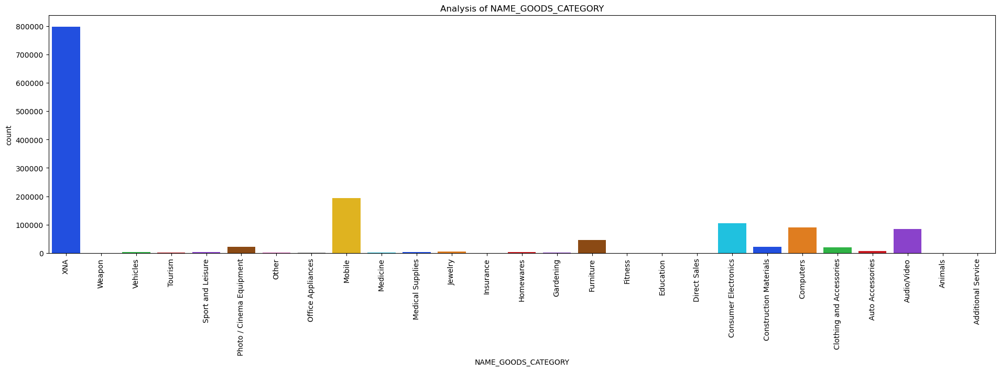

In [420]:
fn_uni_countplot_merge('NAME_GOODS_CATEGORY')

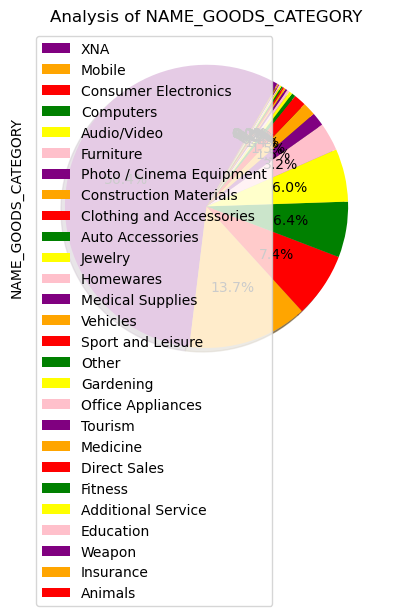

In [421]:
fn_uni_piechart_merge('NAME_GOODS_CATEGORY')

In [422]:
Q1 = df_merge['AMT_APPLICATION'].quantile(0.25)
Q3 = df_merge['AMT_APPLICATION'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

160249.5


In [423]:
Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value))
print("Max value after which outlier exist: {}".format(Max_value))

Min value before which outlier exist: -220623.75
Max value after which outlier exist: 420374.25


C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\227445826.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_merge[df_merge['AMT_APPLICATION'] <= Max_value].AMT_APPLICATION, hist=True)


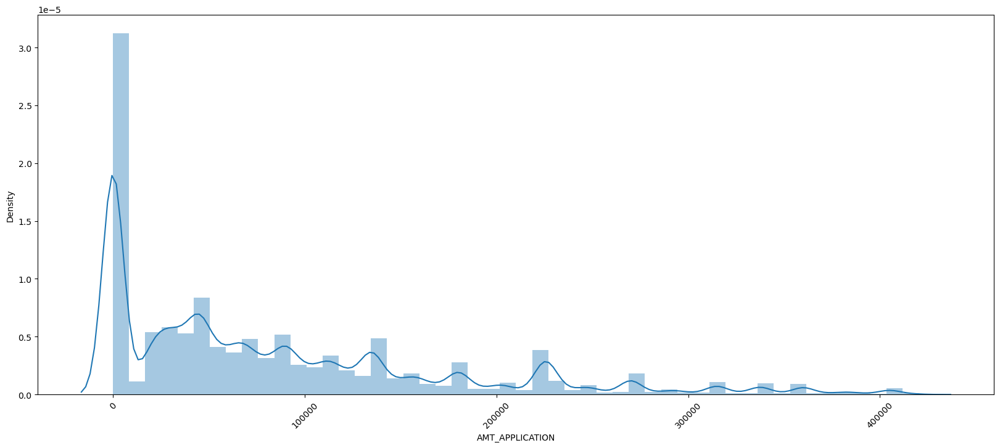

In [424]:
plt.figure(figsize = [20,8])
sns.distplot(df_merge[df_merge['AMT_APPLICATION'] <= Max_value].AMT_APPLICATION, hist=True)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.show()

In [425]:
Q1 = df_merge['AMT_ANNUITY_y'].quantile(0.25)
Q3 = df_merge['AMT_ANNUITY_y'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

14162.917500000001


In [426]:
Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value))
print("Max value after which outlier exist: {}".format(Max_value))

Min value before which outlier exist: -14986.518750000001
Max value after which outlier exist: 41665.15125


C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\2278963469.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_merge[df_merge['AMT_ANNUITY_y'] <= Max_value].AMT_ANNUITY_y, hist=True)


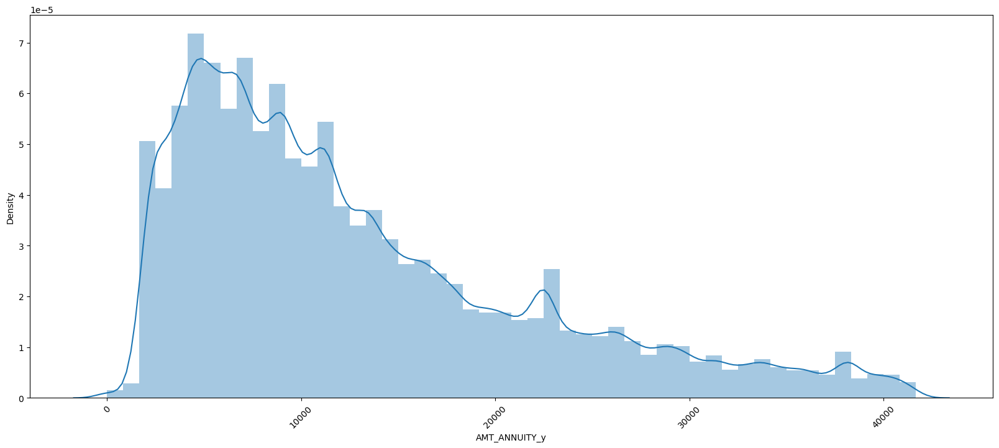

In [427]:
plt.figure(figsize = [20,8])
sns.distplot(df_merge[df_merge['AMT_ANNUITY_y'] <= Max_value].AMT_ANNUITY_y, hist=True)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.show()

In [428]:
Q1 = df_merge['AMT_CREDIT_y'].quantile(0.25)
Q3 = df_merge['AMT_CREDIT_y'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

190759.5


In [429]:
Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value))
print("Max value after which outlier exist: {}".format(Max_value))

Min value before which outlier exist: -261258.75
Max value after which outlier exist: 501779.25


C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\3890020882.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_merge[df_merge['AMT_CREDIT_y'] <= Max_value].AMT_CREDIT_y, hist=True)


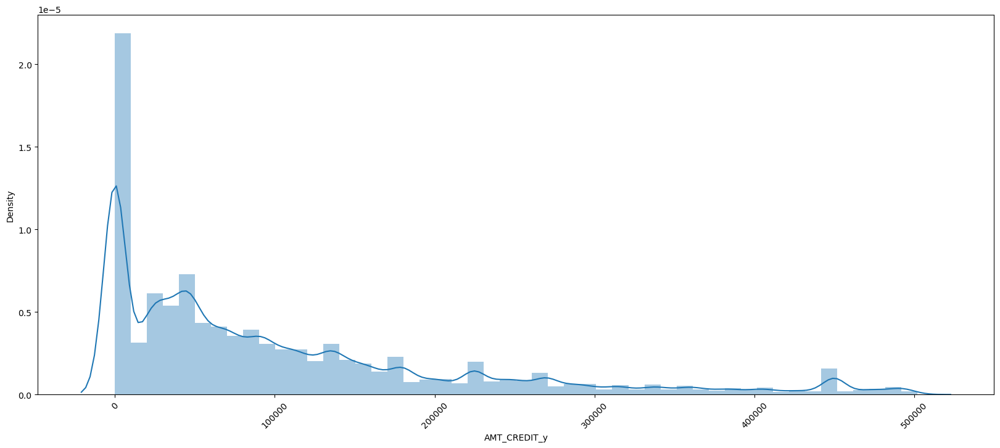

In [430]:
plt.figure(figsize = [20,8])
sns.distplot(df_merge[df_merge['AMT_CREDIT_y'] <= Max_value].AMT_CREDIT_y, hist=True)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.show()

In [431]:
Q1 = df_merge['AMT_GOODS_PRICE_y'].quantile(0.25)
Q3 = df_merge['AMT_GOODS_PRICE_y'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

179671.5


In [432]:
Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value))
print("Max value after which outlier exist: {}".format(Max_value))

Min value before which outlier exist: -219678.75
Max value after which outlier exist: 499007.25


C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\1869466618.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_merge[df_merge['AMT_GOODS_PRICE_y'] <= Max_value].AMT_GOODS_PRICE_y, hist=True)


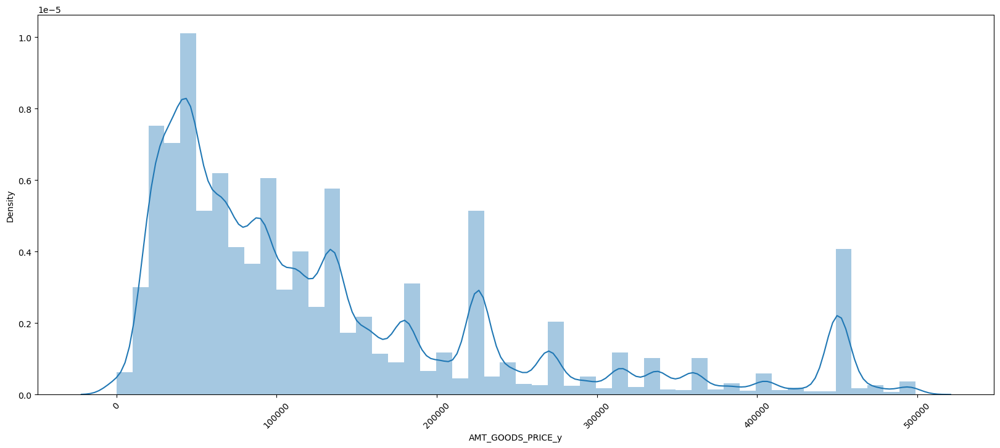

In [433]:
plt.figure(figsize = [20,8])
sns.distplot(df_merge[df_merge['AMT_GOODS_PRICE_y'] <= Max_value].AMT_GOODS_PRICE_y, hist=True)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.show()

In [434]:
corr_df = df_merge[['AMT_ANNUITY_x', 'AMT_APPLICATION','AMT_CREDIT_x', 'AMT_GOODS_PRICE_x',
                    'AMT_ANNUITY_y', 'AMT_CREDIT_y', 'AMT_GOODS_PRICE_y', 'CNT_PAYMENT']].corr()

In [435]:
corr_df.head()

,AMT_ANNUITY_x,AMT_APPLICATION,AMT_CREDIT_x,AMT_GOODS_PRICE_x,AMT_ANNUITY_y,AMT_CREDIT_y,AMT_GOODS_PRICE_y,CNT_PAYMENT
AMT_ANNUITY_x,1.000000,0.112063,0.758441,0.762251,0.202537,0.107646,0.134160,-0.005500
AMT_APPLICATION,0.112063,1.000000,0.118809,0.120734,0.809972,0.975683,0.999871,0.683056
AMT_CREDIT_x,0.758441,0.118809,1.000000,0.986310,0.152961,0.116746,0.137746,0.037726
AMT_GOODS_PRICE_x,0.762251,0.120734,0.986310,1.000000,0.155065,0.117226,0.138942,0.036073
AMT_ANNUITY_y,0.202537,0.809972,0.152961,0.155065,1.000000,0.817977,0.822204,0.398084


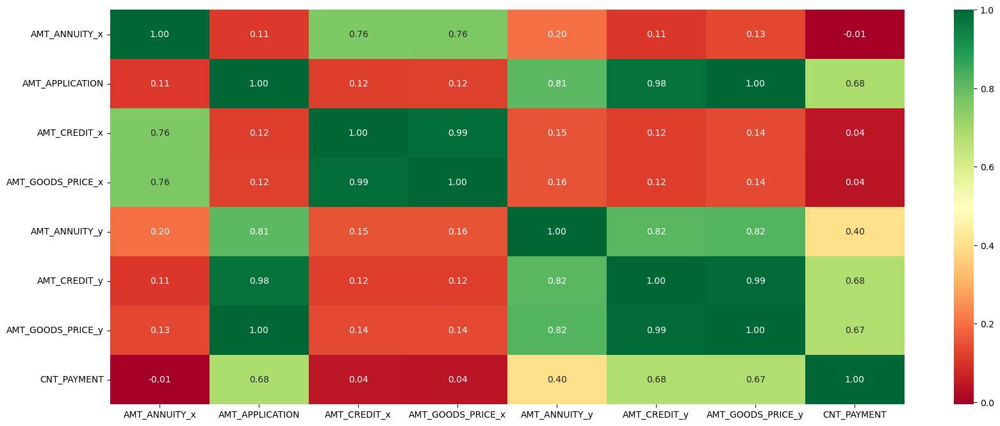

In [436]:
plt.figure(figsize = (20,8))
sns.heatmap(data = corr_df, annot = True, cmap = "RdYlGn", cbar = True, fmt='.2f')
plt.show()

In [437]:
max_value1_AMT_GOODS_PRICE_y = outlier_range(df_merge,'AMT_GOODS_PRICE_y')
max_value1_AMT_GOODS_PRICE_y

499007.25

In [438]:
max_value1_AMT_CREDIT_y = outlier_range(df_merge,'AMT_CREDIT_y')
max_value1_AMT_CREDIT_y

501779.25

C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\1604401354.py:9: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(pad = 4)
C:\Users\Admin\anaconda3.1\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


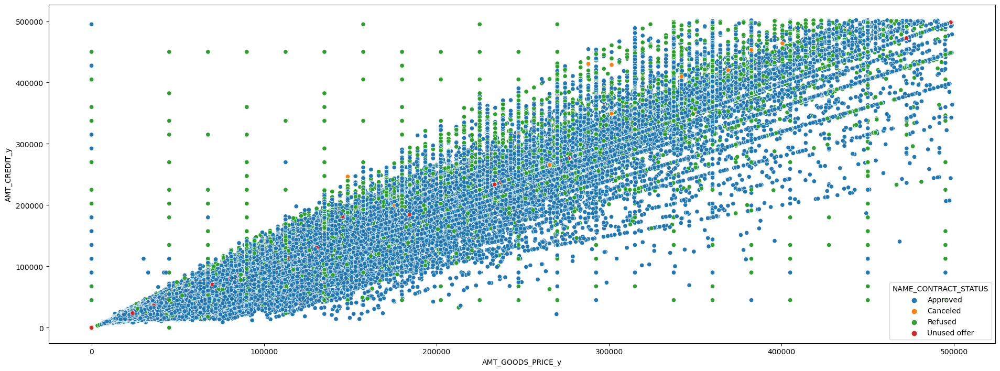

In [439]:
plt.figure(figsize = [20,8])

sns.scatterplot(x = df_merge[df_merge['AMT_GOODS_PRICE_y'] < max_value1_AMT_GOODS_PRICE_y].AMT_GOODS_PRICE_y, 
                y = df_merge[df_merge['AMT_CREDIT_y'] < max_value1_AMT_CREDIT_y].AMT_CREDIT_y,
                data = df_merge,hue = 'NAME_CONTRACT_STATUS')
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

In [440]:
max_value1_AMT_ANNUITY_y = outlier_range(df_merge,'AMT_ANNUITY_y')
max_value1_AMT_ANNUITY_y

41665.15125

In [441]:
max_value1_AMT_CREDIT_y = outlier_range(df_merge,'AMT_CREDIT_y')
max_value1_AMT_CREDIT_y

501779.25

C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\1984223004.py:9: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(pad = 4)
C:\Users\Admin\anaconda3.1\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


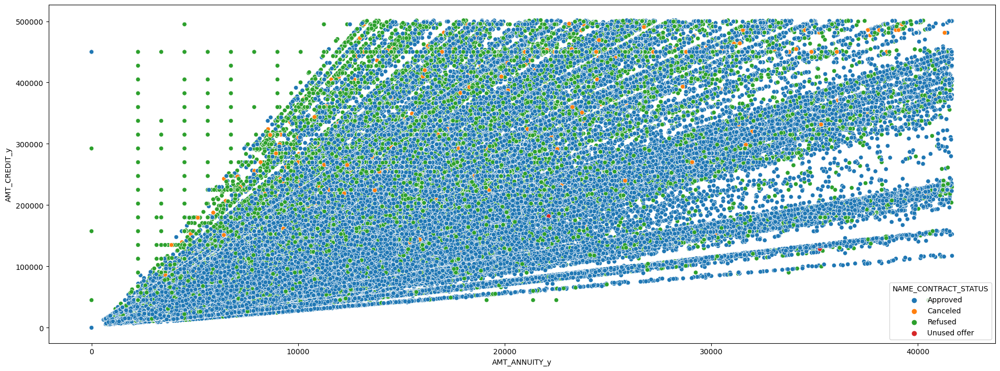

In [442]:
plt.figure(figsize = [20,8])

sns.scatterplot(x = df_merge[df_merge['AMT_ANNUITY_y'] < max_value1_AMT_ANNUITY_y].AMT_ANNUITY_y, 
                y = df_merge[df_merge['AMT_CREDIT_y'] < max_value1_AMT_CREDIT_y].AMT_CREDIT_y,
                data = df_merge,hue = 'NAME_CONTRACT_STATUS')
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

In [443]:
max_value1_AMT_APPLICATION = outlier_range(df_merge,'AMT_APPLICATION')
max_value1_AMT_APPLICATION

420374.25

In [444]:
max_value1_AMT_GOODS_PRICE_y = outlier_range(df_merge,'AMT_GOODS_PRICE_y')
max_value1_AMT_GOODS_PRICE_y

499007.25

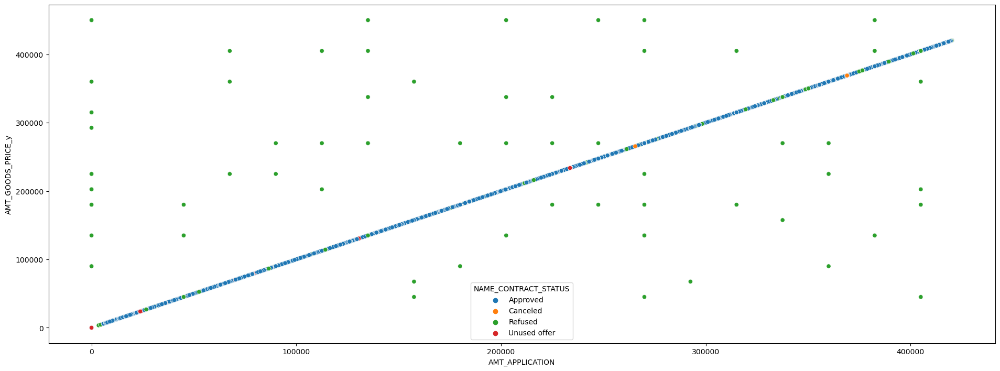

In [445]:
plt.figure(figsize = [20,8])

sns.scatterplot(x = df_merge[df_merge['AMT_APPLICATION'] < max_value1_AMT_APPLICATION].AMT_APPLICATION, 
                y = df_merge[df_merge['AMT_GOODS_PRICE_y'] < max_value1_AMT_GOODS_PRICE_y].AMT_GOODS_PRICE_y,
                data = df_merge,hue = 'NAME_CONTRACT_STATUS')
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

In [446]:
max_value1_AMT_APPLICATION = outlier_range(df_merge,'AMT_APPLICATION')
max_value1_AMT_APPLICATION

420374.25

In [447]:
max_value1_AMT_CREDIT_y= outlier_range(df_merge,'AMT_CREDIT_y')
max_value1_AMT_CREDIT_y

501779.25

C:\Users\Admin\AppData\Local\Temp\ipykernel_18032\2416866457.py:9: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(pad = 4)
C:\Users\Admin\anaconda3.1\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


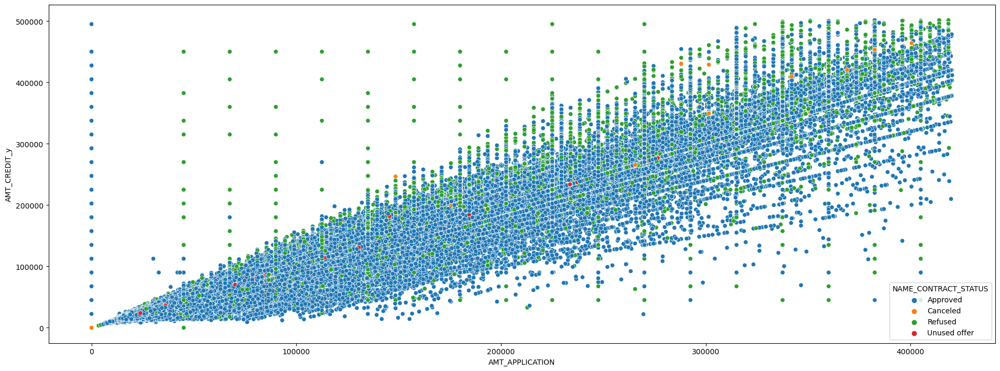

In [448]:
plt.figure(figsize = [20,8])

sns.scatterplot(x = df_merge[df_merge['AMT_APPLICATION'] < max_value1_AMT_APPLICATION].AMT_APPLICATION, 
                y = df_merge[df_merge['AMT_CREDIT_y'] < max_value1_AMT_CREDIT_y].AMT_CREDIT_y,
                data = df_merge,hue = 'NAME_CONTRACT_STATUS')
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

In [449]:
max_value_AMT_CREDIT_y = outlier_range(df_merge,'AMT_CREDIT_y')
max_value_AMT_CREDIT_y

501779.25

In [450]:
df_merge.groupby(by = ['NAME_CONTRACT_STATUS','CODE_GENDER']).AMT_CREDIT_y.describe().head()

count           mean            std  min  \
NAME_CONTRACT_STATUS CODE_GENDER                                                
Approved             F            598648.0  207549.311783  279373.334031  0.0   
                     M            287450.0  189288.803455  267951.423666  0.0   
Canceled             F            179044.0   24215.178872  160577.583695  0.0   
                     M             80397.0   26053.062186  174648.755786  0.0   
Refused              F            163327.0  376530.997804  458660.510607  0.0   

                                          25%       50%       75%        max  
NAME_CONTRACT_STATUS CODE_GENDER                                              
Approved             F            48078.00000  104935.5  229500.0  4509688.5  
                     M            45430.61625   94140.0  197820.0  4050000.0  
Canceled             F                0.00000       0.0       0.0  3847104.0  
                     M                0.00000       0.0       0.0  3524220.0  
Refused              F            66159.00000  202500.0  513531.0  4085550.0

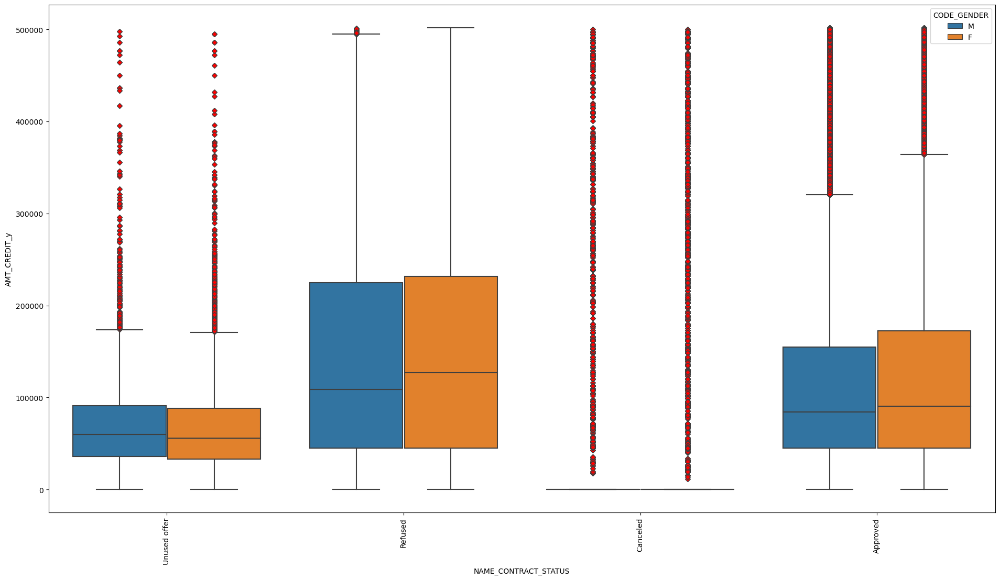

In [451]:
fn_bi_boxplot_merge('NAME_CONTRACT_STATUS','AMT_CREDIT_y',max_value_AMT_CREDIT_y,'CODE_GENDER')

In [452]:
max_value_AMT_ANNUITY_y= outlier_range(df_merge,'AMT_ANNUITY_y')
max_value_AMT_ANNUITY_y

41665.15125

In [453]:
df_merge.groupby(by = ['NAME_CONTRACT_STATUS','CODE_GENDER']).AMT_ANNUITY_y.describe().head()

count          mean           std  \
NAME_CONTRACT_STATUS CODE_GENDER                                         
Approved             F            598644.0  14660.846512  13624.355984   
                     M            287448.0  14513.242696  13996.128661   
Canceled             F              6073.0  28917.041110  17584.221541   
                     M              2687.0  33066.864965  19936.904912   
Refused              F            141148.0  20318.152592  16580.619818   

                                       min          25%         50%  \
NAME_CONTRACT_STATUS CODE_GENDER                                      
Approved             F               0.000   5927.98500  10424.6100   
                     M               0.000   5790.79125  10010.4075   
Canceled             F            1324.305  16236.18000  25409.7450   
                     M            1780.875  19257.16500  29550.6000   
Refused              F               0.000   8765.83125  15750.0000   

                                          75%         max  
NAME_CONTRACT_STATUS CODE_GENDER                           
Approved             F            18314.93250  393868.665  
                     M            17900.91000  229274.955  
Canceled             F            38133.00000  210950.865  
                     M            43799.46750  218713.545  
Refused              F            27512.04375  418058.145

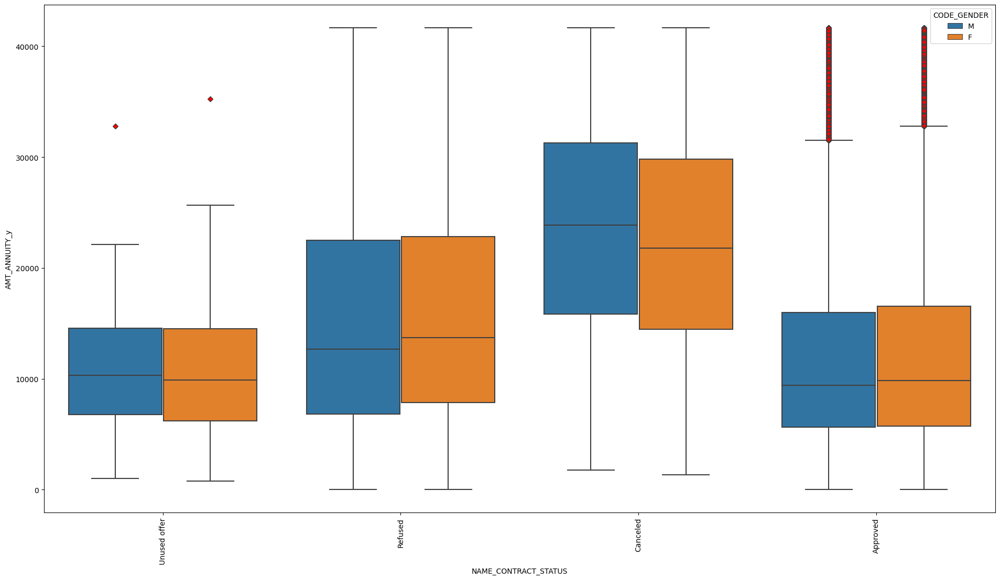

In [454]:
fn_bi_boxplot_merge('NAME_CONTRACT_STATUS','AMT_ANNUITY_y',max_value_AMT_ANNUITY_y,'CODE_GENDER')

In [455]:
max_value_AMT_GOODS_PRICE_y= outlier_range(df_merge,'AMT_GOODS_PRICE_y')
max_value_AMT_GOODS_PRICE_y

499007.25

In [456]:
df_merge.groupby(by = ['NAME_CLIENT_TYPE','NAME_CONTRACT_STATUS']).AMT_GOODS_PRICE_y.describe().head()

count           mean            std  \
NAME_CLIENT_TYPE NAME_CONTRACT_STATUS                                           
New              Approved              242297.0  103479.305513  137367.958950   
                 Canceled                 186.0  481775.177419  576602.841868   
                 Refused                12219.0  169230.614094  280373.275781   
                 Unused offer            1867.0   79936.321020   61318.331628   
Refreshed        Approved               79838.0  188335.881616  245136.327024   

                                           min       25%          50%  \
NAME_CLIENT_TYPE NAME_CONTRACT_STATUS                                   
New              Approved                  0.0   38106.0   67500.0000   
                 Canceled              22455.0  135000.0  225000.0000   
                 Refused                   0.0   45000.0   97452.0000   
                 Unused offer              0.0   39325.5   66758.8500   
Refreshed        Approved                  0.0   54859.5  106469.8875   

                                             75%        max  
NAME_CLIENT_TYPE NAME_CONTRACT_STATUS                        
New              Approved              121500.00  5850000.0  
                 Canceled              675000.00  3150000.0  
                 Refused               180000.00  4050000.0  
                 Unused offer          104231.25   688059.0  
Refreshed        Approved              219150.00  3150000.0

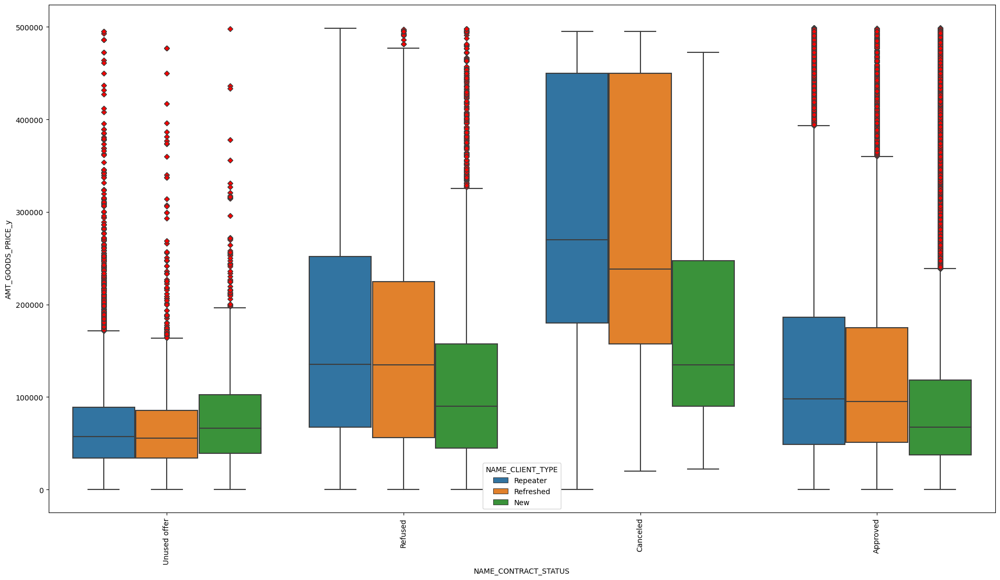

In [457]:
fn_bi_boxplot_merge('NAME_CONTRACT_STATUS','AMT_GOODS_PRICE_y',max_value_AMT_GOODS_PRICE_y,'NAME_CLIENT_TYPE')

In [458]:
max_value_AMT_CREDIT_y= outlier_range(df_merge,'AMT_CREDIT_y')
max_value_AMT_CREDIT_y

501779.25

In [459]:
df_merge.groupby(by = ['NAME_PORTFOLIO','NAME_CONTRACT_STATUS']).AMT_CREDIT_y.describe().head()

count          mean            std  \
NAME_PORTFOLIO NAME_CONTRACT_STATUS                                         
Cards          Approved              82407.0  2.276054e+05  215931.325545   
               Canceled                417.0  2.287338e+05  186123.227075   
               Refused               39159.0  2.397627e+05  207093.853558   
               Unused offer              1.0  2.025000e+05            NaN   
Cars           Approved                241.0  1.122764e+06  644748.216327   

                                          min       25%       50%        75%  \
NAME_PORTFOLIO NAME_CONTRACT_STATUS                                            
Cards          Approved                   0.0   67500.0  157500.0   292500.0   
               Canceled               45000.0  112500.0  180000.0   270000.0   
               Refused                    0.0   90000.0  180000.0   270000.0   
               Unused offer          202500.0  202500.0  202500.0   202500.0   
Cars           Approved              202500.0  735520.5  980100.0  1293556.5   

                                           max  
NAME_PORTFOLIO NAME_CONTRACT_STATUS             
Cards          Approved              1350000.0  
               Canceled               900000.0  
               Refused               2250000.0  
               Unused offer           202500.0  
Cars           Approved              4509688.5

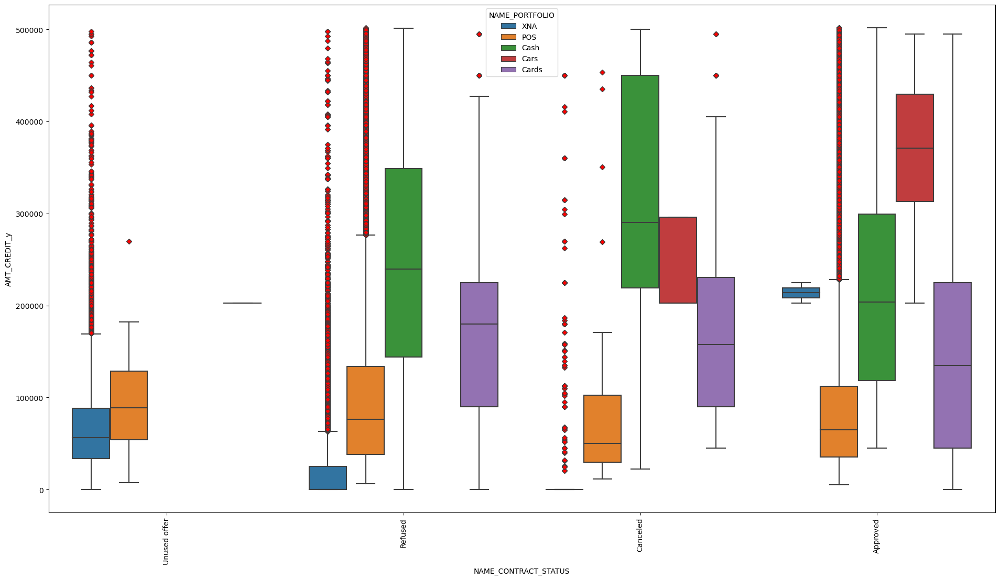

In [460]:
fn_bi_boxplot_merge('NAME_CONTRACT_STATUS','AMT_CREDIT_y',max_value_AMT_CREDIT_y,'NAME_PORTFOLIO')

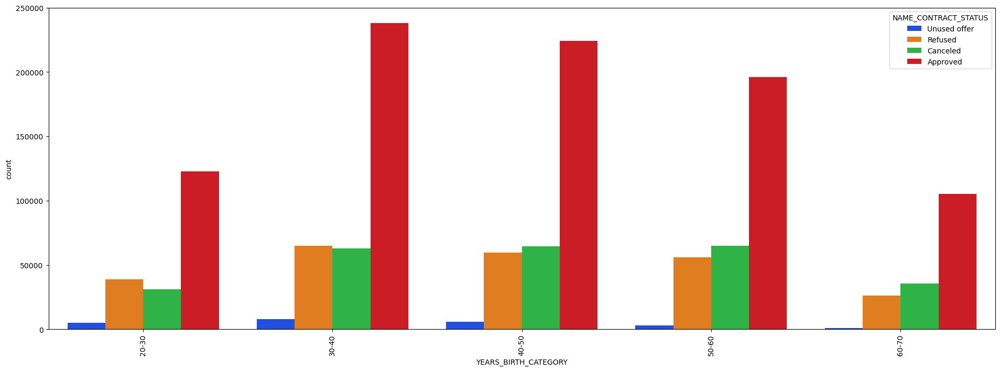

In [461]:
fn_bi_countplot_merge('YEARS_BIRTH_CATEGORY','NAME_CONTRACT_STATUS')

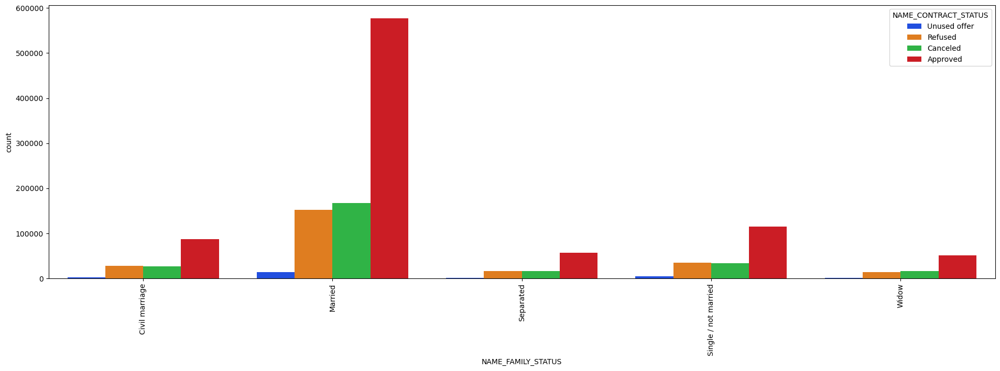

In [462]:
fn_bi_countplot_merge('NAME_FAMILY_STATUS','NAME_CONTRACT_STATUS')

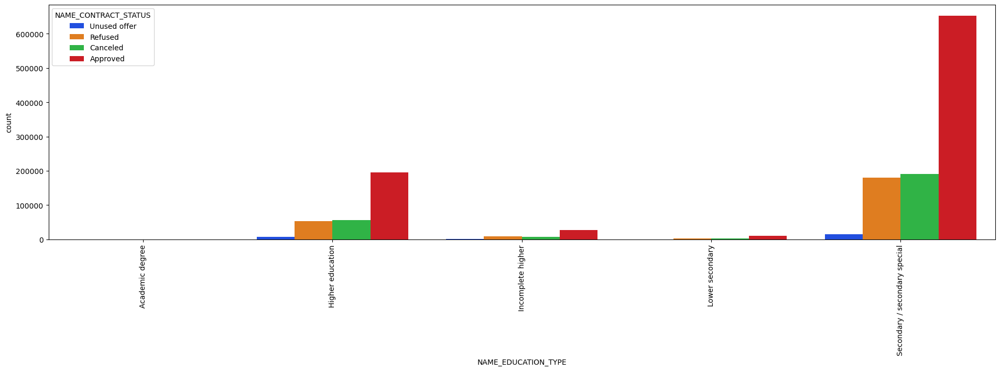

In [463]:
fn_bi_countplot_merge('NAME_EDUCATION_TYPE','NAME_CONTRACT_STATUS')

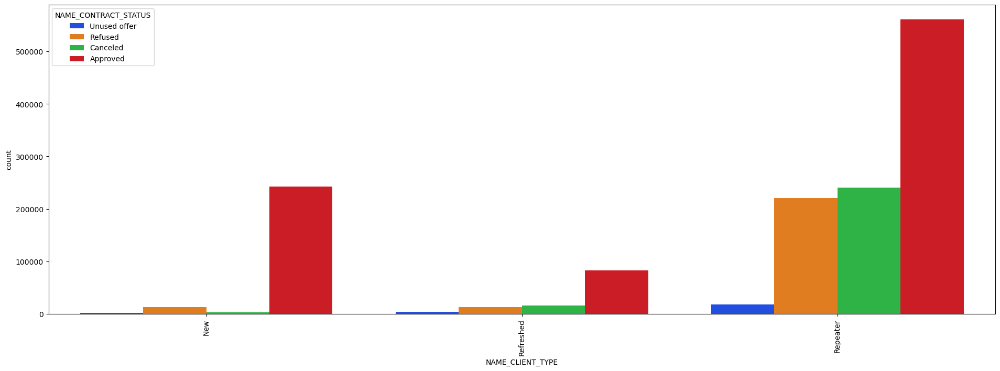

In [464]:
fn_bi_countplot_merge('NAME_CLIENT_TYPE','NAME_CONTRACT_STATUS')